In [1]:
import sys
sys.path.insert(1,'/home/bwhiteak/ChaosESN/ESN_utils/')

import numpy as np
import torch
import rc_tools as rct
import rc_analysis as rca
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from scipy.optimize import fsolve
from scipy.signal import argrelextrema
import warnings
import time

import pdb

from skopt.space import Real,Integer
from skopt.utils import use_named_args
from skopt import gp_minimize

from scipy.integrate import odeint
from mpl_toolkits.mplot3d import Axes3D

import warnings
warnings.filterwarnings("ignore")

from jupyterthemes import jtplot
jtplot.style()

np.random.seed(11)
torch.set_printoptions(precision=10)
dtype = torch.float32 

print(f'Python: {sys.version}')
print(f'Numpy: {np.__version__}')
print(f'Torch: {torch.__version__}')

DEVICE = 'cuda:7'

FREERUN = 20
DT = .02

rho = 28.0
sigma = 10.0
beta = 8/3

def f(state, t):
    x,y,z = state
    return sigma*(y-x), x*(rho-z)-y, x*y - beta*z

state0 = [1.,1.,1.]
t = np.arange(0,300+FREERUN,DT)
states = odeint(f,state0,t)

Python: 3.8.12 (default, Oct 12 2021, 13:49:34) 
[GCC 7.5.0]
Numpy: 1.21.2
Torch: 1.10.0


In [2]:
log_z = np.log(states[:,2])

MU_X = np.mean(log_z)
signal = log_z-MU_X

M = signal.shape[0] - int(FREERUN/DT)
K = 1
L = 1
RF = .5
TEST = 1000
LEAD = 100
BURNIN = 100
REG = 1e-8
TRAINLENGTH = M-TEST


MINMAX = np.max(states[:TRAINLENGTH+TEST,2]) - \
         np.min(states[:TRAINLENGTH+TEST,2])
BINS = 50

print(f'Signal length M={M}')

Signal length M=15000


In [3]:
def get_weight_matricesGPU(k,n,l,ri,ro):
    win = torch.rand((n,k),dtype=dtype,
                      device=torch.device(DEVICE)).sub(.5).mul(ri)
    wfb = torch.zeros((n,l),dtype=dtype, device=torch.device(DEVICE))
    wout = torch.rand((l,n+k),dtype=dtype,
                      device=torch.device(DEVICE)).sub(.5).mul(ro)
    return win, wfb, wout

def set_vectorsGPU(n,l,r):
    x0 = torch.rand((n,1),dtype=dtype,
                      device=torch.device(DEVICE)).sub(.5).mul(r)
    y0 = torch.zeros((l,1),dtype=dtype, device=torch.device(DEVICE))
    return x0, y0

def update_res_stateGPU(wnet,xt,uxy,a,g):
    z = torch.matmul(wnet,uxy)
    return torch.mul(xt,1-a) + torch.mul(torch.tanh(z),a*g)

def predict_yGPU(wout,xu):
    return torch.matmul(wout, xu)

def get_matrixGPU(n,r,sr):
    A = (torch.rand((n,n),dtype=dtype,
                   device=torch.device(DEVICE))-.5)*r
    At = torch.transpose(A,0,1)
    D = torch.diag(torch.diag(A))   
    W = A + At - D
    eig = torch.eig(W, eigenvectors=False)
    wsr = torch.max(torch.abs(eig[0]))
    return W.div(wsr).mul(sr)

def resize_spaces(mn, mx, best, isAlpha=False):
    #pdb.set_trace()
    if(best.size==0):
        new_mn = np.max([0, mn - .5*mn])
        new_mx = 1.5*mx
    else:
        best_mn = np.min(best)
        best_mx = np.max(best)
        mn_bound = (best_mn-mn)/2
        mx_bound = (mx -best_mx)/2
        new_mn, new_mx = best_mn-mn_bound, best_mx+mx_bound
        print(f'\nBest mn:{best_mn:.3f}\t mn:{best_mx:.3f}')
        print(f'New bounds mn--mx: {mn_bound:.3f}--{mx_bound:.3f}')
    if(isAlpha):
        if(new_mx>1):
            new_mx = 1
    
    return new_mn, new_mx

In [4]:
min_a, max_a = .55, .7
min_sr, max_sr = .8, 1.
min_g, max_g = 1.4, 1.7
min_ri, max_ri = .001, 4.
min_rr, max_rr = .001, 4.
space = [Real(min_a, max_a, name='a'),
                 Real(min_sr, max_sr, name='sr'),
                 Real(min_g, max_g, name='amp'), 
                 Real(min_ri, max_ri, name='ri'),
                 Real(min_rr, max_rr, name='rr')
                ]

@use_named_args(space)
def loop(a=1.0,sr=1.0,amp=1.0,ri=1.0,rr=1.0):
    start = time.time()
    global running_error, s, counter, signal, N, ref, rn, \
           alphas, rhos, gammas, inScales, resScales
    
    ut = torch.zeros((1,1),dtype=dtype,
                     device=torch.device(DEVICE))
    tp = torch.zeros((1,1),dtype=dtype,
                     device=torch.device(DEVICE))
    
    Wres = get_matrixGPU(N,rr,sr)
    Win, Wfb, Wout = get_weight_matricesGPU(K,N,L,ri,RF)
    Wnet = torch.cat((Win,Wres,Wfb),1)
    xt, yt = set_vectorsGPU(N,L,rr)

    states = torch.zeros((TRAINLENGTH, N+K),dtype=dtype,
                         device=DEVICE)
    targets = torch.zeros((TRAINLENGTH),dtype=dtype, device=DEVICE)
    for i in range(TRAINLENGTH):
        ut[0,0] = s[i]
        tp[0,0] = s[i+1]
        targets[i] = s[i+1]
        uxy = torch.cat((ut,xt,yt),0)
        xt1 = update_res_stateGPU(Wnet,xt,uxy,a,amp)
        xu = torch.transpose(torch.cat((xt1,ut),0),0,1).to(DEVICE)
        states[i,:] = xu[0,:]
        xt, yt = xt1, tp 

    state = states.detach().cpu().numpy()

    torch.cuda.synchronize()
    wout = rct.get_trained_weights(state[BURNIN:],
                                   signal[BURNIN+1:TRAINLENGTH+1],
                                   REG)
    Wout = torch.from_numpy(wout.reshape(L,N+K)).type(dtype).cuda(DEVICE)
    torch.cuda.synchronize()

    predictions = torch.zeros((M+int(FREERUN/DT),1),
                              dtype=dtype,
                              device=torch.device(DEVICE))

    xt, yt = set_vectorsGPU(N,L,rr)
    ut.fill_(0.0)
    for i in range(M+int(FREERUN/DT)):
        if(i < TRAINLENGTH):
            ut[0,0] = s[i]
        else:
            ut = yt
        uxy = torch.cat((ut,xt,yt),0)
        xt1 = update_res_stateGPU(Wnet,xt,uxy,a,amp)
        xu = torch.cat((xt1,ut),0).to(DEVICE)
        yt1 = predict_yGPU(Wout,xu)
        predictions[i] = yt1[0,0]
        xt, yt = xt1, yt1

    yHat_GPU = predictions.detach().cpu().numpy()
    
    nrmse = 1000.0
    try:
        nrmse = rca.NRMSE(np.exp(signal[TRAINLENGTH:TRAINLENGTH+TEST]+MU_X),
                          np.exp(yHat_GPU[TRAINLENGTH:TRAINLENGTH+TEST]+MU_X),
                          MINMAX) 
    except:
        pass
    
    
    av = signal[TRAINLENGTH:TRAINLENGTH+TEST].reshape(TEST,1)
    bv = np.squeeze(yHat_GPU[TRAINLENGTH:TRAINLENGTH+TEST]).reshape(TEST,1)
    num = np.squeeze(np.dot(av.T,bv))
    den = np.linalg.norm(av)*np.linalg.norm(bv)
    cosine_similarity = num/den
    cosine_distance = 1 - cosine_similarity
    dist = cosine_distance
    
    loss = nrmse + dist
    if(np.isnan(loss) or (np.isinf(loss) or (loss > 1000.0))):
        loss = 1000
    
    if((loss < running_error) & (loss < .7)):
        alphas.append(a)
        rhos.append(sr)
        gammas.append(amp)
        inScales.append(ri)
        resScales.append(rr)
        running_error = loss
        wnet = Wnet.detach().cpu().numpy()
        currentParams = np.array([a,sr,amp,ri,rr,loss])
        
        fig = plt.figure(figsize=(10,8))
        ax1 = plt.subplot(111)
        ax1.plot(signal[TRAINLENGTH-LEAD:], label='Target')
        ax1.plot(yHat_GPU[TRAINLENGTH-LEAD:], label='GPU')
        ax1.axvline(LEAD,c='orange',linestyle='dashed')
        ax1.axvline(LEAD+TEST,c='r',linestyle='dashed')
        ax1.set_ylim(-4,4)
        ax1.legend()
        plt.show()
        fig.savefig(f'./Z_Saved_Models/Z_sz{N}_ref{ref}_run{rn}_iter{counter}.pdf',
                    format='pdf', bbox_inches='tight', pad_inches=.01)
        plt.close()
        
        np.save(f'./Z_Saved_Models/Z_it{counter}_{N}_{ref}_{rn}_Wnet',wnet)
        np.save(f'./Z_Saved_Models/Z_it{counter}_{N}_{ref}_{rn}_Preds',yHat_GPU)
        np.save(f'./Z_Saved_Models/Z_it{counter}_{N}_{ref}_{rn}_InstanceParams',currentParams)
        print(f' Iter={counter} a={a:.3f} sr={sr:.3f} amp={amp:.3f}',
              f' ri={ri:.3f} rr={rr:.3f} loss={loss:3f}\n\n')
    ####### Running info ##############################
    print(f'Iter: {counter} #### Diagnostic {loss:3f}   Time {(time.time()-start):.2f}',
          f' Best {running_error:.3f} NRMSE {nrmse:.3f} CD {dist:.3f}')
    ###### Store this run #############################
    counter += 1
    return loss

********** Size 300 -- Run 0 ***********
Iter: 0 #### Diagnostic 1000.000000   Time 12.74  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 1 #### Diagnostic 1000.000000   Time 8.67  Best 1000.000 NRMSE 1000.000 CD 0.976
Iter: 2 #### Diagnostic 1000.000000   Time 6.93  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 0.745191   Time 8.12  Best 1000.000 NRMSE 0.185 CD 0.560
Iter: 4 #### Diagnostic 1000.000000   Time 8.78  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 7.90  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1.234706   Time 7.28  Best 1000.000 NRMSE 0.275 CD 0.959
Iter: 7 #### Diagnostic 1000.000000   Time 5.66  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 8.69  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 6.49  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 7.06  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 100

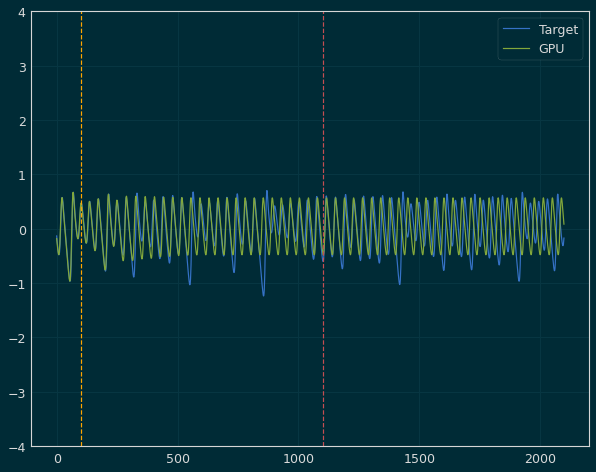

 Iter=26 a=0.614 sr=0.991 amp=1.524  ri=2.974 rr=1.201 loss=0.498788


Iter: 26 #### Diagnostic 0.498788   Time 7.08  Best 0.499 NRMSE 0.142 CD 0.356
Iter: 27 #### Diagnostic 1000.000000   Time 6.33  Best 0.499 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 0.846211   Time 9.12  Best 0.499 NRMSE 0.201 CD 0.645
Iter: 29 #### Diagnostic 1000.000000   Time 9.07  Best 0.499 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 10.09  Best 0.499 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 6.80  Best 0.499 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 6.89  Best 0.499 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 5.88  Best 0.499 NRMSE 1000.000 CD nan
Iter: 34 #### Diagnostic 1000.000000   Time 9.11  Best 0.499 NRMSE 1000.000 CD nan
Iter: 35 #### Diagnostic 1000.000000   Time 8.38  Best 0.499 NRMSE 1000.000 CD nan
Iter: 36 #### Diagnostic 1000.000000   Time 11.14  Best 0.499 NRMSE 1000.000 CD nan
Iter: 37 #### Diagnost

Iter: 22 #### Diagnostic 1000.000000   Time 6.91  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 5.50  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 5.19  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 6.72  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 6.92  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 8.87  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 8.23  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 6.94  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 7.28  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 6.32  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 6.42  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 6.56  Best

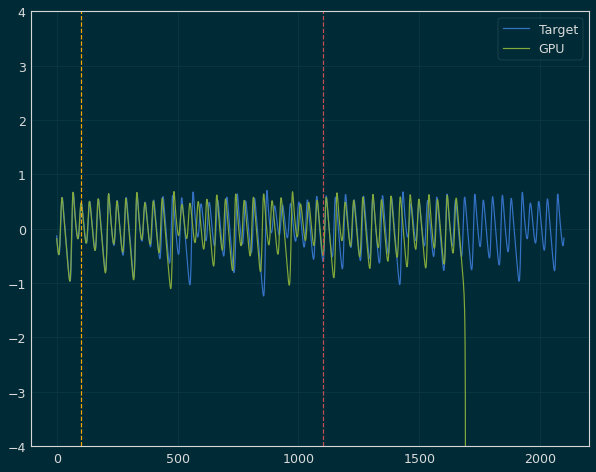

 Iter=47 a=0.569 sr=0.942 amp=1.692  ri=0.779 rr=2.614 loss=0.678843


Iter: 47 #### Diagnostic 0.678843   Time 6.65  Best 0.679 NRMSE 0.179 CD 0.500
Iter: 48 #### Diagnostic 1000.000000   Time 7.86  Best 0.679 NRMSE 1000.000 CD nan
Iter: 49 #### Diagnostic 1000.000000   Time 7.38  Best 0.679 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1000.000000   Time 5.72  Best 0.679 NRMSE 1000.000 CD nan


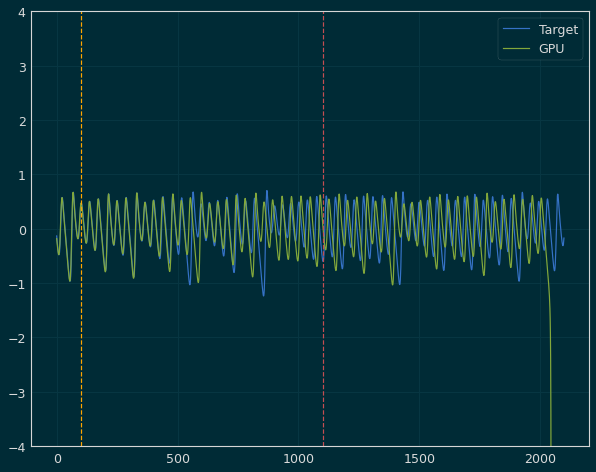

 Iter=51 a=0.645 sr=0.921 amp=1.495  ri=2.202 rr=2.540 loss=0.659442


Iter: 51 #### Diagnostic 0.659442   Time 8.28  Best 0.659 NRMSE 0.173 CD 0.487
Iter: 52 #### Diagnostic 1000.000000   Time 6.34  Best 0.659 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 1000.000000   Time 4.65  Best 0.659 NRMSE 1000.000 CD nan
Iter: 54 #### Diagnostic 1000.000000   Time 6.84  Best 0.659 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 7.42  Best 0.659 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 9.43  Best 0.659 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 7.46  Best 0.659 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 7.64  Best 0.659 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 5.37  Best 0.659 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1000.000000   Time 8.45  Best 0.659 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 7.81  Best 0.659 NRMSE 1000.000 CD nan
Iter: 62 #### Diagno

Iter: 46 #### Diagnostic 1000.000000   Time 6.36  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 47 #### Diagnostic 1000.000000   Time 6.16  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 48 #### Diagnostic 1000.000000   Time 8.12  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 49 #### Diagnostic 1000.000000   Time 7.69  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1000.000000   Time 6.95  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 51 #### Diagnostic 1000.000000   Time 5.96  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 52 #### Diagnostic 0.874914   Time 8.06  Best 1000.000 NRMSE 0.211 CD 0.664
Iter: 53 #### Diagnostic 1000.000000   Time 6.63  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 54 #### Diagnostic 1000.000000   Time 8.34  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 6.54  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 7.08  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 7.65  Best 100

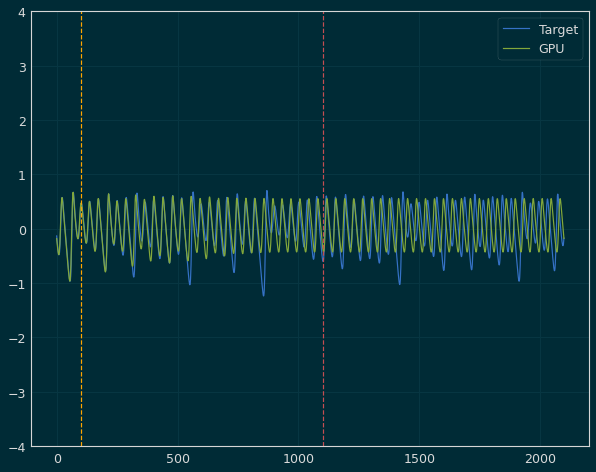

 Iter=71 a=0.558 sr=0.991 amp=1.635  ri=2.159 rr=3.991 loss=0.460474


Iter: 71 #### Diagnostic 0.460474   Time 6.09  Best 0.460 NRMSE 0.137 CD 0.324
Iter: 72 #### Diagnostic 1000.000000   Time 8.06  Best 0.460 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 1000.000000   Time 6.08  Best 0.460 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 1000.000000   Time 5.94  Best 0.460 NRMSE 1000.000 CD nan
Iter: 75 #### Diagnostic 1000.000000   Time 6.12  Best 0.460 NRMSE 1000.000 CD nan
Iter: 76 #### Diagnostic 1000.000000   Time 7.09  Best 0.460 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 7.69  Best 0.460 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 7.62  Best 0.460 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 7.37  Best 0.460 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 6.95  Best 0.460 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1000.000000   Time 5.50  Best 0.460 NRMSE 1000.000 CD nan
Iter: 82 #### Diagno

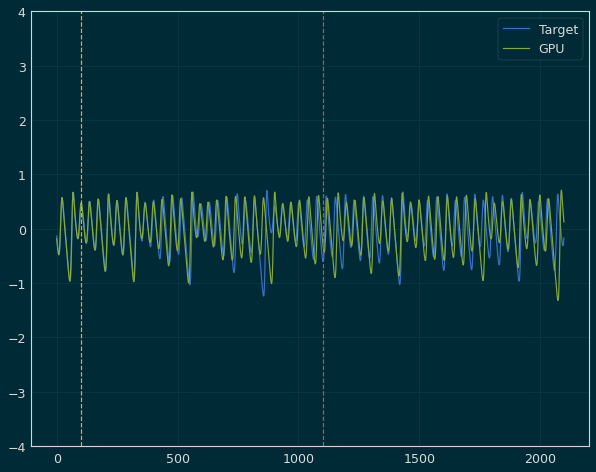

 Iter=23 a=0.635 sr=0.987 amp=1.645  ri=2.529 rr=3.021 loss=0.494112


Iter: 23 #### Diagnostic 0.494112   Time 11.74  Best 0.494 NRMSE 0.147 CD 0.348
Iter: 24 #### Diagnostic 1000.000000   Time 8.73  Best 0.494 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 7.87  Best 0.494 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 5.59  Best 0.494 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1.526364   Time 7.13  Best 0.494 NRMSE 0.530 CD 0.996
Iter: 28 #### Diagnostic 1000.000000   Time 7.58  Best 0.494 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 7.86  Best 0.494 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 5.22  Best 0.494 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1.164117   Time 6.12  Best 0.494 NRMSE 0.190 CD 0.974
Iter: 32 #### Diagnostic 1000.000000   Time 7.85  Best 0.494 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 8.54  Best 0.494 NRMSE 1000.000 CD nan
Iter: 34 #### Diagnostic 10

Iter: 19 #### Diagnostic 1000.000000   Time 6.20  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 8.44  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 11.04  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 9.40  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 6.35  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 7.29  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 7.37  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 6.63  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 7.17  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 6.71  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 5.95  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 8.36  Bes

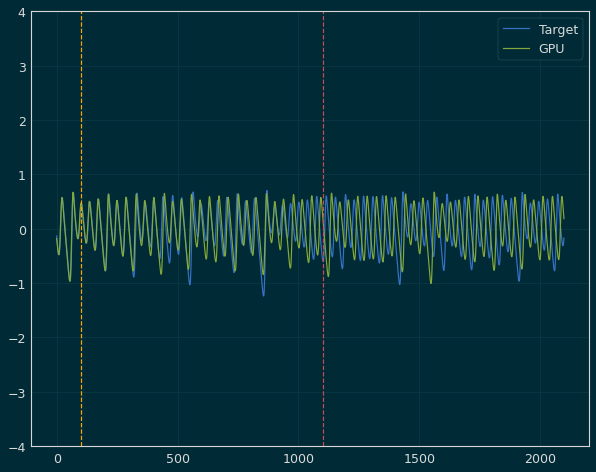

 Iter=33 a=0.640 sr=0.876 amp=1.459  ri=0.310 rr=1.339 loss=0.585904


Iter: 33 #### Diagnostic 0.585904   Time 8.91  Best 0.586 NRMSE 0.172 CD 0.414
Iter: 34 #### Diagnostic 1000.000000   Time 6.37  Best 0.586 NRMSE 1000.000 CD nan


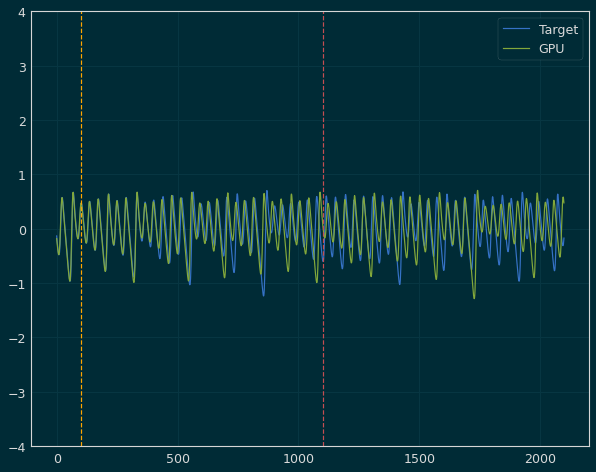

 Iter=35 a=0.622 sr=0.955 amp=1.653  ri=2.101 rr=2.390 loss=0.577979


Iter: 35 #### Diagnostic 0.577979   Time 7.72  Best 0.578 NRMSE 0.166 CD 0.412
Iter: 36 #### Diagnostic 1000.000000   Time 7.44  Best 0.578 NRMSE 1000.000 CD nan
Iter: 37 #### Diagnostic 1000.000000   Time 5.61  Best 0.578 NRMSE 1000.000 CD nan
Iter: 38 #### Diagnostic 1000.000000   Time 7.98  Best 0.578 NRMSE 1000.000 CD nan
Iter: 39 #### Diagnostic 1000.000000   Time 8.96  Best 0.578 NRMSE 1000.000 CD nan
Iter: 40 #### Diagnostic 1.197521   Time 7.59  Best 0.578 NRMSE 0.198 CD 1.000
Iter: 41 #### Diagnostic 1000.000000   Time 6.21  Best 0.578 NRMSE 1000.000 CD nan
Iter: 42 #### Diagnostic 1000.000000   Time 6.07  Best 0.578 NRMSE 1000.000 CD nan
Iter: 43 #### Diagnostic 1000.000000   Time 7.47  Best 0.578 NRMSE 1000.000 CD nan
Iter: 44 #### Diagnostic 1000.000000   Time 6.43  Best 0.578 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 1000.000000   Time 9.65  Best 0.578 NRMSE 1000.000 CD nan
Iter: 46 #### Diagnostic

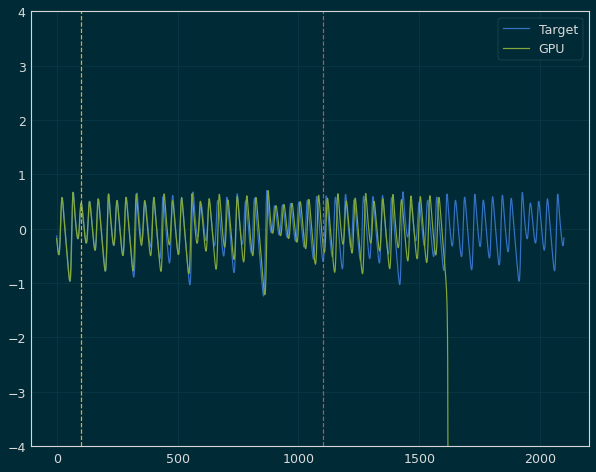

 Iter=12 a=0.600 sr=0.900 amp=1.616  ri=1.488 rr=0.635 loss=0.374799


Iter: 12 #### Diagnostic 0.374799   Time 8.34  Best 0.375 NRMSE 0.133 CD 0.242
Iter: 13 #### Diagnostic 1000.000000   Time 6.08  Best 0.375 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 7.08  Best 0.375 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 0.552490   Time 5.55  Best 0.375 NRMSE 0.160 CD 0.393
Iter: 16 #### Diagnostic 1000.000000   Time 6.53  Best 0.375 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 6.23  Best 0.375 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 8.69  Best 0.375 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 9.82  Best 0.375 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 6.87  Best 0.375 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 9.14  Best 0.375 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 5.57  Best 0.375 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic

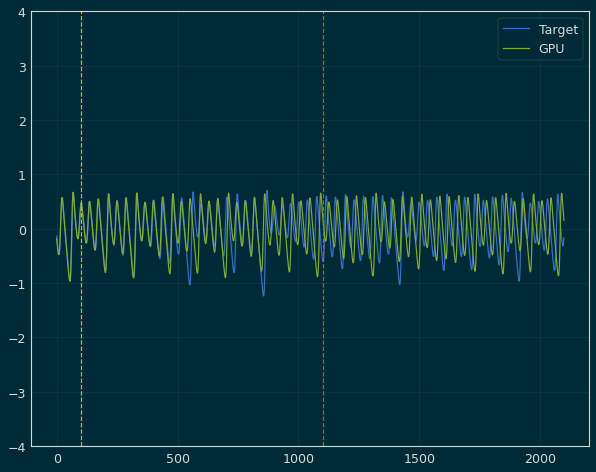

 Iter=3 a=0.611 sr=0.819 amp=1.673  ri=2.692 rr=3.306 loss=0.646877


Iter: 3 #### Diagnostic 0.646877   Time 10.33  Best 0.647 NRMSE 0.173 CD 0.474
Iter: 4 #### Diagnostic 1000.000000   Time 6.58  Best 0.647 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 6.96  Best 0.647 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1000.000000   Time 6.83  Best 0.647 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 7.63  Best 0.647 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 7.06  Best 0.647 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 7.01  Best 0.647 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 9.39  Best 0.647 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 7.16  Best 0.647 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 8.39  Best 0.647 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 8.56  Best 0.647 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 10

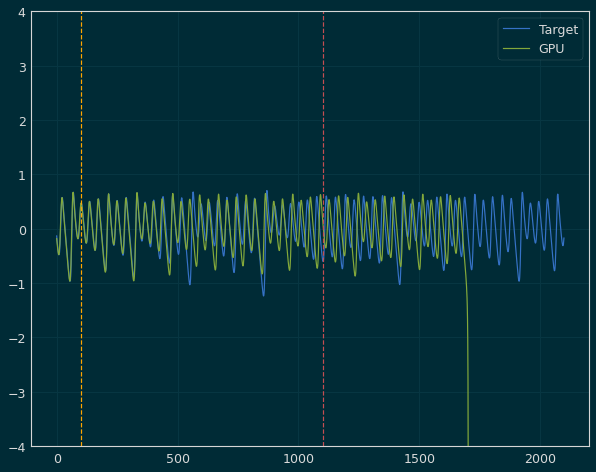

 Iter=35 a=0.697 sr=0.944 amp=1.427  ri=1.573 rr=2.581 loss=0.605614


Iter: 35 #### Diagnostic 0.605614   Time 8.55  Best 0.606 NRMSE 0.169 CD 0.436
Iter: 36 #### Diagnostic 1000.000000   Time 6.99  Best 0.606 NRMSE 1000.000 CD nan
Iter: 37 #### Diagnostic 1000.000000   Time 9.11  Best 0.606 NRMSE 1000.000 CD nan
Iter: 38 #### Diagnostic 0.878642   Time 9.54  Best 0.606 NRMSE 0.208 CD 0.670
Iter: 39 #### Diagnostic 1000.000000   Time 9.72  Best 0.606 NRMSE 1000.000 CD nan
Iter: 40 #### Diagnostic 0.879113   Time 9.68  Best 0.606 NRMSE 0.193 CD 0.686
Iter: 41 #### Diagnostic 1000.000000   Time 5.56  Best 0.606 NRMSE 1000.000 CD nan
Iter: 42 #### Diagnostic 1000.000000   Time 6.69  Best 0.606 NRMSE 1000.000 CD nan
Iter: 43 #### Diagnostic 1000.000000   Time 6.94  Best 0.606 NRMSE 1000.000 CD nan
Iter: 44 #### Diagnostic 0.887728   Time 9.29  Best 0.606 NRMSE 0.208 CD 0.679
Iter: 45 #### Diagnostic 1000.000000   Time 9.02  Best 0.606 NRMSE 1000.000 CD nan
Iter: 46 #### Diagnostic 1000.00

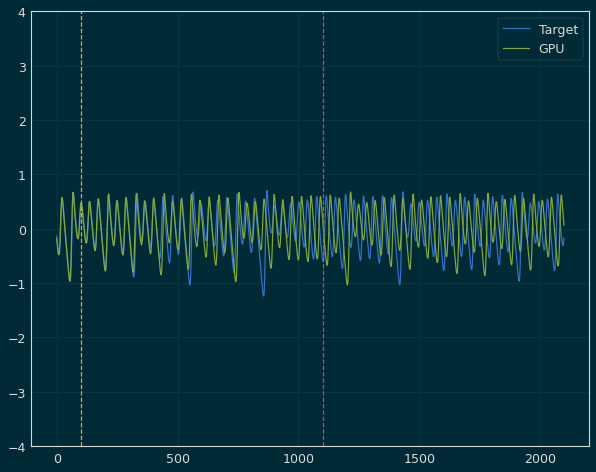

 Iter=22 a=0.683 sr=0.901 amp=1.572  ri=1.370 rr=2.439 loss=0.695177


Iter: 22 #### Diagnostic 0.695177   Time 10.13  Best 0.695 NRMSE 0.183 CD 0.512
Iter: 23 #### Diagnostic 1000.000000   Time 9.08  Best 0.695 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 8.02  Best 0.695 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 9.24  Best 0.695 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 9.58  Best 0.695 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 6.12  Best 0.695 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 0.941400   Time 7.46  Best 0.695 NRMSE 0.228 CD 0.713
Iter: 29 #### Diagnostic 0.803766   Time 7.04  Best 0.695 NRMSE 0.196 CD 0.608


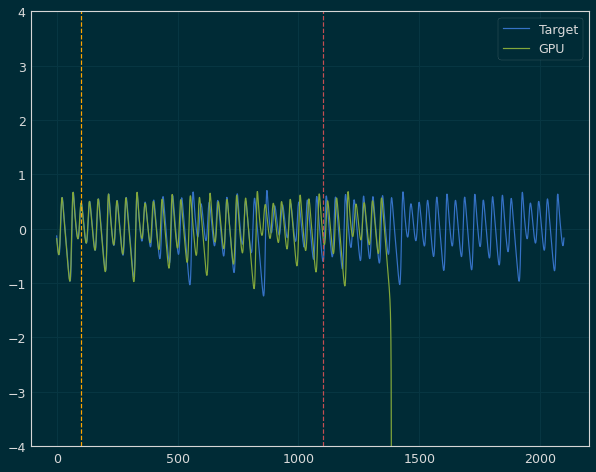

 Iter=30 a=0.647 sr=0.862 amp=1.652  ri=1.987 rr=2.815 loss=0.618022


Iter: 30 #### Diagnostic 0.618022   Time 8.29  Best 0.618 NRMSE 0.165 CD 0.453
Iter: 31 #### Diagnostic 1000.000000   Time 6.89  Best 0.618 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 6.67  Best 0.618 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 5.96  Best 0.618 NRMSE 1000.000 CD nan
Iter: 34 #### Diagnostic 0.877855   Time 7.58  Best 0.618 NRMSE 0.202 CD 0.676
Iter: 35 #### Diagnostic 1000.000000   Time 10.02  Best 0.618 NRMSE 1000.000 CD nan
Iter: 36 #### Diagnostic 1000.000000   Time 8.94  Best 0.618 NRMSE 1000.000 CD nan
Iter: 37 #### Diagnostic 1000.000000   Time 7.65  Best 0.618 NRMSE 1000.000 CD nan
Iter: 38 #### Diagnostic 1000.000000   Time 6.32  Best 0.618 NRMSE 1000.000 CD nan
Iter: 39 #### Diagnostic 1000.000000   Time 6.19  Best 0.618 NRMSE 1000.000 CD nan
Iter: 40 #### Diagnostic 1000.000000   Time 8.32  Best 0.618 NRMSE 1000.000 CD nan
Iter: 41 #### Diagnosti

Iter: 26 #### Diagnostic 1000.000000   Time 8.52  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 8.20  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 5.58  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 8.21  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 6.02  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 5.79  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 8.87  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 6.80  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 34 #### Diagnostic 1000.000000   Time 7.90  Best 1000.000 NRMSE 1000.000 CD nan


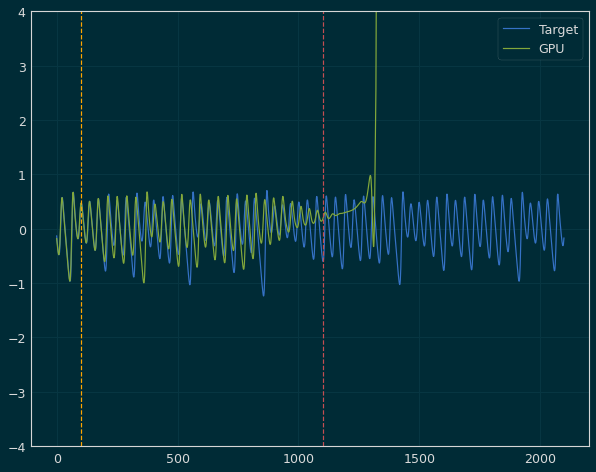

 Iter=35 a=0.598 sr=0.954 amp=1.444  ri=3.108 rr=1.431 loss=0.670166


Iter: 35 #### Diagnostic 0.670166   Time 10.82  Best 0.670 NRMSE 0.168 CD 0.503
Iter: 36 #### Diagnostic 1000.000000   Time 7.10  Best 0.670 NRMSE 1000.000 CD nan
Iter: 37 #### Diagnostic 1000.000000   Time 6.88  Best 0.670 NRMSE 1000.000 CD nan
Iter: 38 #### Diagnostic 1000.000000   Time 6.80  Best 0.670 NRMSE 1000.000 CD nan
Iter: 39 #### Diagnostic 1000.000000   Time 7.28  Best 0.670 NRMSE 1000.000 CD nan
Iter: 40 #### Diagnostic 1000.000000   Time 9.82  Best 0.670 NRMSE 1000.000 CD nan
Iter: 41 #### Diagnostic 1000.000000   Time 9.14  Best 0.670 NRMSE 1000.000 CD nan
Iter: 42 #### Diagnostic 1000.000000   Time 6.64  Best 0.670 NRMSE 1000.000 CD nan
Iter: 43 #### Diagnostic 1000.000000   Time 6.30  Best 0.670 NRMSE 1000.000 CD nan
Iter: 44 #### Diagnostic 1000.000000   Time 7.10  Best 0.670 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 1000.000000   Time 9.57  Best 0.670 NRMSE 1000.000 CD nan
Iter: 46 #### Diagn

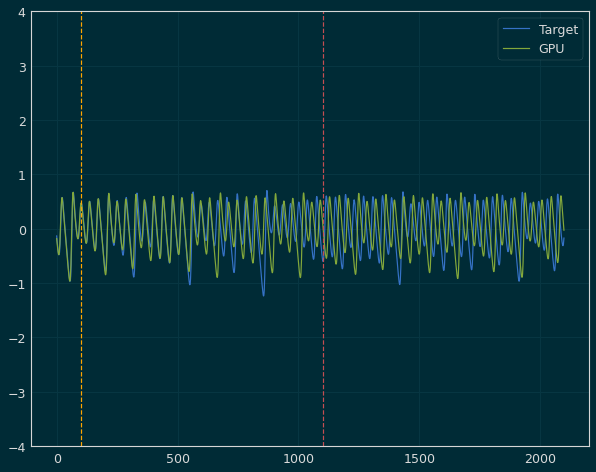

 Iter=5 a=0.661 sr=0.913 amp=1.613  ri=0.278 rr=1.353 loss=0.676873


Iter: 5 #### Diagnostic 0.676873   Time 8.39  Best 0.677 NRMSE 0.180 CD 0.497
Iter: 6 #### Diagnostic 1000.000000   Time 9.64  Best 0.677 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1.190088   Time 9.19  Best 0.677 NRMSE 0.228 CD 0.962
Iter: 8 #### Diagnostic 1000.000000   Time 9.51  Best 0.677 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 7.08  Best 0.677 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 6.22  Best 0.677 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 8.06  Best 0.677 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 8.28  Best 0.677 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 8.98  Best 0.677 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 9.31  Best 0.677 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 0.711160   Time 8.35  Best 0.677 NRMSE 0.187 CD 0.524
Iter: 16 #### Diagnostic 1000.0000

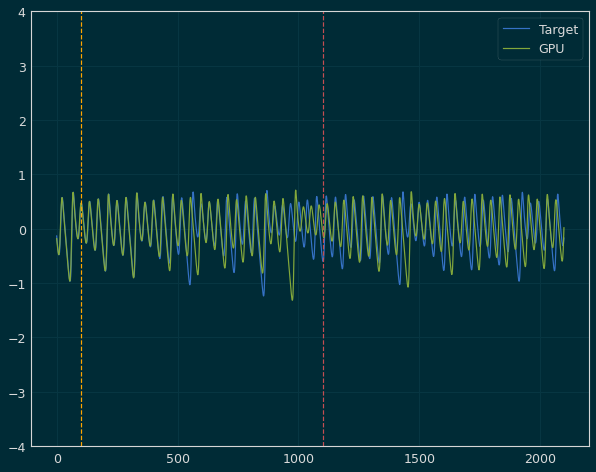

 Iter=39 a=0.630 sr=0.880 amp=1.462  ri=1.379 rr=2.776 loss=0.569507


Iter: 39 #### Diagnostic 0.569507   Time 9.51  Best 0.570 NRMSE 0.157 CD 0.412
Iter: 40 #### Diagnostic 1000.000000   Time 7.73  Best 0.570 NRMSE 1000.000 CD nan
Iter: 41 #### Diagnostic 1000.000000   Time 9.72  Best 0.570 NRMSE 1000.000 CD nan
Iter: 42 #### Diagnostic 1000.000000   Time 7.10  Best 0.570 NRMSE 1000.000 CD nan
Iter: 43 #### Diagnostic 1000.000000   Time 9.77  Best 0.570 NRMSE 1000.000 CD nan
Iter: 44 #### Diagnostic 1000.000000   Time 10.58  Best 0.570 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 0.691280   Time 9.12  Best 0.570 NRMSE 0.176 CD 0.515
Iter: 46 #### Diagnostic 1000.000000   Time 7.44  Best 0.570 NRMSE 1000.000 CD nan
Iter: 47 #### Diagnostic 1000.000000   Time 8.03  Best 0.570 NRMSE 1000.000 CD nan
Iter: 48 #### Diagnostic 1000.000000   Time 6.56  Best 0.570 NRMSE 1000.000 CD nan
Iter: 49 #### Diagnostic 1000.000000   Time 8.42  Best 0.570 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnosti

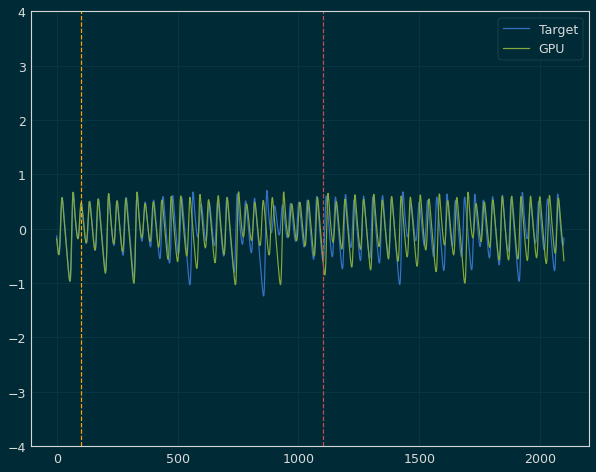

 Iter=12 a=0.600 sr=0.900 amp=1.616  ri=1.488 rr=0.635 loss=0.605694


Iter: 12 #### Diagnostic 0.605694   Time 8.64  Best 0.606 NRMSE 0.162 CD 0.443
Iter: 13 #### Diagnostic 0.821768   Time 9.14  Best 0.606 NRMSE 0.201 CD 0.620
Iter: 14 #### Diagnostic 1000.000000   Time 10.13  Best 0.606 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 9.30  Best 0.606 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 6.28  Best 0.606 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 6.31  Best 0.606 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 6.88  Best 0.606 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 0.935851   Time 6.26  Best 0.606 NRMSE 0.198 CD 0.738
Iter: 20 #### Diagnostic 1000.000000   Time 4.89  Best 0.606 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 6.89  Best 0.606 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 8.66  Best 0.606 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 10

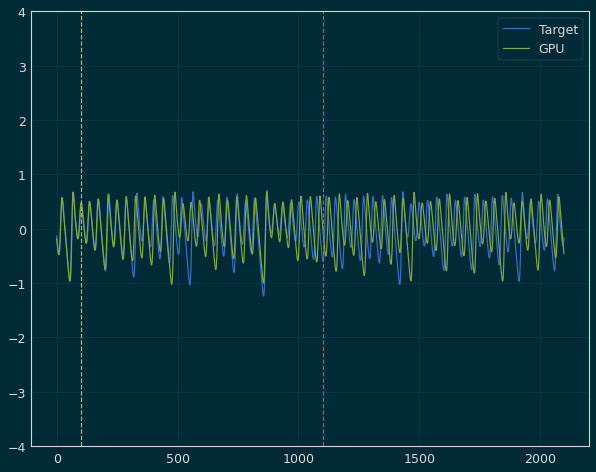

 Iter=25 a=0.634 sr=0.962 amp=1.622  ri=1.286 rr=3.648 loss=0.592506


Iter: 25 #### Diagnostic 0.592506   Time 9.77  Best 0.593 NRMSE 0.168 CD 0.424
Iter: 26 #### Diagnostic 1000.000000   Time 7.95  Best 0.593 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 7.69  Best 0.593 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 7.67  Best 0.593 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 6.46  Best 0.593 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 7.38  Best 0.593 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 8.10  Best 0.593 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 7.25  Best 0.593 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 8.02  Best 0.593 NRMSE 1000.000 CD nan
Iter: 34 #### Diagnostic 1000.000000   Time 5.67  Best 0.593 NRMSE 1000.000 CD nan
Iter: 35 #### Diagnostic 1000.000000   Time 6.70  Best 0.593 NRMSE 1000.000 CD nan
Iter: 36 #### Diagno

Iter: 21 #### Diagnostic 1000.000000   Time 6.71  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 7.87  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 8.33  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 8.79  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 9.12  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 8.26  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 9.19  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 8.70  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 9.10  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 10.91  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 8.15  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 6.77  Bes

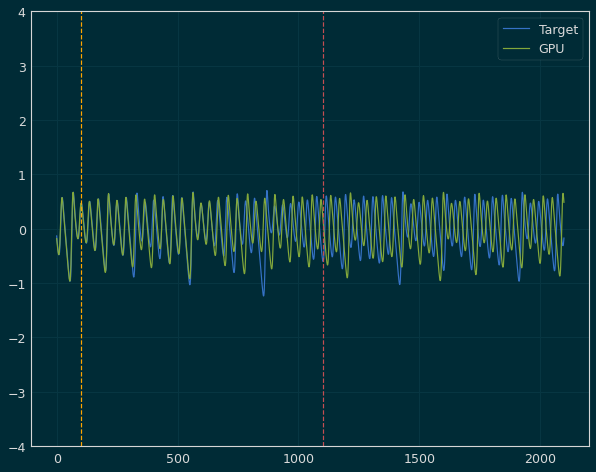

 Iter=78 a=0.674 sr=0.975 amp=1.630  ri=2.598 rr=0.279 loss=0.654315


Iter: 78 #### Diagnostic 0.654315   Time 10.00  Best 0.654 NRMSE 0.178 CD 0.477
Iter: 79 #### Diagnostic 1000.000000   Time 5.52  Best 0.654 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 0.766977   Time 8.56  Best 0.654 NRMSE 0.190 CD 0.577
Iter: 81 #### Diagnostic 1.264317   Time 7.88  Best 0.654 NRMSE 0.289 CD 0.976
Iter: 82 #### Diagnostic 1000.000000   Time 8.17  Best 0.654 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 0.801016   Time 8.10  Best 0.654 NRMSE 0.195 CD 0.606
Iter: 84 #### Diagnostic 1000.000000   Time 6.90  Best 0.654 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 1000.000000   Time 6.10  Best 0.654 NRMSE 1000.000 CD nan
Iter: 86 #### Diagnostic 1000.000000   Time 5.88  Best 0.654 NRMSE 1000.000 CD nan
Iter: 87 #### Diagnostic 1000.000000   Time 7.93  Best 0.654 NRMSE 1000.000 CD nan
Iter: 88 #### Diagnostic 1000.000000   Time 8.77  Best 0.654 NRMSE 1000.000 CD nan
Iter: 89 #### Diagnostic 0.7932

Iter: 72 #### Diagnostic 1000.000000   Time 6.65  Best 1000.000 NRMSE 1000.000 CD nan


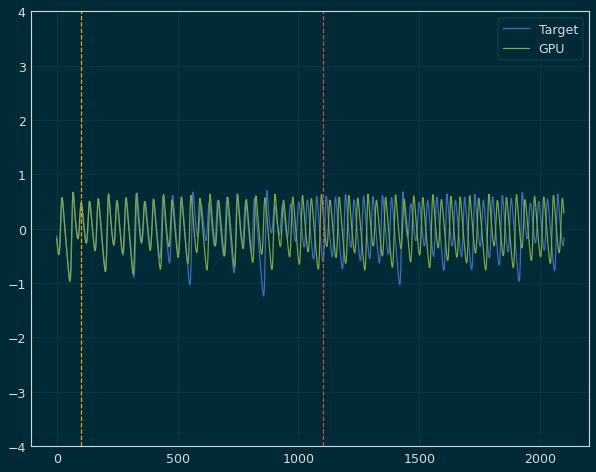

 Iter=73 a=0.622 sr=0.845 amp=1.630  ri=0.244 rr=0.677 loss=0.664750


Iter: 73 #### Diagnostic 0.664750   Time 7.89  Best 0.665 NRMSE 0.179 CD 0.486
Iter: 74 #### Diagnostic 1000.000000   Time 8.78  Best 0.665 NRMSE 1000.000 CD nan
Iter: 75 #### Diagnostic 1000.000000   Time 5.78  Best 0.665 NRMSE 1000.000 CD nan
Iter: 76 #### Diagnostic 1000.000000   Time 8.36  Best 0.665 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 7.13  Best 0.665 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 7.68  Best 0.665 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 8.14  Best 0.665 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 6.67  Best 0.665 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1000.000000   Time 6.06  Best 0.665 NRMSE 1000.000 CD nan
Iter: 82 #### Diagnostic 1000.000000   Time 9.99  Best 0.665 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 1000.000000   Time 4.85  Best 0.665 NRMSE 1000.000 CD nan
Iter: 84 #### Diagno

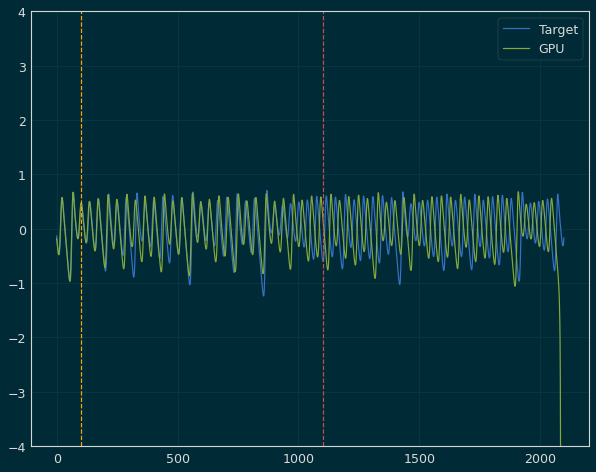

 Iter=91 a=0.569 sr=0.926 amp=1.604  ri=2.586 rr=0.389 loss=0.598738


Iter: 91 #### Diagnostic 0.598738   Time 7.18  Best 0.599 NRMSE 0.173 CD 0.426
Iter: 92 #### Diagnostic 1000.000000   Time 6.79  Best 0.599 NRMSE 1000.000 CD nan
Iter: 93 #### Diagnostic 1000.000000   Time 8.30  Best 0.599 NRMSE 1000.000 CD 0.995
Iter: 94 #### Diagnostic 1000.000000   Time 9.29  Best 0.599 NRMSE 1000.000 CD nan
Iter: 95 #### Diagnostic 1000.000000   Time 4.74  Best 0.599 NRMSE 1000.000 CD nan
Iter: 96 #### Diagnostic 1000.000000   Time 6.15  Best 0.599 NRMSE 1000.000 CD nan
Iter: 97 #### Diagnostic 1000.000000   Time 9.67  Best 0.599 NRMSE 1000.000 CD nan
Iter: 98 #### Diagnostic 1000.000000   Time 8.22  Best 0.599 NRMSE 1000.000 CD nan
Iter: 99 #### Diagnostic 1000.000000   Time 5.70  Best 0.599 NRMSE 1000.000 CD nan

Best result = 0.5987380503148995
a = 0.5688260977008779
sr = 0.9262979922041971
amp = 1.6044875548594613
ri = 2.5864060270112232
rr = 0.3891321987734734
********** Size 300 -- Run 3 *

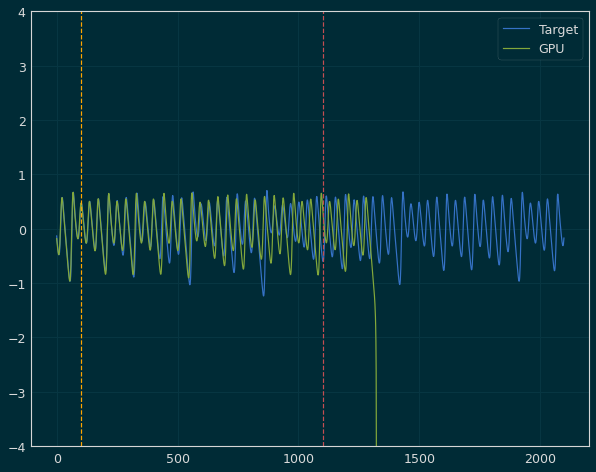

 Iter=48 a=0.640 sr=0.833 amp=1.525  ri=0.779 rr=2.548 loss=0.637365


Iter: 48 #### Diagnostic 0.637365   Time 6.57  Best 0.637 NRMSE 0.174 CD 0.463
Iter: 49 #### Diagnostic 1000.000000   Time 6.30  Best 0.637 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1000.000000   Time 6.99  Best 0.637 NRMSE 1000.000 CD nan
Iter: 51 #### Diagnostic 1000.000000   Time 5.64  Best 0.637 NRMSE 1000.000 CD nan
Iter: 52 #### Diagnostic 1000.000000   Time 8.07  Best 0.637 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 0.724941   Time 5.73  Best 0.637 NRMSE 0.186 CD 0.539
Iter: 54 #### Diagnostic 1000.000000   Time 5.16  Best 0.637 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 7.21  Best 0.637 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 7.01  Best 0.637 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 6.78  Best 0.637 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 6.16  Best 0.637 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic

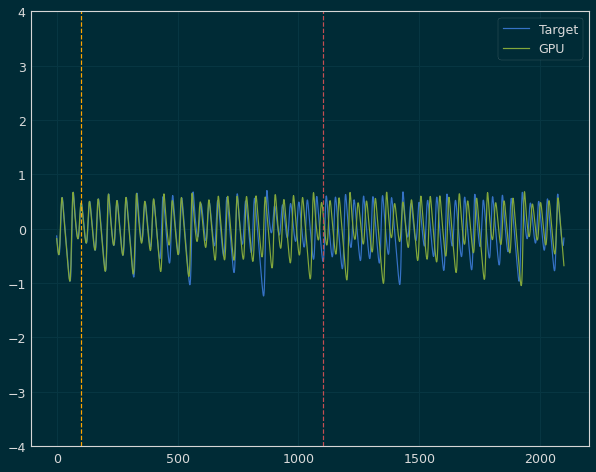

 Iter=72 a=0.673 sr=0.935 amp=1.502  ri=2.726 rr=1.887 loss=0.583568


Iter: 72 #### Diagnostic 0.583568   Time 7.34  Best 0.584 NRMSE 0.167 CD 0.416
Iter: 73 #### Diagnostic 1000.000000   Time 7.81  Best 0.584 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 1000.000000   Time 8.45  Best 0.584 NRMSE 1000.000 CD nan
Iter: 75 #### Diagnostic 0.743197   Time 6.30  Best 0.584 NRMSE 0.189 CD 0.554
Iter: 76 #### Diagnostic 1000.000000   Time 8.31  Best 0.584 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 0.646766   Time 8.25  Best 0.584 NRMSE 0.170 CD 0.476
Iter: 78 #### Diagnostic 1000.000000   Time 8.84  Best 0.584 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 6.21  Best 0.584 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 6.78  Best 0.584 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1000.000000   Time 7.06  Best 0.584 NRMSE 1000.000 CD nan
Iter: 82 #### Diagnostic 1000.000000   Time 7.68  Best 0.584 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 100

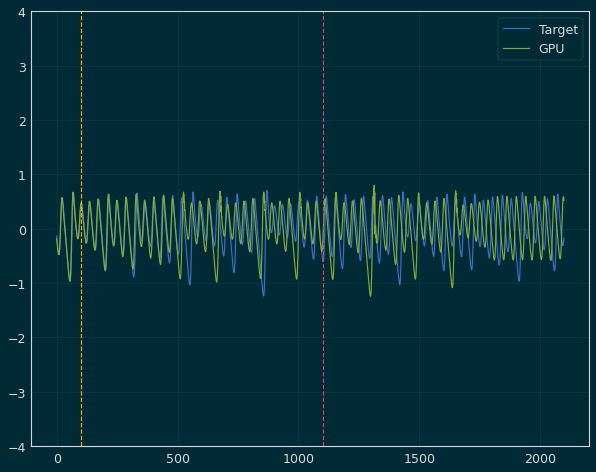

 Iter=5 a=0.661 sr=0.913 amp=1.613  ri=0.278 rr=1.353 loss=0.674826


Iter: 5 #### Diagnostic 0.674826   Time 7.25  Best 0.675 NRMSE 0.175 CD 0.500
Iter: 6 #### Diagnostic 1000.000000   Time 7.25  Best 0.675 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 6.42  Best 0.675 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 6.93  Best 0.675 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 9.70  Best 0.675 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 0.870711   Time 6.75  Best 0.675 NRMSE 0.207 CD 0.663
Iter: 11 #### Diagnostic 1000.000000   Time 7.70  Best 0.675 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 6.97  Best 0.675 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 8.38  Best 0.675 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 6.25  Best 0.675 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 0.715816   Time 6.03  Best 0.675 NRMSE 0.191 CD 0.525
Iter: 16 #### Diagnostic 1.526667 

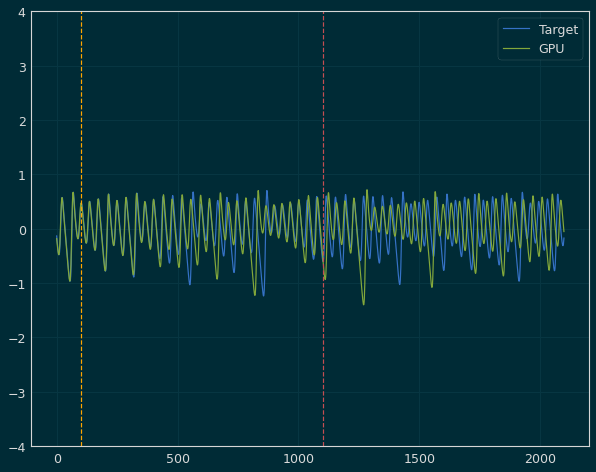

 Iter=53 a=0.638 sr=0.935 amp=1.563  ri=1.858 rr=3.789 loss=0.609155


Iter: 53 #### Diagnostic 0.609155   Time 7.30  Best 0.609 NRMSE 0.156 CD 0.453
Iter: 54 #### Diagnostic 1000.000000   Time 8.05  Best 0.609 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 8.21  Best 0.609 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 6.59  Best 0.609 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 7.49  Best 0.609 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 8.14  Best 0.609 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 6.35  Best 0.609 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1000.000000   Time 8.62  Best 0.609 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 7.19  Best 0.609 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 1000.000000   Time 7.05  Best 0.609 NRMSE 1000.000 CD nan
Iter: 63 #### Diagnostic 1000.000000   Time 8.12  Best 0.609 NRMSE 1000.000 CD nan
Iter: 64 #### Diagno

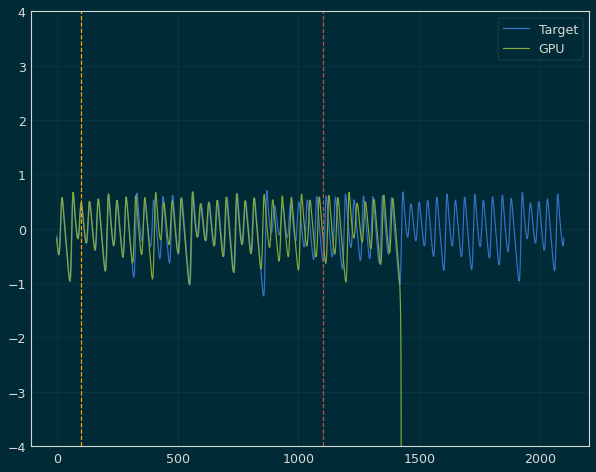

 Iter=25 a=0.634 sr=0.962 amp=1.622  ri=1.286 rr=3.648 loss=0.554980


Iter: 25 #### Diagnostic 0.554980   Time 6.34  Best 0.555 NRMSE 0.161 CD 0.394
Iter: 26 #### Diagnostic 1000.000000   Time 6.86  Best 0.555 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 5.74  Best 0.555 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 7.72  Best 0.555 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 8.34  Best 0.555 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 0.669258   Time 8.45  Best 0.555 NRMSE 0.176 CD 0.493
Iter: 31 #### Diagnostic 1000.000000   Time 6.69  Best 0.555 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 7.28  Best 0.555 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 6.00  Best 0.555 NRMSE 1000.000 CD nan
Iter: 34 #### Diagnostic 1000.000000   Time 8.32  Best 0.555 NRMSE 1000.000 CD nan
Iter: 35 #### Diagnostic 1000.000000   Time 6.20  Best 0.555 NRMSE 1000.000 CD nan
Iter: 36 #### Diagnostic

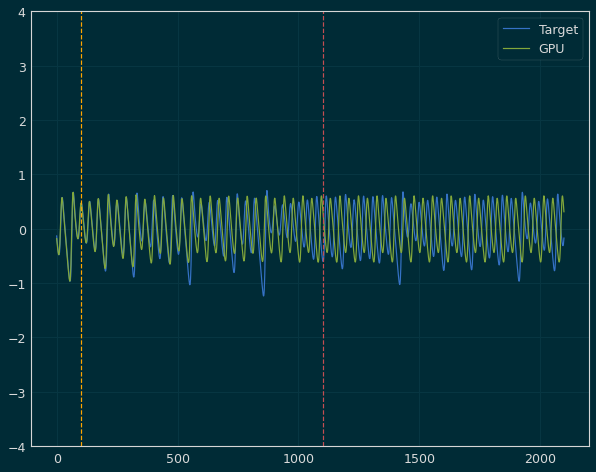

 Iter=0 a=0.571 sr=0.905 amp=1.627  ri=1.239 rr=3.433 loss=0.668656


Iter: 0 #### Diagnostic 0.668656   Time 8.87  Best 0.669 NRMSE 0.182 CD 0.487
Iter: 1 #### Diagnostic 1000.000000   Time 7.67  Best 0.669 NRMSE 1000.000 CD nan
Iter: 2 #### Diagnostic 1000.000000   Time 8.22  Best 0.669 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1000.000000   Time 9.02  Best 0.669 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 8.06  Best 0.669 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 6.83  Best 0.669 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 0.887909   Time 6.66  Best 0.669 NRMSE 0.203 CD 0.685
Iter: 7 #### Diagnostic 1000.000000   Time 6.09  Best 0.669 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 6.58  Best 0.669 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 7.98  Best 0.669 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 7.69  Best 0.669 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.00000

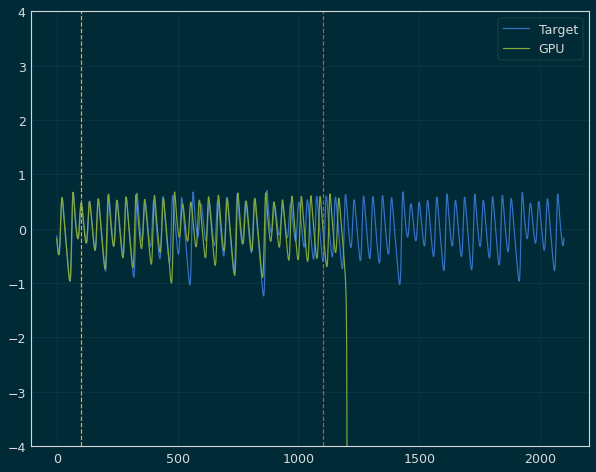

 Iter=58 a=0.645 sr=0.955 amp=1.437  ri=1.771 rr=2.981 loss=0.588122


Iter: 58 #### Diagnostic 0.588122   Time 9.03  Best 0.588 NRMSE 0.168 CD 0.420
Iter: 59 #### Diagnostic 1000.000000   Time 7.70  Best 0.588 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1000.000000   Time 7.54  Best 0.588 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 5.88  Best 0.588 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 1000.000000   Time 9.29  Best 0.588 NRMSE 1000.000 CD nan
Iter: 63 #### Diagnostic 1000.000000   Time 7.79  Best 0.588 NRMSE 1000.000 CD nan
Iter: 64 #### Diagnostic 0.714211   Time 6.31  Best 0.588 NRMSE 0.184 CD 0.530
Iter: 65 #### Diagnostic 1000.000000   Time 9.05  Best 0.588 NRMSE 1000.000 CD nan
Iter: 66 #### Diagnostic 1000.000000   Time 7.08  Best 0.588 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 0.779393   Time 7.76  Best 0.588 NRMSE 0.199 CD 0.580
Iter: 68 #### Diagnostic 1000.000000   Time 9.99  Best 0.588 NRMSE 1000.000 CD nan
Iter: 69 #### Diagnostic 100

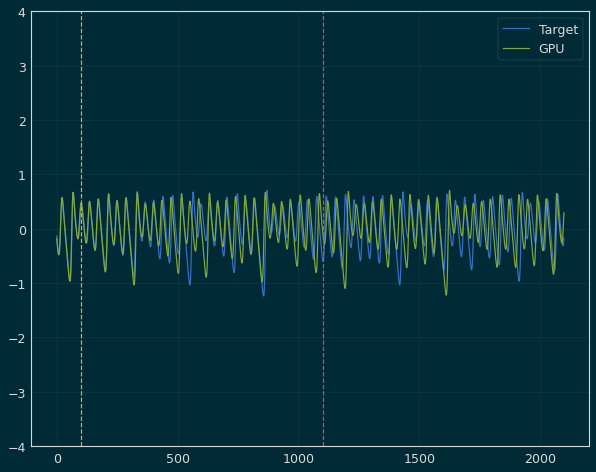

 Iter=79 a=0.563 sr=0.978 amp=1.654  ri=1.088 rr=3.427 loss=0.561775


Iter: 79 #### Diagnostic 0.561775   Time 8.91  Best 0.562 NRMSE 0.162 CD 0.400
Iter: 80 #### Diagnostic 1000.000000   Time 6.56  Best 0.562 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1000.000000   Time 5.88  Best 0.562 NRMSE 1000.000 CD nan
Iter: 82 #### Diagnostic 1000.000000   Time 7.72  Best 0.562 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 1000.000000   Time 8.77  Best 0.562 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.000000   Time 6.14  Best 0.562 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 0.687706   Time 6.26  Best 0.562 NRMSE 0.180 CD 0.507
Iter: 86 #### Diagnostic 0.769487   Time 5.81  Best 0.562 NRMSE 0.191 CD 0.579
Iter: 87 #### Diagnostic 1000.000000   Time 8.41  Best 0.562 NRMSE 1000.000 CD nan
Iter: 88 #### Diagnostic 1000.000000   Time 6.69  Best 0.562 NRMSE 1000.000 CD nan
Iter: 89 #### Diagnostic 1000.000000   Time 7.82  Best 0.562 NRMSE 1000.000 CD nan
Iter: 90 #### Diagnostic 100

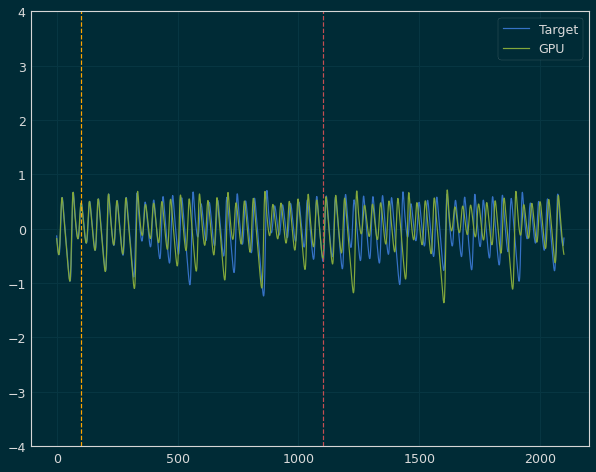

 Iter=63 a=0.644 sr=0.882 amp=1.449  ri=1.456 rr=1.029 loss=0.579989


Iter: 63 #### Diagnostic 0.579989   Time 6.30  Best 0.580 NRMSE 0.165 CD 0.415
Iter: 64 #### Diagnostic 1000.000000   Time 7.21  Best 0.580 NRMSE 1000.000 CD nan
Iter: 65 #### Diagnostic 1000.000000   Time 8.43  Best 0.580 NRMSE 1000.000 CD nan
Iter: 66 #### Diagnostic 1000.000000   Time 9.51  Best 0.580 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 1000.000000   Time 9.68  Best 0.580 NRMSE 1000.000 CD nan
Iter: 68 #### Diagnostic 1000.000000   Time 9.13  Best 0.580 NRMSE 1000.000 CD nan
Iter: 69 #### Diagnostic 1000.000000   Time 5.64  Best 0.580 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic 1000.000000   Time 8.33  Best 0.580 NRMSE 1000.000 CD nan
Iter: 71 #### Diagnostic 1000.000000   Time 5.68  Best 0.580 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1000.000000   Time 5.30  Best 0.580 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 1000.000000   Time 5.13  Best 0.580 NRMSE 1000.000 CD nan
Iter: 74 #### Diagno

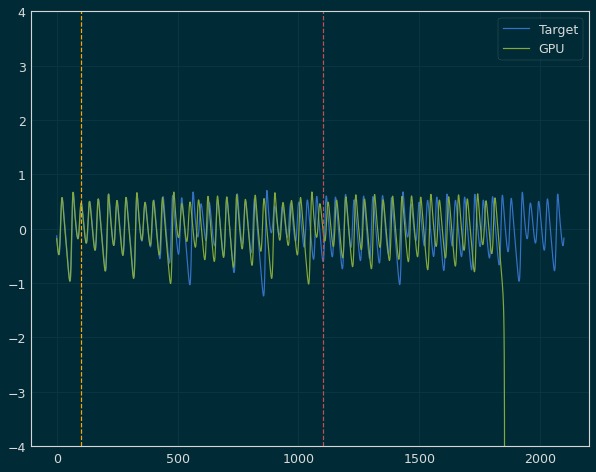

 Iter=4 a=0.602 sr=0.912 amp=1.554  ri=1.386 rr=1.380 loss=0.668823


Iter: 4 #### Diagnostic 0.668823   Time 7.54  Best 0.669 NRMSE 0.173 CD 0.495
Iter: 5 #### Diagnostic 1000.000000   Time 7.03  Best 0.669 NRMSE 1000.000 CD nan


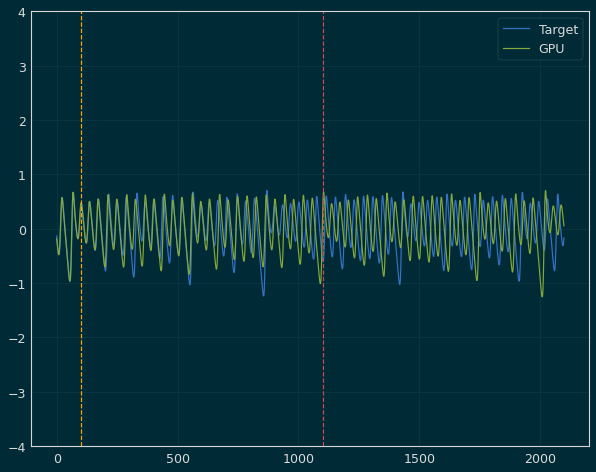

 Iter=6 a=0.578 sr=0.872 amp=1.681  ri=0.283 rr=2.138 loss=0.664785


Iter: 6 #### Diagnostic 0.664785   Time 7.36  Best 0.665 NRMSE 0.181 CD 0.483
Iter: 7 #### Diagnostic 1000.000000   Time 5.23  Best 0.665 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 6.55  Best 0.665 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 8.80  Best 0.665 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 8.45  Best 0.665 NRMSE 1000.000 CD nan


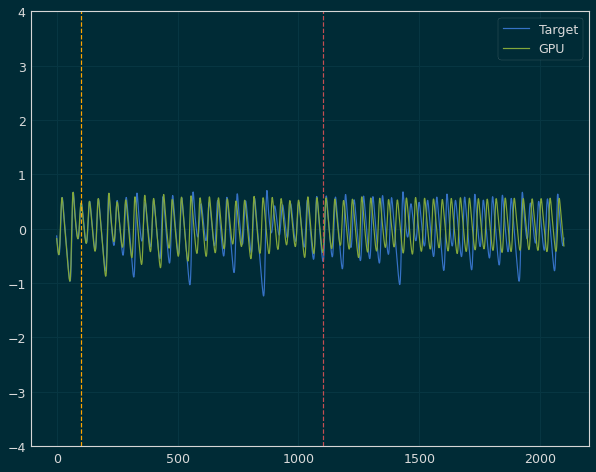

 Iter=11 a=0.615 sr=0.955 amp=1.589  ri=1.893 rr=2.183 loss=0.539773


Iter: 11 #### Diagnostic 0.539773   Time 8.62  Best 0.540 NRMSE 0.148 CD 0.391
Iter: 12 #### Diagnostic 1000.000000   Time 7.58  Best 0.540 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 0.639803   Time 9.19  Best 0.540 NRMSE 0.177 CD 0.463
Iter: 14 #### Diagnostic 1000.000000   Time 8.92  Best 0.540 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 0.830017   Time 8.44  Best 0.540 NRMSE 0.204 CD 0.626
Iter: 16 #### Diagnostic 1.531200   Time 9.58  Best 0.540 NRMSE 0.528 CD 1.003
Iter: 17 #### Diagnostic 1000.000000   Time 7.01  Best 0.540 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 8.68  Best 0.540 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 7.12  Best 0.540 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 6.13  Best 0.540 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 6.69  Best 0.540 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1.11713

Iter: 8 #### Diagnostic 1000.000000   Time 5.56  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 0.821607   Time 5.97  Best 1000.000 NRMSE 0.203 CD 0.619
Iter: 10 #### Diagnostic 1000.000000   Time 7.23  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 7.63  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 7.56  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 9.22  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1.223849   Time 8.95  Best 1000.000 NRMSE 0.224 CD 1.000
Iter: 15 #### Diagnostic 1000.000000   Time 7.53  Best 1000.000 NRMSE 1430.290 CD 0.994
Iter: 16 #### Diagnostic 1000.000000   Time 6.18  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 6.46  Best 1000.000 NRMSE 1000.000 CD nan


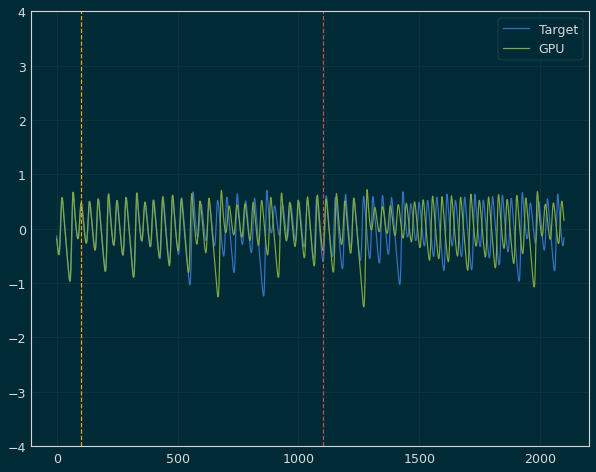

 Iter=18 a=0.608 sr=0.874 amp=1.640  ri=1.627 rr=2.579 loss=0.621320


Iter: 18 #### Diagnostic 0.621320   Time 9.17  Best 0.621 NRMSE 0.162 CD 0.460
Iter: 19 #### Diagnostic 1000.000000   Time 7.87  Best 0.621 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 7.44  Best 0.621 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 7.10  Best 0.621 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 9.79  Best 0.621 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 8.30  Best 0.621 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 6.10  Best 0.621 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 5.51  Best 0.621 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1.182859   Time 7.46  Best 0.621 NRMSE 0.223 CD 0.959
Iter: 27 #### Diagnostic 1000.000000   Time 7.27  Best 0.621 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 8.37  Best 0.621 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic

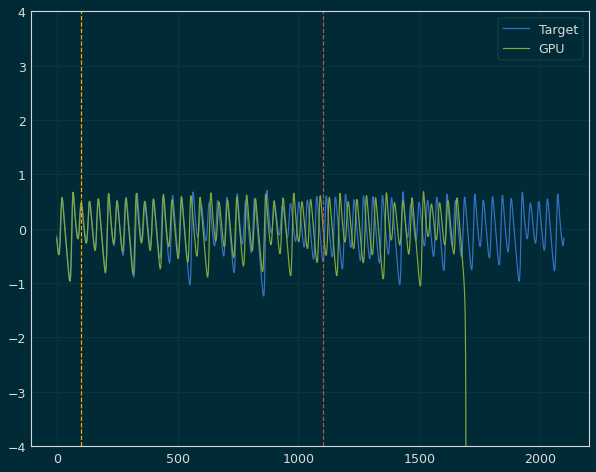

 Iter=7 a=0.620 sr=0.936 amp=1.546  ri=1.709 rr=1.594 loss=0.611294


Iter: 7 #### Diagnostic 0.611294   Time 8.13  Best 0.611 NRMSE 0.172 CD 0.440
Iter: 8 #### Diagnostic 1000.000000   Time 7.89  Best 0.611 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 6.63  Best 0.611 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 7.23  Best 0.611 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 7.76  Best 0.611 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 4.758791   Time 8.18  Best 0.611 NRMSE 3.779 CD 0.980
Iter: 13 #### Diagnostic 1000.000000   Time 7.57  Best 0.611 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 5.95  Best 0.611 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 7.60  Best 0.611 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 6.56  Best 0.611 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 7.14  Best 0.611 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 100

Iter: 3 #### Diagnostic 1000.000000   Time 5.23  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 8.48  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 4.96  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 0.728785   Time 6.52  Best 1000.000 NRMSE 0.186 CD 0.542
Iter: 7 #### Diagnostic 1000.000000   Time 7.33  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 9.69  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 7.63  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 6.42  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 6.30  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 5.59  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 8.94  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 7.24  Best 1000.000 N

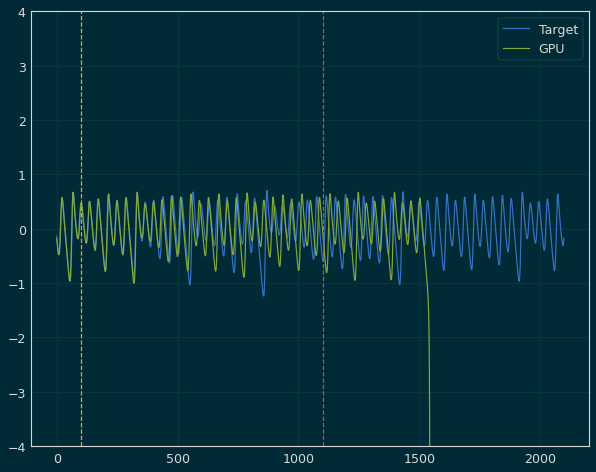

 Iter=67 a=0.631 sr=0.877 amp=1.647  ri=2.410 rr=3.012 loss=0.696463


Iter: 67 #### Diagnostic 0.696463   Time 9.47  Best 0.696 NRMSE 0.182 CD 0.515


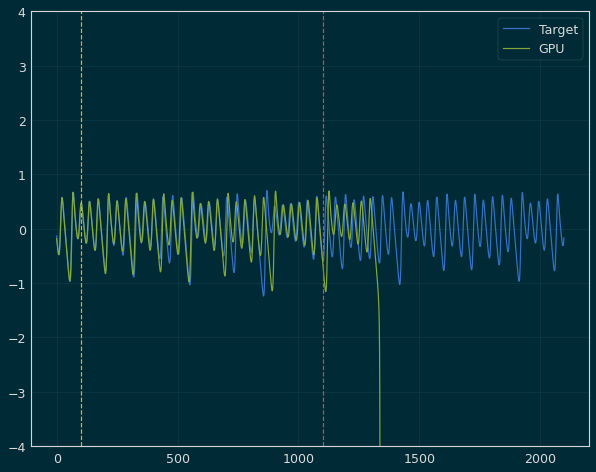

 Iter=68 a=0.570 sr=0.869 amp=1.508  ri=1.245 rr=2.310 loss=0.432903


Iter: 68 #### Diagnostic 0.432903   Time 9.56  Best 0.433 NRMSE 0.129 CD 0.304
Iter: 69 #### Diagnostic 1000.000000   Time 8.60  Best 0.433 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic 1000.000000   Time 10.07  Best 0.433 NRMSE 1000.000 CD nan
Iter: 71 #### Diagnostic 1000.000000   Time 8.77  Best 0.433 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1.239846   Time 10.48  Best 0.433 NRMSE 0.254 CD 0.986
Iter: 73 #### Diagnostic 1000.000000   Time 8.08  Best 0.433 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 1000.000000   Time 9.67  Best 0.433 NRMSE 1000.000 CD nan
Iter: 75 #### Diagnostic 0.746887   Time 7.56  Best 0.433 NRMSE 0.194 CD 0.553
Iter: 76 #### Diagnostic 1000.000000   Time 10.19  Best 0.433 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 8.21  Best 0.433 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 6.83  Best 0.433 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 

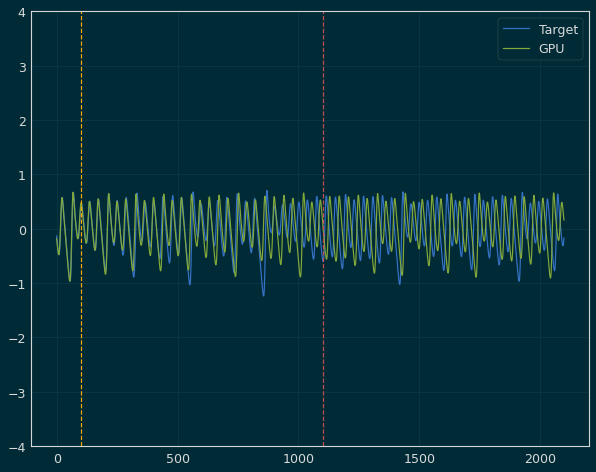

 Iter=0 a=0.561 sr=0.968 amp=1.436  ri=2.278 rr=1.749 loss=0.653799


Iter: 0 #### Diagnostic 0.653799   Time 8.98  Best 0.654 NRMSE 0.179 CD 0.474
Iter: 1 #### Diagnostic 1000.000000   Time 6.47  Best 0.654 NRMSE 1000.000 CD nan
Iter: 2 #### Diagnostic 1000.000000   Time 7.06  Best 0.654 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1000.000000   Time 5.90  Best 0.654 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 5.94  Best 0.654 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 5.84  Best 0.654 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1000.000000   Time 9.35  Best 0.654 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 9.40  Best 0.654 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 6.67  Best 0.654 NRMSE 1000.000 CD nan


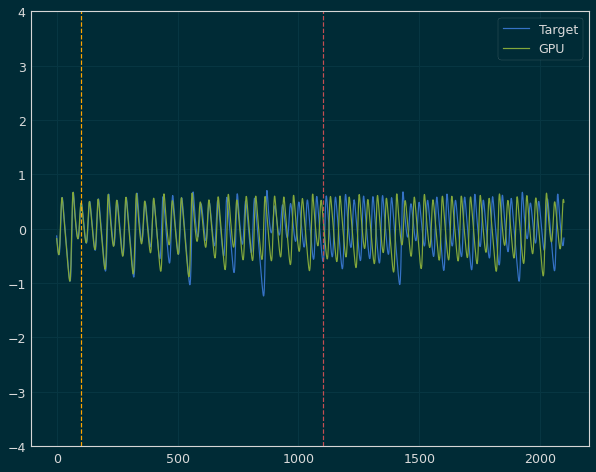

 Iter=9 a=0.649 sr=0.974 amp=1.643  ri=1.497 rr=0.302 loss=0.610462


Iter: 9 #### Diagnostic 0.610462   Time 6.88  Best 0.610 NRMSE 0.172 CD 0.438
Iter: 10 #### Diagnostic 1000.000000   Time 8.38  Best 0.610 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 6.40  Best 0.610 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 6.85  Best 0.610 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 0.769033   Time 6.73  Best 0.610 NRMSE 0.191 CD 0.578
Iter: 14 #### Diagnostic 1000.000000   Time 7.61  Best 0.610 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 7.71  Best 0.610 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 7.99  Best 0.610 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 6.39  Best 0.610 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 4.87  Best 0.610 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 6.92  Best 0.610 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1

Iter: 5 #### Diagnostic 1000.000000   Time 6.22  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1000.000000   Time 6.98  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 9.84  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 8.47  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 6.81  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 5.66  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 0.793798   Time 7.88  Best 1000.000 NRMSE 0.193 CD 0.601
Iter: 12 #### Diagnostic 1000.000000   Time 7.29  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 7.55  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1.249397   Time 6.01  Best 1000.000 NRMSE 0.250 CD 0.999
Iter: 15 #### Diagnostic 1000.000000   Time 5.77  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 7.38  Best 1000.000 NRM

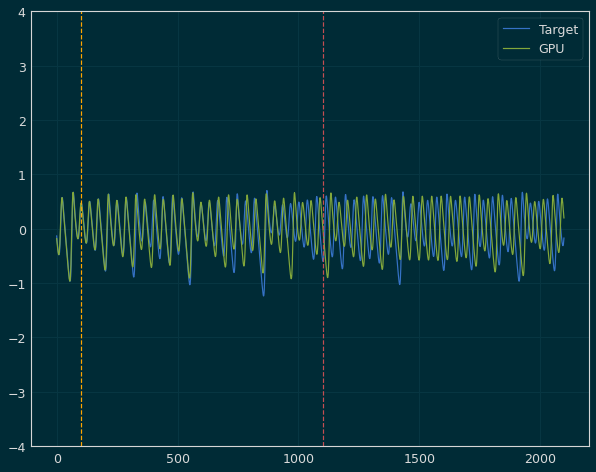

 Iter=48 a=0.640 sr=0.833 amp=1.525  ri=0.779 rr=2.548 loss=0.535857


Iter: 48 #### Diagnostic 0.535857   Time 8.40  Best 0.536 NRMSE 0.161 CD 0.375
Iter: 49 #### Diagnostic 1000.000000   Time 5.19  Best 0.536 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1000.000000   Time 6.45  Best 0.536 NRMSE 1000.000 CD nan
Iter: 51 #### Diagnostic 1000.000000   Time 5.49  Best 0.536 NRMSE 1000.000 CD nan
Iter: 52 #### Diagnostic 1000.000000   Time 6.32  Best 0.536 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 1000.000000   Time 6.62  Best 0.536 NRMSE 1000.000 CD nan
Iter: 54 #### Diagnostic 1000.000000   Time 6.74  Best 0.536 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 6.16  Best 0.536 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 5.31  Best 0.536 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 5.41  Best 0.536 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 7.27  Best 0.536 NRMSE 1000.000 CD nan
Iter: 59 #### Diagno

Iter: 43 #### Diagnostic 1000.000000   Time 7.98  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 44 #### Diagnostic 1000.000000   Time 9.37  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 0.762186   Time 6.31  Best 1000.000 NRMSE 0.196 CD 0.566
Iter: 46 #### Diagnostic 1000.000000   Time 7.23  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 47 #### Diagnostic 1000.000000   Time 6.75  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 48 #### Diagnostic 1000.000000   Time 6.14  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 49 #### Diagnostic 1000.000000   Time 7.34  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1000.000000   Time 6.43  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 51 #### Diagnostic 1.480638   Time 6.10  Best 1000.000 NRMSE 0.304 CD 1.177
Iter: 52 #### Diagnostic 1000.000000   Time 5.80  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 1000.000000   Time 5.97  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 54 #### Diagnostic 1000.000000   Time 6.11  Best 1000.00

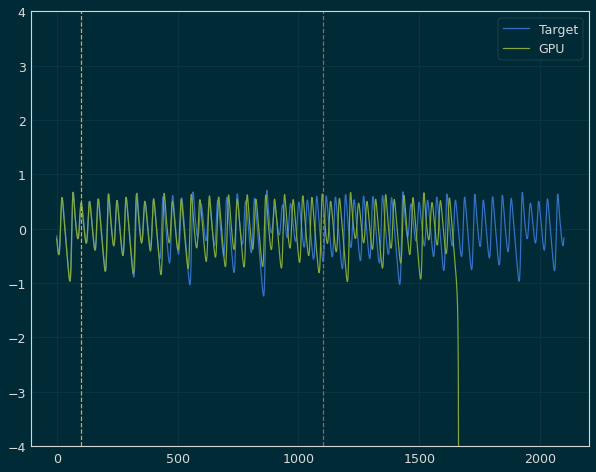

 Iter=98 a=0.634 sr=0.953 amp=1.600  ri=2.347 rr=0.719 loss=0.667371


Iter: 98 #### Diagnostic 0.667371   Time 7.11  Best 0.667 NRMSE 0.182 CD 0.486
Iter: 99 #### Diagnostic 1000.000000   Time 5.56  Best 0.667 NRMSE 1000.000 CD nan

Best result = 0.6673708202862576
a = 0.6341162308497499
sr = 0.9531088927129375
amp = 1.6001703720345428
ri = 2.3469313677159525
rr = 0.7189254051290338

Best mn:0.561	 mn:0.649
New bounds mn--mx: -0.004--0.007

Best mn:0.833	 mn:0.974
New bounds mn--mx: -0.009--0.001

Best mn:1.436	 mn:1.647
New bounds mn--mx: -0.007--0.011

Best mn:0.779	 mn:2.410
New bounds mn--mx: 0.261--0.021

Best mn:0.302	 mn:3.012
New bounds mn--mx: -0.218--0.336
Refined search bounds:

Alpha (0.5641510120873101, 0.6559043423875396)

Rho (0.8424762572750473, 0.9752232223623847)

Gamma (1.4437223405798654, 1.6581940288199566)

r-in (0.518054244216579, 2.4313388290997606)

r-res (0.5201935157255533, 3.348191298744652)

End Refinement Run 4 Time 3649.841
********** Size 200 -- Run 0 *

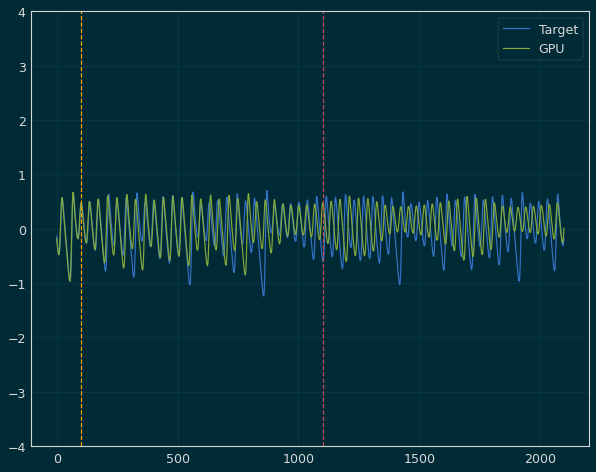

 Iter=57 a=0.676 sr=0.854 amp=1.589  ri=2.318 rr=2.193 loss=0.617793


Iter: 57 #### Diagnostic 0.617793   Time 5.72  Best 0.618 NRMSE 0.163 CD 0.454
Iter: 58 #### Diagnostic 1000.000000   Time 6.40  Best 0.618 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 7.27  Best 0.618 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1000.000000   Time 5.26  Best 0.618 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 5.11  Best 0.618 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 1000.000000   Time 5.05  Best 0.618 NRMSE 1000.000 CD nan
Iter: 63 #### Diagnostic 1000.000000   Time 4.95  Best 0.618 NRMSE 1000.000 CD nan
Iter: 64 #### Diagnostic 1000.000000   Time 4.83  Best 0.618 NRMSE 1000.000 CD nan
Iter: 65 #### Diagnostic 1000.000000   Time 4.79  Best 0.618 NRMSE 1000.000 CD nan
Iter: 66 #### Diagnostic 1000.000000   Time 4.81  Best 0.618 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 1000.000000   Time 5.09  Best 0.618 NRMSE 1000.000 CD nan
Iter: 68 #### Diagno

Iter: 52 #### Diagnostic 0.808066   Time 6.36  Best 1000.000 NRMSE 0.203 CD 0.605
Iter: 53 #### Diagnostic 1000.000000   Time 4.39  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 54 #### Diagnostic 1000.000000   Time 4.95  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 4.56  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 5.38  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 5.92  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 7.82  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 5.26  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1000.000000   Time 4.55  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 5.62  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 0.769345   Time 5.63  Best 1000.000 NRMSE 0.187 CD 0.583
Iter: 63 #### Diagnostic 1000.000000   Time 4.60  Best 1000.00

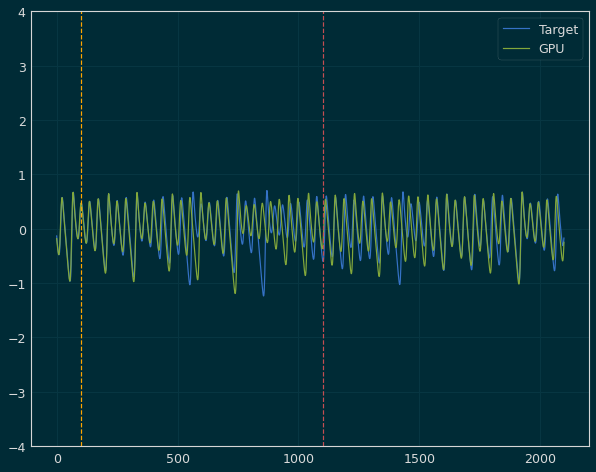

 Iter=3 a=0.687 sr=0.953 amp=1.692  ri=1.610 rr=2.212 loss=0.600189


Iter: 3 #### Diagnostic 0.600189   Time 6.59  Best 0.600 NRMSE 0.161 CD 0.439
Iter: 4 #### Diagnostic 1000.000000   Time 5.04  Best 0.600 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 0.776685   Time 5.69  Best 0.600 NRMSE 0.198 CD 0.579
Iter: 6 #### Diagnostic 1000.000000   Time 7.96  Best 0.600 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 6.27  Best 0.600 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 5.82  Best 0.600 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 6.58  Best 0.600 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 5.74  Best 0.600 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 0.899643   Time 5.33  Best 0.600 NRMSE 0.220 CD 0.680
Iter: 12 #### Diagnostic 1000.000000   Time 4.93  Best 0.600 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 4.98  Best 0.600 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000

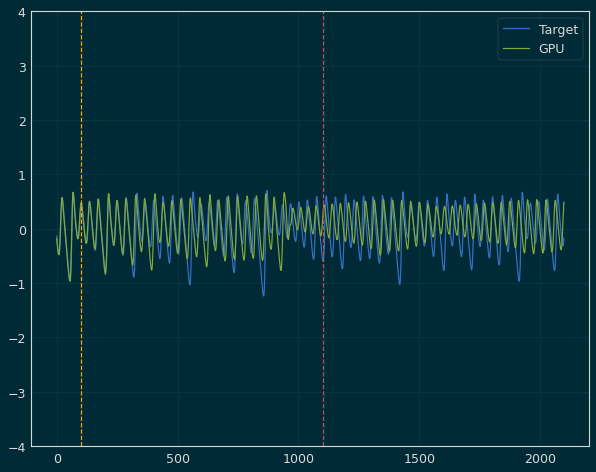

 Iter=54 a=0.673 sr=0.805 amp=1.456  ri=2.698 rr=3.634 loss=0.567495


Iter: 54 #### Diagnostic 0.567495   Time 5.62  Best 0.567 NRMSE 0.159 CD 0.409
Iter: 55 #### Diagnostic 0.693426   Time 5.09  Best 0.567 NRMSE 0.185 CD 0.509
Iter: 56 #### Diagnostic 1000.000000   Time 4.65  Best 0.567 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 5.37  Best 0.567 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 5.71  Best 0.567 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 5.92  Best 0.567 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1.054570   Time 6.34  Best 0.567 NRMSE 0.232 CD 0.822
Iter: 61 #### Diagnostic 1000.000000   Time 7.47  Best 0.567 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 1000.000000   Time 5.59  Best 0.567 NRMSE 1000.000 CD nan
Iter: 63 #### Diagnostic 1000.000000   Time 5.78  Best 0.567 NRMSE 1000.000 CD nan
Iter: 64 #### Diagnostic 1000.000000   Time 4.19  Best 0.567 NRMSE 1000.000 CD nan
Iter: 65 #### Diagnostic 100

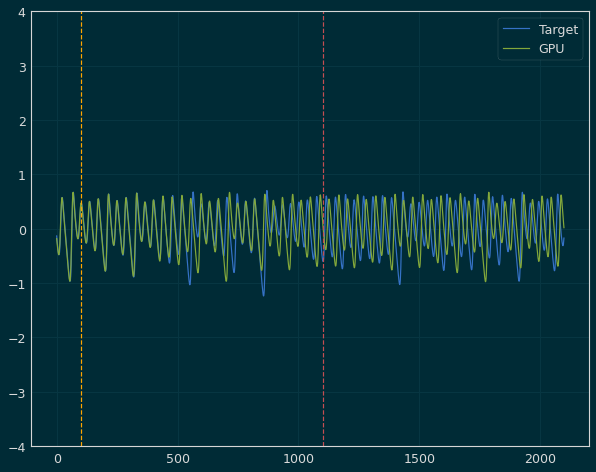

 Iter=6 a=0.578 sr=0.872 amp=1.681  ri=0.283 rr=2.138 loss=0.649713


Iter: 6 #### Diagnostic 0.649713   Time 4.87  Best 0.650 NRMSE 0.174 CD 0.476
Iter: 7 #### Diagnostic 1000.000000   Time 4.90  Best 0.650 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 5.03  Best 0.650 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 5.29  Best 0.650 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 5.07  Best 0.650 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 0.753833   Time 6.21  Best 0.650 NRMSE 0.191 CD 0.562
Iter: 12 #### Diagnostic 1000.000000   Time 5.64  Best 0.650 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 7.11  Best 0.650 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 4.38  Best 0.650 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 0.821752   Time 4.91  Best 0.650 NRMSE 0.202 CD 0.620
Iter: 16 #### Diagnostic 1000.000000   Time 4.41  Best 0.650 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000

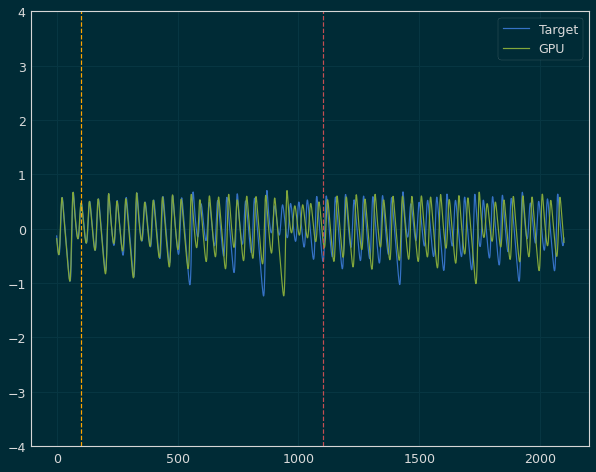

 Iter=21 a=0.599 sr=0.878 amp=1.516  ri=0.875 rr=0.494 loss=0.605281


Iter: 21 #### Diagnostic 0.605281   Time 6.74  Best 0.605 NRMSE 0.168 CD 0.437
Iter: 22 #### Diagnostic 1000.000000   Time 5.00  Best 0.605 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 5.18  Best 0.605 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 5.00  Best 0.605 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 4.53  Best 0.605 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 5.87  Best 0.605 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 4.86  Best 0.605 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 6.38  Best 0.605 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 5.44  Best 0.605 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 4.65  Best 0.605 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1.147871   Time 5.05  Best 0.605 NRMSE 0.214 CD 0.934
Iter: 32 #### Diagnostic

Iter: 17 #### Diagnostic 1000.000000   Time 4.47  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 4.57  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 6.63  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 5.26  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 5.61  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 6.24  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1.229488   Time 5.95  Best 1000.000 NRMSE 0.246 CD 0.983
Iter: 24 #### Diagnostic 1000.000000   Time 5.07  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 5.35  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 5.73  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 5.19  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 5.47  Best 100

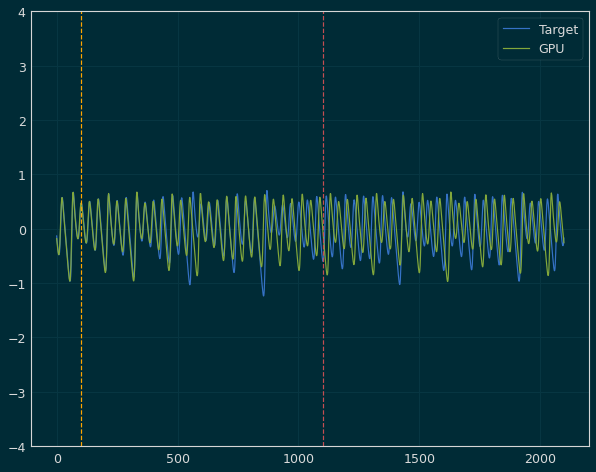

 Iter=86 a=0.555 sr=0.977 amp=1.582  ri=0.350 rr=1.158 loss=0.645494


Iter: 86 #### Diagnostic 0.645494   Time 6.08  Best 0.645 NRMSE 0.174 CD 0.471
Iter: 87 #### Diagnostic 1000.000000   Time 4.97  Best 0.645 NRMSE 1000.000 CD nan
Iter: 88 #### Diagnostic 1000.000000   Time 4.65  Best 0.645 NRMSE 1000.000 CD nan
Iter: 89 #### Diagnostic 1.121241   Time 5.31  Best 0.645 NRMSE 0.199 CD 0.922
Iter: 90 #### Diagnostic 1000.000000   Time 5.41  Best 0.645 NRMSE 1000.000 CD nan
Iter: 91 #### Diagnostic 1000.000000   Time 5.87  Best 0.645 NRMSE 1000.000 CD nan
Iter: 92 #### Diagnostic 1000.000000   Time 6.15  Best 0.645 NRMSE 1000.000 CD nan
Iter: 93 #### Diagnostic 1000.000000   Time 5.11  Best 0.645 NRMSE 1000.000 CD nan
Iter: 94 #### Diagnostic 1000.000000   Time 4.67  Best 0.645 NRMSE 1000.000 CD nan
Iter: 95 #### Diagnostic 1000.000000   Time 4.55  Best 0.645 NRMSE 1000.000 CD nan
Iter: 96 #### Diagnostic 1000.000000   Time 5.88  Best 0.645 NRMSE 1000.000 CD nan
Iter: 97 #### Diagnostic

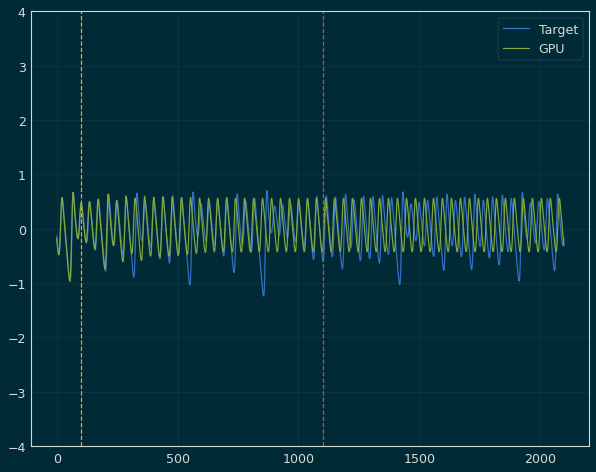

 Iter=16 a=0.608 sr=0.886 amp=1.565  ri=1.583 rr=1.638 loss=0.603066


Iter: 16 #### Diagnostic 0.603066   Time 5.92  Best 0.603 NRMSE 0.159 CD 0.444
Iter: 17 #### Diagnostic 1000.000000   Time 4.81  Best 0.603 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 4.75  Best 0.603 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 5.10  Best 0.603 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 5.58  Best 0.603 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 0.740413   Time 5.74  Best 0.603 NRMSE 0.183 CD 0.557
Iter: 22 #### Diagnostic 1000.000000   Time 5.28  Best 0.603 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 5.50  Best 0.603 NRMSE 1000.000 CD nan


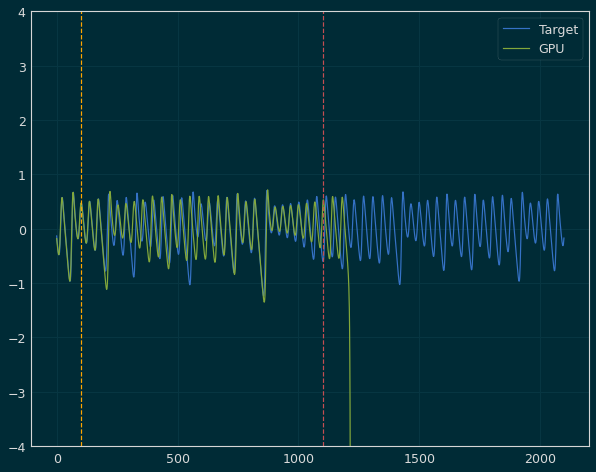

 Iter=24 a=0.684 sr=0.835 amp=1.683  ri=3.367 rr=0.617 loss=0.535757


Iter: 24 #### Diagnostic 0.535757   Time 6.27  Best 0.536 NRMSE 0.160 CD 0.376
Iter: 25 #### Diagnostic 1000.000000   Time 7.50  Best 0.536 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 5.40  Best 0.536 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 4.79  Best 0.536 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 4.80  Best 0.536 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 7.20  Best 0.536 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 6.89  Best 0.536 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 7.11  Best 0.536 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 4.89  Best 0.536 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 5.41  Best 0.536 NRMSE 1000.000 CD nan
Iter: 34 #### Diagnostic 1000.000000   Time 7.07  Best 0.536 NRMSE 1000.000 CD nan
Iter: 35 #### Diagno

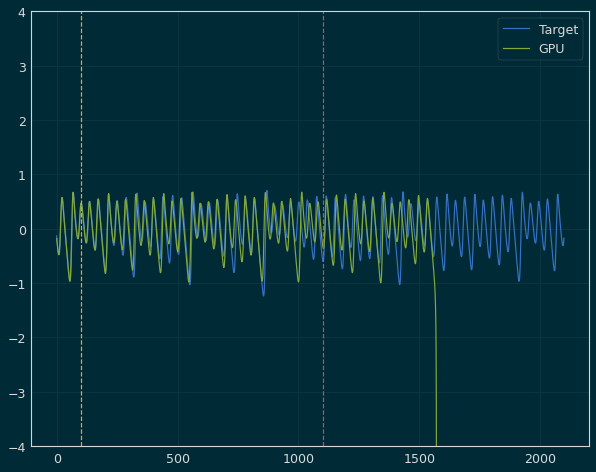

 Iter=64 a=0.635 sr=0.922 amp=1.634  ri=0.549 rr=1.176 loss=0.440910


Iter: 64 #### Diagnostic 0.440910   Time 5.59  Best 0.441 NRMSE 0.141 CD 0.300
Iter: 65 #### Diagnostic 1000.000000   Time 4.97  Best 0.441 NRMSE 1000.000 CD nan
Iter: 66 #### Diagnostic 1000.000000   Time 5.14  Best 0.441 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 1000.000000   Time 5.36  Best 0.441 NRMSE 1000.000 CD nan
Iter: 68 #### Diagnostic 1000.000000   Time 4.58  Best 0.441 NRMSE 1000.000 CD nan
Iter: 69 #### Diagnostic 1000.000000   Time 4.84  Best 0.441 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic 1.000051   Time 6.82  Best 0.441 NRMSE 0.219 CD 0.781
Iter: 71 #### Diagnostic 1000.000000   Time 4.91  Best 0.441 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1000.000000   Time 4.78  Best 0.441 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 1000.000000   Time 4.73  Best 0.441 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 1000.000000   Time 4.97  Best 0.441 NRMSE 1000.000 CD nan
Iter: 75 #### Diagnostic

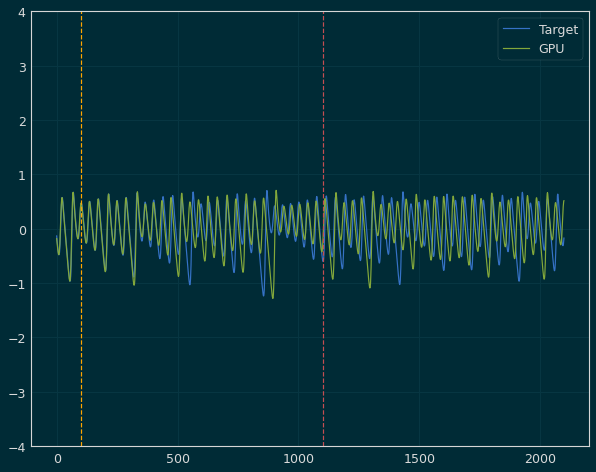

 Iter=35 a=0.697 sr=0.944 amp=1.427  ri=1.573 rr=2.581 loss=0.643581


Iter: 35 #### Diagnostic 0.643581   Time 5.62  Best 0.644 NRMSE 0.164 CD 0.480
Iter: 36 #### Diagnostic 1000.000000   Time 6.78  Best 0.644 NRMSE 1000.000 CD nan
Iter: 37 #### Diagnostic 1000.000000   Time 4.92  Best 0.644 NRMSE 1000.000 CD nan
Iter: 38 #### Diagnostic 1000.000000   Time 6.14  Best 0.644 NRMSE 1000.000 CD nan
Iter: 39 #### Diagnostic 1000.000000   Time 5.58  Best 0.644 NRMSE 1000.000 CD nan
Iter: 40 #### Diagnostic 1000.000000   Time 4.48  Best 0.644 NRMSE 1000.000 CD nan
Iter: 41 #### Diagnostic 1000.000000   Time 5.41  Best 0.644 NRMSE 1000.000 CD nan
Iter: 42 #### Diagnostic 1000.000000   Time 5.43  Best 0.644 NRMSE 1000.000 CD nan
Iter: 43 #### Diagnostic 1.463287   Time 6.50  Best 0.644 NRMSE 0.359 CD 1.105
Iter: 44 #### Diagnostic 1000.000000   Time 7.76  Best 0.644 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 1000.000000   Time 5.08  Best 0.644 NRMSE 1000.000 CD nan
Iter: 46 #### Diagnostic

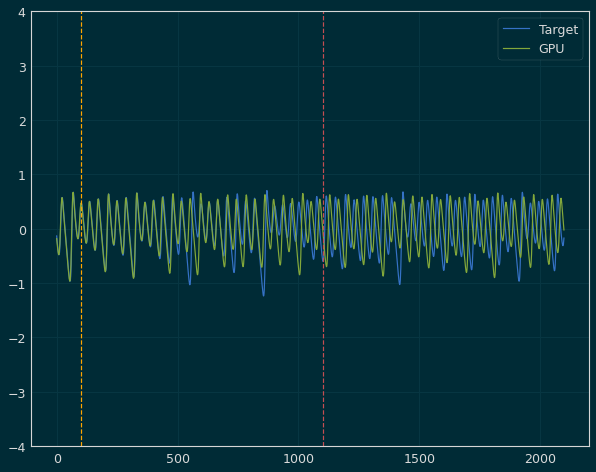

 Iter=51 a=0.645 sr=0.921 amp=1.495  ri=2.202 rr=2.540 loss=0.619274


Iter: 51 #### Diagnostic 0.619274   Time 5.59  Best 0.619 NRMSE 0.169 CD 0.450
Iter: 52 #### Diagnostic 1000.000000   Time 6.45  Best 0.619 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 1000.000000   Time 4.60  Best 0.619 NRMSE 1000.000 CD nan


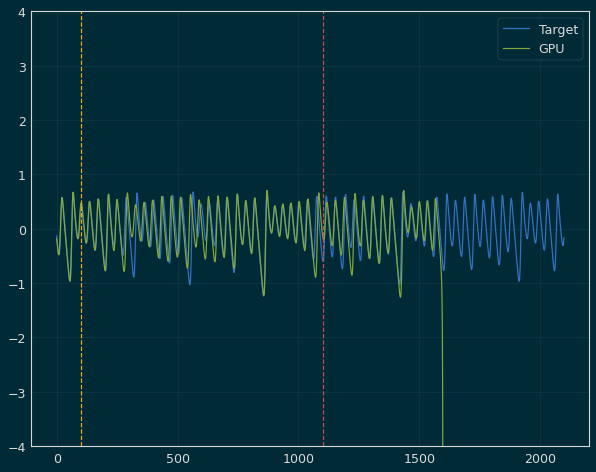

 Iter=54 a=0.619 sr=0.898 amp=1.527  ri=2.706 rr=0.207 loss=0.428558


Iter: 54 #### Diagnostic 0.428558   Time 7.29  Best 0.429 NRMSE 0.140 CD 0.288
Iter: 55 #### Diagnostic 1000.000000   Time 6.60  Best 0.429 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 7.07  Best 0.429 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 5.02  Best 0.429 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 7.09  Best 0.429 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 6.33  Best 0.429 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1000.000000   Time 6.08  Best 0.429 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 6.23  Best 0.429 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 1.131665   Time 4.45  Best 0.429 NRMSE 0.193 CD 0.939
Iter: 63 #### Diagnostic 1000.000000   Time 6.89  Best 0.429 NRMSE 1000.000 CD nan
Iter: 64 #### Diagnostic 1000.000000   Time 5.00  Best 0.429 NRMSE 1000.000 CD nan
Iter: 65 #### Diagnostic

Iter: 49 #### Diagnostic 1000.000000   Time 6.13  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1000.000000   Time 5.28  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 51 #### Diagnostic 1000.000000   Time 4.86  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 52 #### Diagnostic 1000.000000   Time 6.15  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 1000.000000   Time 6.25  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 54 #### Diagnostic 1000.000000   Time 7.83  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 5.39  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 7.16  Best 1000.000 NRMSE 1000.000 CD nan


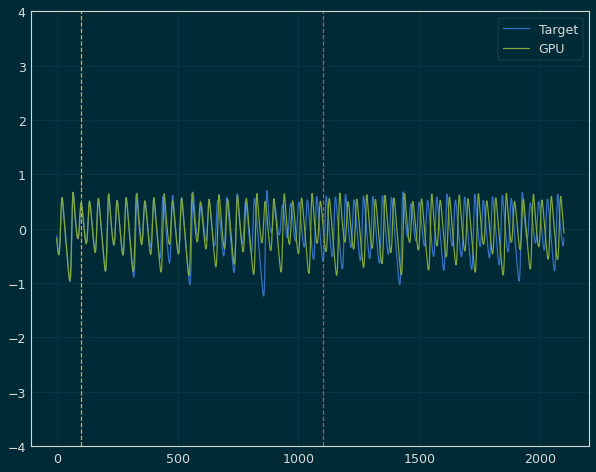

 Iter=57 a=0.613 sr=0.995 amp=1.692  ri=0.228 rr=2.160 loss=0.635676


Iter: 57 #### Diagnostic 0.635676   Time 7.41  Best 0.636 NRMSE 0.173 CD 0.462
Iter: 58 #### Diagnostic 0.840341   Time 5.07  Best 0.636 NRMSE 0.204 CD 0.637
Iter: 59 #### Diagnostic 0.701817   Time 5.54  Best 0.636 NRMSE 0.180 CD 0.522
Iter: 60 #### Diagnostic 1000.000000   Time 6.57  Best 0.636 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1.340290   Time 5.12  Best 0.636 NRMSE 0.300 CD 1.040
Iter: 62 #### Diagnostic 1000.000000   Time 5.24  Best 0.636 NRMSE 1000.000 CD nan
Iter: 63 #### Diagnostic 1000.000000   Time 6.43  Best 0.636 NRMSE 1000.000 CD nan
Iter: 64 #### Diagnostic 1000.000000   Time 5.65  Best 0.636 NRMSE 1000.000 CD nan
Iter: 65 #### Diagnostic 1000.000000   Time 6.07  Best 0.636 NRMSE 1000.000 CD nan
Iter: 66 #### Diagnostic 1000.000000   Time 5.25  Best 0.636 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 1000.000000   Time 5.50  Best 0.636 NRMSE 1000.000 CD nan
Iter: 68 #### Diagnostic 1000.00

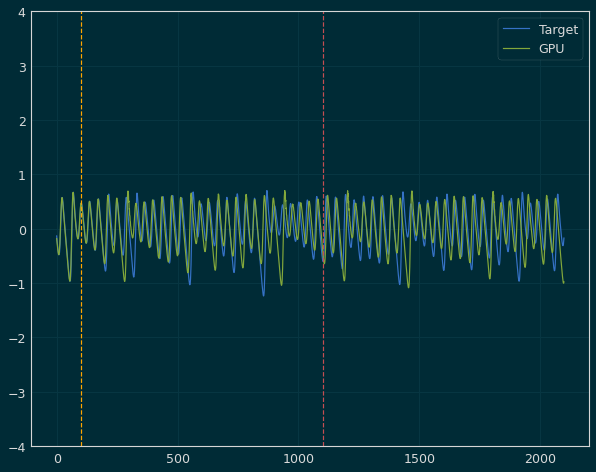

 Iter=6 a=0.578 sr=0.872 amp=1.681  ri=0.283 rr=2.138 loss=0.681291


Iter: 6 #### Diagnostic 0.681291   Time 6.13  Best 0.681 NRMSE 0.178 CD 0.504
Iter: 7 #### Diagnostic 1000.000000   Time 7.97  Best 0.681 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 5.14  Best 0.681 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 4.74  Best 0.681 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 4.72  Best 0.681 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 5.25  Best 0.681 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4.90  Best 0.681 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 5.67  Best 0.681 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 5.34  Best 0.681 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 0.687746   Time 7.15  Best 0.681 NRMSE 0.185 CD 0.503
Iter: 16 #### Diagnostic 1000.000000   Time 5.82  Best 0.681 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 0.71

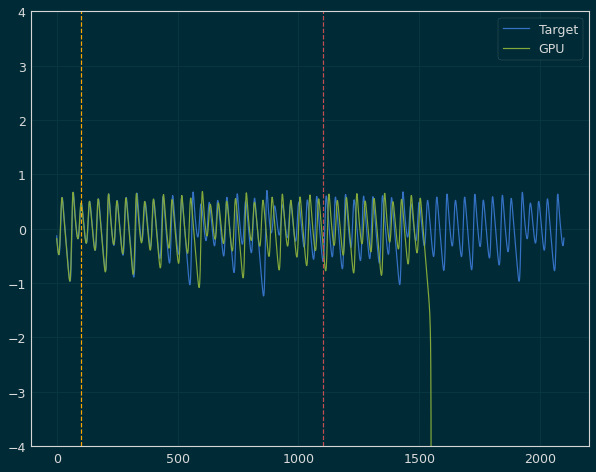

 Iter=36 a=0.555 sr=0.974 amp=1.635  ri=0.673 rr=3.796 loss=0.676850


Iter: 36 #### Diagnostic 0.676850   Time 5.62  Best 0.677 NRMSE 0.172 CD 0.505
Iter: 37 #### Diagnostic 1000.000000   Time 6.71  Best 0.677 NRMSE 1000.000 CD nan
Iter: 38 #### Diagnostic 1000.000000   Time 5.97  Best 0.677 NRMSE 1000.000 CD nan
Iter: 39 #### Diagnostic 1000.000000   Time 6.07  Best 0.677 NRMSE 1000.000 CD nan
Iter: 40 #### Diagnostic 1000.000000   Time 5.96  Best 0.677 NRMSE 1000.000 CD nan
Iter: 41 #### Diagnostic 1000.000000   Time 4.87  Best 0.677 NRMSE 1000.000 CD nan
Iter: 42 #### Diagnostic 1000.000000   Time 4.96  Best 0.677 NRMSE 1000.000 CD nan
Iter: 43 #### Diagnostic 1000.000000   Time 5.88  Best 0.677 NRMSE 1000.000 CD nan
Iter: 44 #### Diagnostic 1000.000000   Time 5.53  Best 0.677 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 0.694883   Time 6.77  Best 0.677 NRMSE 0.178 CD 0.517
Iter: 46 #### Diagnostic 1000.000000   Time 5.35  Best 0.677 NRMSE 1000.000 CD nan
Iter: 47 #### Diagnostic

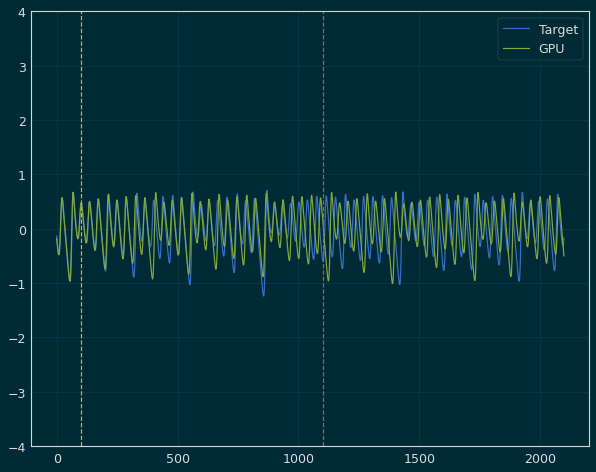

 Iter=76 a=0.662 sr=0.926 amp=1.639  ri=1.438 rr=0.921 loss=0.584622


Iter: 76 #### Diagnostic 0.584622   Time 5.78  Best 0.585 NRMSE 0.169 CD 0.415
Iter: 77 #### Diagnostic 0.828412   Time 6.26  Best 0.585 NRMSE 0.198 CD 0.630
Iter: 78 #### Diagnostic 1000.000000   Time 5.49  Best 0.585 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 4.74  Best 0.585 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 5.06  Best 0.585 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1000.000000   Time 6.35  Best 0.585 NRMSE 1000.000 CD nan
Iter: 82 #### Diagnostic 1000.000000   Time 7.66  Best 0.585 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 1000.000000   Time 4.82  Best 0.585 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.000000   Time 4.33  Best 0.585 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 1000.000000   Time 4.68  Best 0.585 NRMSE 1000.000 CD nan
Iter: 86 #### Diagnostic 1000.000000   Time 5.14  Best 0.585 NRMSE 1000.000 CD nan
Iter: 87 #### Diagnostic

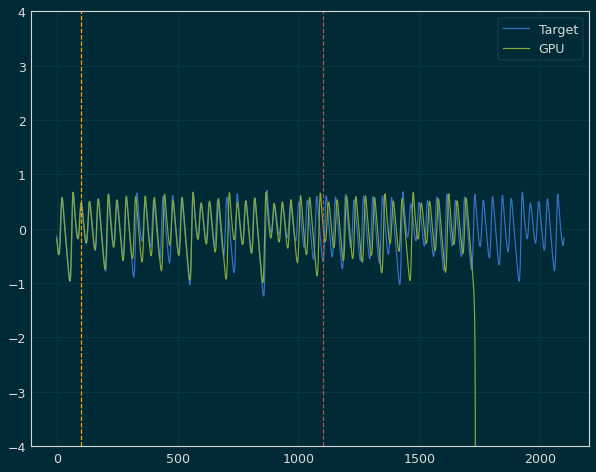

 Iter=40 a=0.641 sr=0.869 amp=1.648  ri=1.419 rr=2.386 loss=0.492097


Iter: 40 #### Diagnostic 0.492097   Time 5.18  Best 0.492 NRMSE 0.151 CD 0.341
Iter: 41 #### Diagnostic 1000.000000   Time 4.34  Best 0.492 NRMSE 1000.000 CD nan
Iter: 42 #### Diagnostic 1000.000000   Time 6.19  Best 0.492 NRMSE 1000.000 CD nan
Iter: 43 #### Diagnostic 1000.000000   Time 6.17  Best 0.492 NRMSE 1000.000 CD nan
Iter: 44 #### Diagnostic 1000.000000   Time 4.92  Best 0.492 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 1000.000000   Time 6.03  Best 0.492 NRMSE 1000.000 CD nan
Iter: 46 #### Diagnostic 1000.000000   Time 5.58  Best 0.492 NRMSE 1000.000 CD nan
Iter: 47 #### Diagnostic 1000.000000   Time 5.74  Best 0.492 NRMSE 1000.000 CD nan
Iter: 48 #### Diagnostic 1000.000000   Time 4.94  Best 0.492 NRMSE 1000.000 CD nan
Iter: 49 #### Diagnostic 1000.000000   Time 5.19  Best 0.492 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1000.000000   Time 5.25  Best 0.492 NRMSE 1000.000 CD nan
Iter: 51 #### Diagno

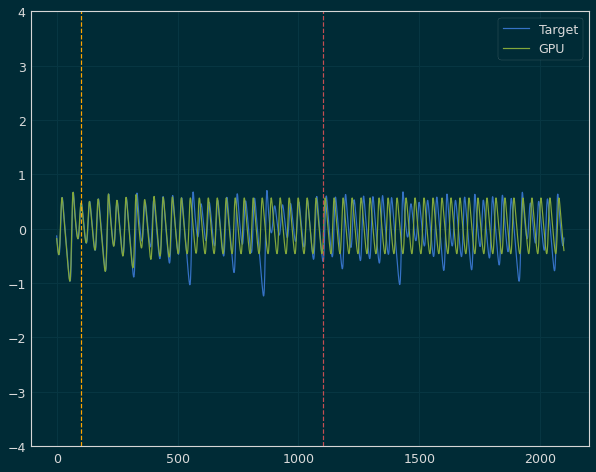

 Iter=23 a=0.596 sr=0.939 amp=1.634  ri=1.837 rr=2.585 loss=0.609749


Iter: 23 #### Diagnostic 0.609749   Time 5.65  Best 0.610 NRMSE 0.163 CD 0.446
Iter: 24 #### Diagnostic 0.759753   Time 5.35  Best 0.610 NRMSE 0.194 CD 0.566
Iter: 25 #### Diagnostic 1000.000000   Time 4.98  Best 0.610 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 4.76  Best 0.610 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 5.33  Best 0.610 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 0.769527   Time 4.44  Best 0.610 NRMSE 0.189 CD 0.580
Iter: 29 #### Diagnostic 1000.000000   Time 6.77  Best 0.610 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 7.29  Best 0.610 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 5.27  Best 0.610 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 4.91  Best 0.610 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 4.88  Best 0.610 NRMSE 1000.000 CD nan
Iter: 34 #### Diagnostic 0.8

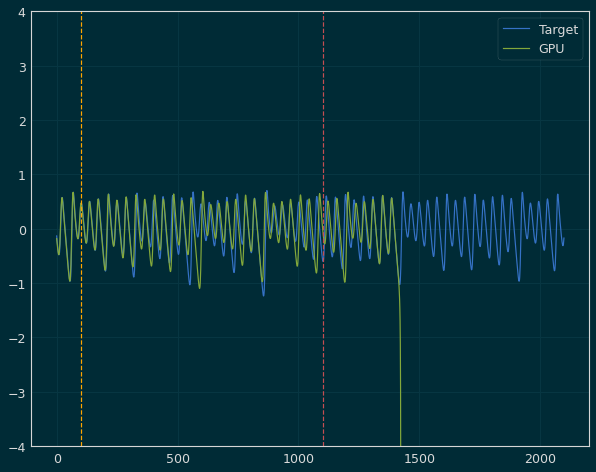

 Iter=75 a=0.653 sr=0.812 amp=1.521  ri=1.402 rr=0.610 loss=0.563249


Iter: 75 #### Diagnostic 0.563249   Time 7.72  Best 0.563 NRMSE 0.161 CD 0.403
Iter: 76 #### Diagnostic 1000.000000   Time 4.62  Best 0.563 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 4.63  Best 0.563 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 4.58  Best 0.563 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 5.96  Best 0.563 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 6.19  Best 0.563 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1000.000000   Time 7.35  Best 0.563 NRMSE 1000.000 CD nan
Iter: 82 #### Diagnostic 1000.000000   Time 5.50  Best 0.563 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 1000.000000   Time 4.79  Best 0.563 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.000000   Time 4.81  Best 0.563 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 1000.000000   Time 5.63  Best 0.563 NRMSE 1000.000 CD nan
Iter: 86 #### Diagno

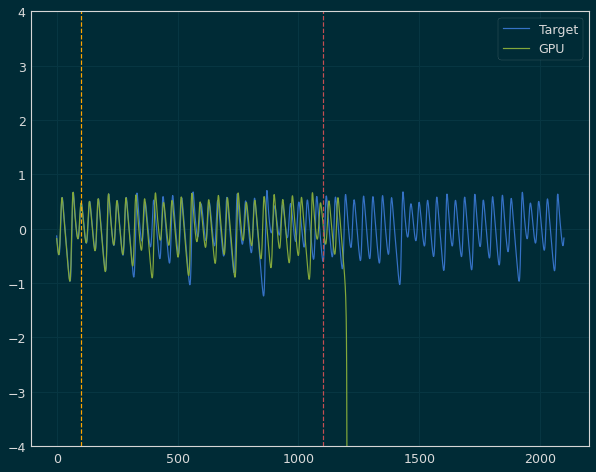

 Iter=13 a=0.646 sr=0.903 amp=1.470  ri=2.019 rr=2.602 loss=0.655637


Iter: 13 #### Diagnostic 0.655637   Time 6.40  Best 0.656 NRMSE 0.176 CD 0.480
Iter: 14 #### Diagnostic 1000.000000   Time 4.35  Best 0.656 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 4.78  Best 0.656 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 5.59  Best 0.656 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 5.58  Best 0.656 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 5.91  Best 0.656 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 4.39  Best 0.656 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 4.77  Best 0.656 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 5.73  Best 0.656 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 6.77  Best 0.656 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 6.41  Best 0.656 NRMSE 1000.000 CD nan
Iter: 24 #### Diagno

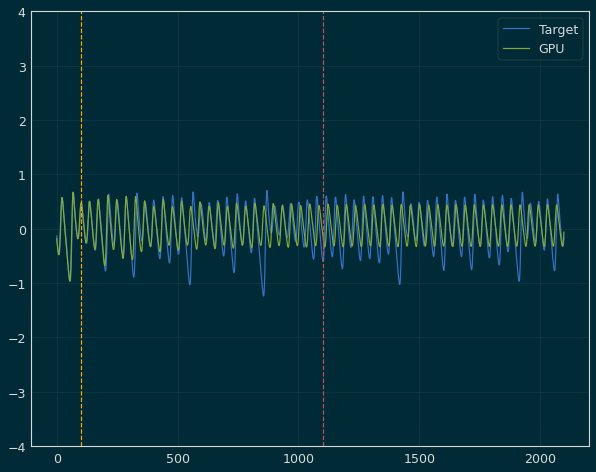

 Iter=53 a=0.572 sr=0.996 amp=1.605  ri=3.460 rr=0.272 loss=0.538395


Iter: 53 #### Diagnostic 0.538395   Time 4.90  Best 0.538 NRMSE 0.142 CD 0.397
Iter: 54 #### Diagnostic 1000.000000   Time 5.37  Best 0.538 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 0.690039   Time 4.97  Best 0.538 NRMSE 0.185 CD 0.505
Iter: 56 #### Diagnostic 1000.000000   Time 5.42  Best 0.538 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 5.01  Best 0.538 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 5.63  Best 0.538 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 6.89  Best 0.538 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 0.668709   Time 5.26  Best 0.538 NRMSE 0.178 CD 0.490
Iter: 61 #### Diagnostic 1000.000000   Time 5.18  Best 0.538 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 1000.000000   Time 5.80  Best 0.538 NRMSE 1000.000 CD nan
Iter: 63 #### Diagnostic 1000.000000   Time 7.47  Best 0.538 NRMSE 1000.000 CD nan
Iter: 64 #### Diagnostic 0.9

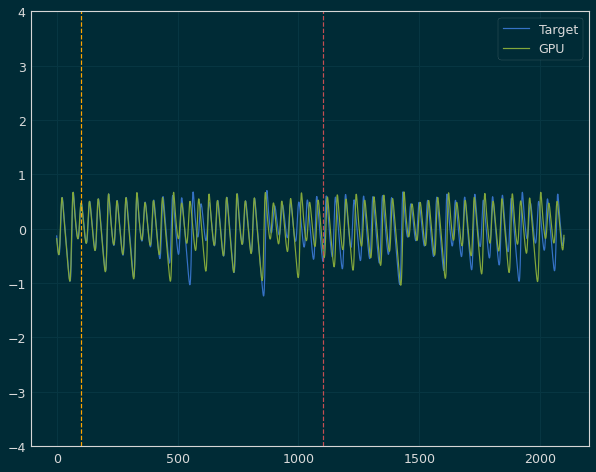

 Iter=1 a=0.553 sr=0.808 amp=1.474  ri=0.375 rr=2.780 loss=0.460368


Iter: 1 #### Diagnostic 0.460368   Time 4.96  Best 0.460 NRMSE 0.142 CD 0.318
Iter: 2 #### Diagnostic 1000.000000   Time 4.96  Best 0.460 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1000.000000   Time 5.24  Best 0.460 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 5.04  Best 0.460 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 4.82  Best 0.460 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1000.000000   Time 5.14  Best 0.460 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 5.31  Best 0.460 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 4.43  Best 0.460 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 5.93  Best 0.460 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 6.71  Best 0.460 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 6.10  Best 0.460 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1.312


Best result = 0.4603680967421689
a = 0.5528122012975648
sr = 0.8081261474002047
amp = 1.4743664891678105
ri = 0.37511243836431596
rr = 2.7795997872611506
********** Size 200 -- Run 3 ***********
Iter: 0 #### Diagnostic 1000.000000   Time 8.18  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 1 #### Diagnostic 1000.000000   Time 6.25  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 2 #### Diagnostic 1000.000000   Time 5.89  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1.029914   Time 5.22  Best 1000.000 NRMSE 0.218 CD 0.812
Iter: 4 #### Diagnostic 1000.000000   Time 5.65  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1.149065   Time 4.57  Best 1000.000 NRMSE 0.193 CD 0.956
Iter: 6 #### Diagnostic 1000.000000   Time 5.08  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 5.53  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 0.994239   Time 5.98  Best 1000.000 NRMSE 0.216 CD 0.778
Iter: 9 #### Diagnostic 1000.000000   Time 4.65  Be

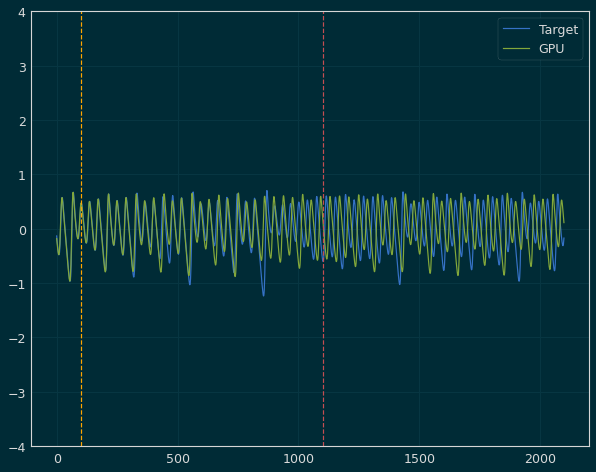

 Iter=43 a=0.596 sr=0.990 amp=1.513  ri=1.761 rr=1.170 loss=0.597722


Iter: 43 #### Diagnostic 0.597722   Time 5.86  Best 0.598 NRMSE 0.170 CD 0.428
Iter: 44 #### Diagnostic 1000.000000   Time 5.68  Best 0.598 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 1000.000000   Time 5.29  Best 0.598 NRMSE 1808094634867.295 CD 1.003
Iter: 46 #### Diagnostic 1000.000000   Time 4.76  Best 0.598 NRMSE 1000.000 CD nan
Iter: 47 #### Diagnostic 1000.000000   Time 4.61  Best 0.598 NRMSE 1000.000 CD nan
Iter: 48 #### Diagnostic 1000.000000   Time 5.51  Best 0.598 NRMSE 1000.000 CD nan
Iter: 49 #### Diagnostic 1000.000000   Time 5.78  Best 0.598 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1000.000000   Time 4.73  Best 0.598 NRMSE 1000.000 CD nan
Iter: 51 #### Diagnostic 1000.000000   Time 4.23  Best 0.598 NRMSE 1000.000 CD nan
Iter: 52 #### Diagnostic 1000.000000   Time 5.87  Best 0.598 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 0.870565   Time 5.89  Best 0.598 NRMSE 0.207 CD 0.664
Iter: 54 ####

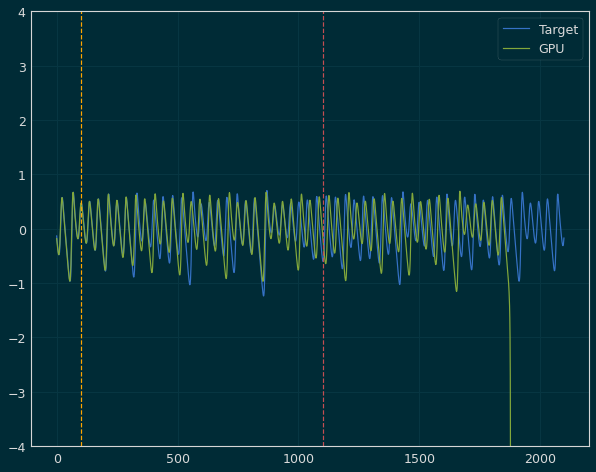

 Iter=63 a=0.689 sr=0.930 amp=1.490  ri=0.327 rr=0.363 loss=0.581695


Iter: 63 #### Diagnostic 0.581695   Time 5.94  Best 0.582 NRMSE 0.164 CD 0.417
Iter: 64 #### Diagnostic 1000.000000   Time 5.52  Best 0.582 NRMSE 1000.000 CD nan
Iter: 65 #### Diagnostic 1000.000000   Time 5.52  Best 0.582 NRMSE 1000.000 CD nan
Iter: 66 #### Diagnostic 1000.000000   Time 7.83  Best 0.582 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 1000.000000   Time 6.20  Best 0.582 NRMSE 1000.000 CD nan
Iter: 68 #### Diagnostic 1000.000000   Time 6.86  Best 0.582 NRMSE 1000.000 CD nan
Iter: 69 #### Diagnostic 1000.000000   Time 6.70  Best 0.582 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic 1000.000000   Time 6.45  Best 0.582 NRMSE 1000.000 CD nan
Iter: 71 #### Diagnostic 1.225798   Time 5.77  Best 0.582 NRMSE 0.243 CD 0.983
Iter: 72 #### Diagnostic 1000.000000   Time 5.71  Best 0.582 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 1000.000000   Time 5.56  Best 0.582 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic

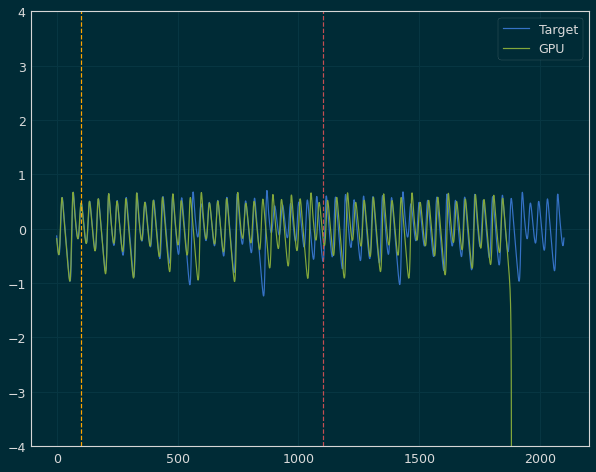

 Iter=10 a=0.617 sr=0.914 amp=1.501  ri=0.231 rr=1.865 loss=0.628058


Iter: 10 #### Diagnostic 0.628058   Time 6.18  Best 0.628 NRMSE 0.165 CD 0.463
Iter: 11 #### Diagnostic 0.828960   Time 6.52  Best 0.628 NRMSE 0.201 CD 0.628
Iter: 12 #### Diagnostic 1000.000000   Time 4.55  Best 0.628 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 0.704938   Time 5.09  Best 0.628 NRMSE 0.179 CD 0.526
Iter: 14 #### Diagnostic 1000.000000   Time 5.41  Best 0.628 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 5.27  Best 0.628 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 0.871406   Time 5.20  Best 0.628 NRMSE 0.206 CD 0.666
Iter: 17 #### Diagnostic 1000.000000   Time 5.02  Best 0.628 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 6.66  Best 0.628 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 4.78  Best 0.628 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 4.81  Best 0.628 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1.07209

Iter: 0 #### Diagnostic 1000.000000   Time 5.05  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 1 #### Diagnostic 0.748426   Time 4.71  Best 1000.000 NRMSE 0.187 CD 0.562
Iter: 2 #### Diagnostic 1000.000000   Time 4.80  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1000.000000   Time 7.06  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 6.82  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 7.45  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1000.000000   Time 5.66  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 4.87  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 5.33  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 5.09  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 5.47  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 5.46  Best 1000.000 NRMS

Iter: 96 #### Diagnostic 1000.000000   Time 4.61  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 97 #### Diagnostic 1000.000000   Time 4.60  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 98 #### Diagnostic 1000.000000   Time 5.21  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 99 #### Diagnostic 1000.000000   Time 4.83  Best 1000.000 NRMSE 1000.000 CD nan

Best result = 0.7162021431475247
a = 0.6749964877392602
sr = 0.8750843316888751
amp = 1.4797065392205062
ri = 2.2534511847776817
rr = 1.0370974330683143
********** Size 200 -- Run 1 ***********
Iter: 0 #### Diagnostic 1000.000000   Time 6.05  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 1 #### Diagnostic 1000.000000   Time 6.53  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 2 #### Diagnostic 1000.000000   Time 6.88  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1000.000000   Time 5.53  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 4.35  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000 

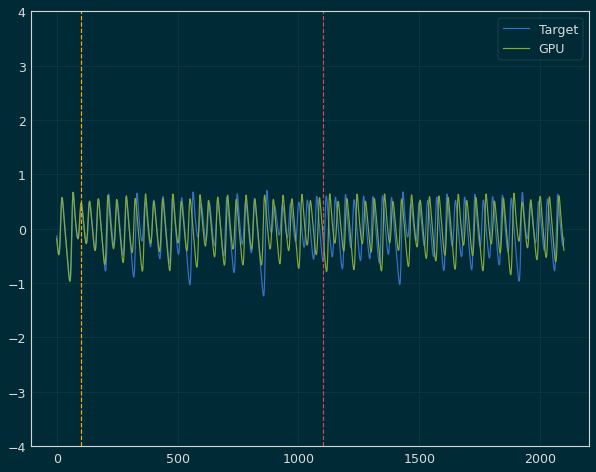

 Iter=79 a=0.563 sr=0.978 amp=1.654  ri=1.088 rr=3.427 loss=0.682141


Iter: 79 #### Diagnostic 0.682141   Time 7.36  Best 0.682 NRMSE 0.176 CD 0.506
Iter: 80 #### Diagnostic 1000.000000   Time 5.31  Best 0.682 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1000.000000   Time 7.11  Best 0.682 NRMSE 1000.000 CD nan
Iter: 82 #### Diagnostic 1000.000000   Time 8.73  Best 0.682 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 1000.000000   Time 5.52  Best 0.682 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.000000   Time 5.43  Best 0.682 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 1000.000000   Time 5.95  Best 0.682 NRMSE 1000.000 CD nan


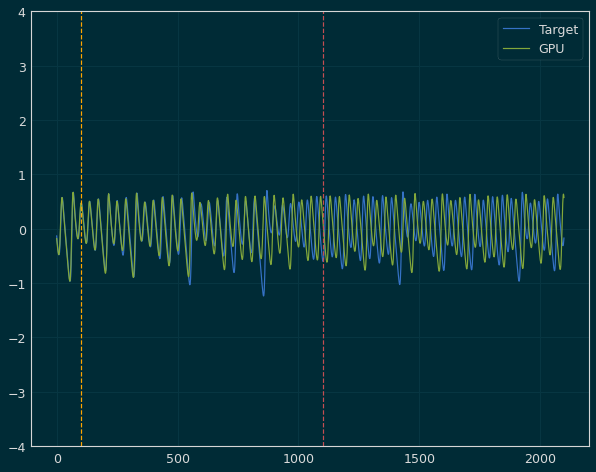

 Iter=86 a=0.571 sr=0.959 amp=1.522  ri=3.583 rr=0.233 loss=0.604365


Iter: 86 #### Diagnostic 0.604365   Time 6.86  Best 0.604 NRMSE 0.170 CD 0.435
Iter: 87 #### Diagnostic 1000.000000   Time 6.14  Best 0.604 NRMSE 1000.000 CD nan
Iter: 88 #### Diagnostic 1000.000000   Time 6.50  Best 0.604 NRMSE 1000.000 CD nan
Iter: 89 #### Diagnostic 1000.000000   Time 5.01  Best 0.604 NRMSE 1000.000 CD nan
Iter: 90 #### Diagnostic 1000.000000   Time 5.31  Best 0.604 NRMSE 1000.000 CD nan
Iter: 91 #### Diagnostic 1000.000000   Time 6.75  Best 0.604 NRMSE 1000.000 CD nan
Iter: 92 #### Diagnostic 1000.000000   Time 6.42  Best 0.604 NRMSE 1000.000 CD nan
Iter: 93 #### Diagnostic 1000.000000   Time 5.53  Best 0.604 NRMSE 1000.000 CD nan
Iter: 94 #### Diagnostic 1000.000000   Time 5.63  Best 0.604 NRMSE 1000.000 CD nan
Iter: 95 #### Diagnostic 1000.000000   Time 4.88  Best 0.604 NRMSE 1000.000 CD nan
Iter: 96 #### Diagnostic 1000.000000   Time 5.42  Best 0.604 NRMSE 1000.000 CD nan
Iter: 97 #### Diagno

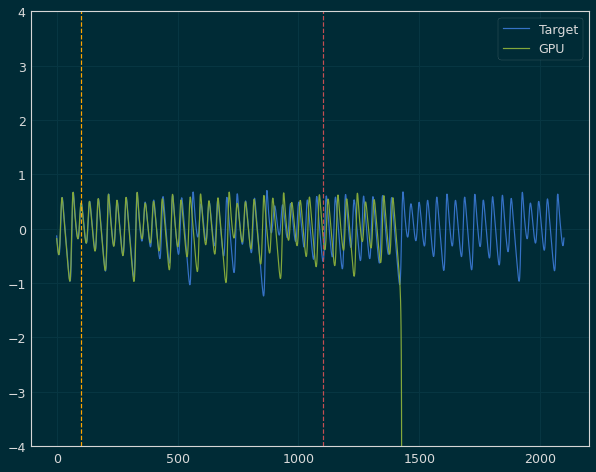

 Iter=6 a=0.571 sr=0.865 amp=1.643  ri=1.597 rr=1.699 loss=0.657846


Iter: 6 #### Diagnostic 0.657846   Time 7.06  Best 0.658 NRMSE 0.172 CD 0.486
Iter: 7 #### Diagnostic 1000.000000   Time 4.78  Best 0.658 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 5.40  Best 0.658 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 372.369441   Time 6.52  Best 0.658 NRMSE 371.358 CD 1.011
Iter: 10 #### Diagnostic 1000.000000   Time 5.06  Best 0.658 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 6.71  Best 0.658 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 6.69  Best 0.658 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 0.732233   Time 5.70  Best 0.658 NRMSE 0.182 CD 0.550
Iter: 14 #### Diagnostic 1000.000000   Time 7.98  Best 0.658 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 5.16  Best 0.658 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 4.95  Best 0.658 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000

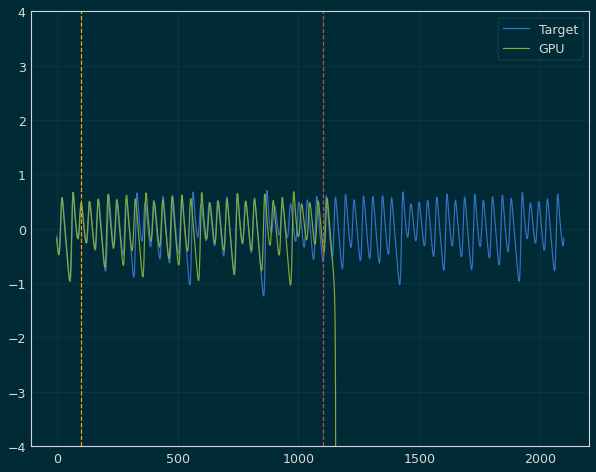

 Iter=23 a=0.568 sr=0.808 amp=1.700  ri=1.073 rr=1.030 loss=0.618584


Iter: 23 #### Diagnostic 0.618584   Time 6.68  Best 0.619 NRMSE 0.165 CD 0.454
Iter: 24 #### Diagnostic 1.215548   Time 5.04  Best 0.619 NRMSE 0.267 CD 0.949
Iter: 25 #### Diagnostic 1000.000000   Time 5.52  Best 0.619 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 5.87  Best 0.619 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 8.16  Best 0.619 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 0.706055   Time 5.63  Best 0.619 NRMSE 0.185 CD 0.521
Iter: 29 #### Diagnostic 1000.000000   Time 4.79  Best 0.619 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 0.659268   Time 5.42  Best 0.619 NRMSE 0.183 CD 0.476
Iter: 31 #### Diagnostic 1000.000000   Time 6.18  Best 0.619 NRMSE 434567636966.421 CD 1.016
Iter: 32 #### Diagnostic 1000.000000   Time 6.99  Best 0.619 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 5.56  Best 0.619 NRMSE 1000.000 CD nan
Iter: 34 #### Diagnost

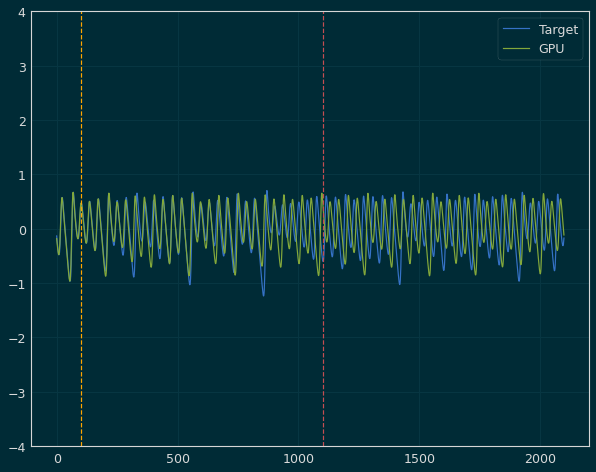

 Iter=90 a=0.575 sr=0.859 amp=1.591  ri=0.888 rr=3.170 loss=0.611909


Iter: 90 #### Diagnostic 0.611909   Time 7.05  Best 0.612 NRMSE 0.173 CD 0.439
Iter: 91 #### Diagnostic 1000.000000   Time 5.40  Best 0.612 NRMSE 1000.000 CD nan
Iter: 92 #### Diagnostic 1000.000000   Time 5.39  Best 0.612 NRMSE 1000.000 CD nan
Iter: 93 #### Diagnostic 1000.000000   Time 7.41  Best 0.612 NRMSE 1000.000 CD nan
Iter: 94 #### Diagnostic 1000.000000   Time 5.20  Best 0.612 NRMSE 1000.000 CD nan
Iter: 95 #### Diagnostic 1000.000000   Time 5.23  Best 0.612 NRMSE 1000.000 CD nan
Iter: 96 #### Diagnostic 1000.000000   Time 4.86  Best 0.612 NRMSE 1000.000 CD nan
Iter: 97 #### Diagnostic 1000.000000   Time 5.25  Best 0.612 NRMSE 1000.000 CD nan
Iter: 98 #### Diagnostic 1000.000000   Time 5.08  Best 0.612 NRMSE 1000.000 CD nan
Iter: 99 #### Diagnostic 1000.000000   Time 4.95  Best 0.612 NRMSE 1000.000 CD nan

Best result = 0.6119090002235255
a = 0.5745382052445871
sr = 0.8593190845021677
amp = 1.59072724977400

Iter: 83 #### Diagnostic 1000.000000   Time 4.49  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.000000   Time 5.79  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 1000.000000   Time 5.66  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 86 #### Diagnostic 1.158935   Time 4.87  Best 1000.000 NRMSE 0.202 CD 0.957
Iter: 87 #### Diagnostic 1000.000000   Time 5.59  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 88 #### Diagnostic 1000.000000   Time 5.20  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 89 #### Diagnostic 1000.000000   Time 6.66  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 90 #### Diagnostic 1000.000000   Time 6.73  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 91 #### Diagnostic 1.526037   Time 5.94  Best 1000.000 NRMSE 0.528 CD 0.998
Iter: 92 #### Diagnostic 1000.000000   Time 6.72  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 93 #### Diagnostic 1000.000000   Time 5.04  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 94 #### Diagnostic 1000.000000   Time 6.20  Best 1000.00

Iter: 77 #### Diagnostic 1000.000000   Time 4.52  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 4.42  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 4.66  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 4.99  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 0.781838   Time 4.81  Best 1000.000 NRMSE 0.190 CD 0.592
Iter: 82 #### Diagnostic 1000.000000   Time 5.03  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 1000.000000   Time 4.66  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.000000   Time 4.64  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 1000.000000   Time 4.84  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 86 #### Diagnostic 0.778301   Time 5.73  Best 1000.000 NRMSE 0.191 CD 0.588
Iter: 87 #### Diagnostic 1000.000000   Time 4.66  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 88 #### Diagnostic 1000.000000   Time 4.98  Best 1000.00

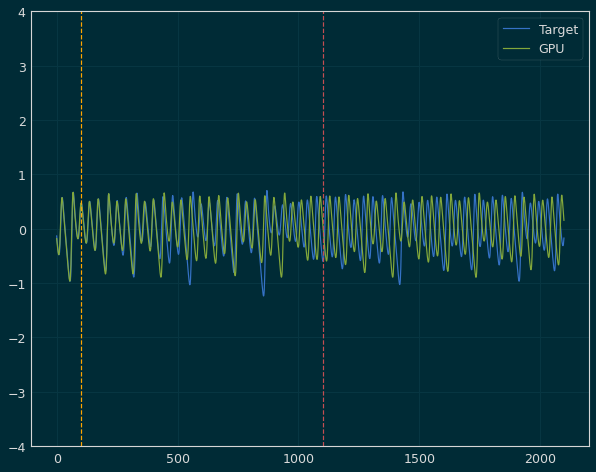

 Iter=12 a=0.600 sr=0.900 amp=1.616  ri=1.488 rr=0.635 loss=0.696539


Iter: 12 #### Diagnostic 0.696539   Time 4.62  Best 0.697 NRMSE 0.184 CD 0.512
Iter: 13 #### Diagnostic 1000.000000   Time 4.38  Best 0.697 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 4.11  Best 0.697 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 0.730428   Time 4.69  Best 0.697 NRMSE 0.184 CD 0.547
Iter: 16 #### Diagnostic 1000.000000   Time 4.15  Best 0.697 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 4.18  Best 0.697 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 5.55  Best 0.697 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 6.01  Best 0.697 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 5.69  Best 0.697 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 5.76  Best 0.697 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 5.15  Best 0.697 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic

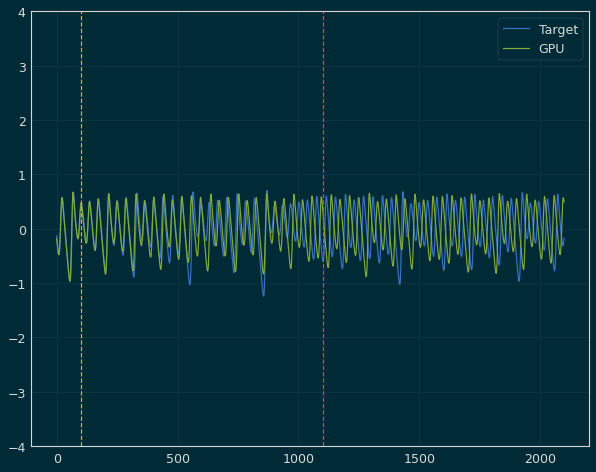

 Iter=70 a=0.691 sr=0.919 amp=1.687  ri=1.723 rr=2.477 loss=0.653963


Iter: 70 #### Diagnostic 0.653963   Time 5.72  Best 0.654 NRMSE 0.183 CD 0.471
Iter: 71 #### Diagnostic 1000.000000   Time 4.53  Best 0.654 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1.206809   Time 4.22  Best 0.654 NRMSE 0.233 CD 0.973
Iter: 73 #### Diagnostic 1000.000000   Time 4.54  Best 0.654 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 1000.000000   Time 4.40  Best 0.654 NRMSE 2907708666998.965 CD 1.009
Iter: 75 #### Diagnostic 1000.000000   Time 4.34  Best 0.654 NRMSE 1000.000 CD nan
Iter: 76 #### Diagnostic 1000.000000   Time 4.27  Best 0.654 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 4.73  Best 0.654 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 4.49  Best 0.654 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 4.89  Best 0.654 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 4.23  Best 0.654 NRMSE 1000.000 CD nan
Iter: 81 ####

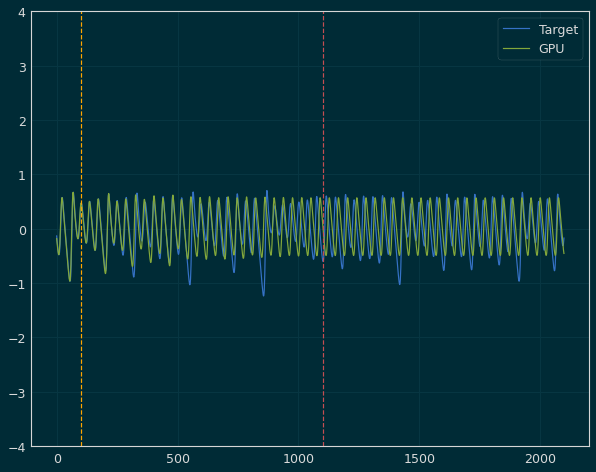

 Iter=88 a=0.608 sr=0.848 amp=1.622  ri=1.509 rr=0.900 loss=0.630456


Iter: 88 #### Diagnostic 0.630456   Time 6.40  Best 0.630 NRMSE 0.172 CD 0.458
Iter: 89 #### Diagnostic 1000.000000   Time 4.31  Best 0.630 NRMSE 1000.000 CD nan
Iter: 90 #### Diagnostic 1000.000000   Time 5.02  Best 0.630 NRMSE 1000.000 CD nan
Iter: 91 #### Diagnostic 1000.000000   Time 4.31  Best 0.630 NRMSE 1000.000 CD nan
Iter: 92 #### Diagnostic 1000.000000   Time 4.82  Best 0.630 NRMSE 1000.000 CD nan
Iter: 93 #### Diagnostic 1000.000000   Time 4.55  Best 0.630 NRMSE 1000.000 CD nan
Iter: 94 #### Diagnostic 1000.000000   Time 4.37  Best 0.630 NRMSE 1000.000 CD nan
Iter: 95 #### Diagnostic 1000.000000   Time 4.12  Best 0.630 NRMSE 1000.000 CD nan
Iter: 96 #### Diagnostic 1000.000000   Time 5.07  Best 0.630 NRMSE 1000.000 CD nan
Iter: 97 #### Diagnostic 1000.000000   Time 5.14  Best 0.630 NRMSE 1000.000 CD nan
Iter: 98 #### Diagnostic 1000.000000   Time 5.40  Best 0.630 NRMSE 1000.000 CD nan
Iter: 99 #### Diagno

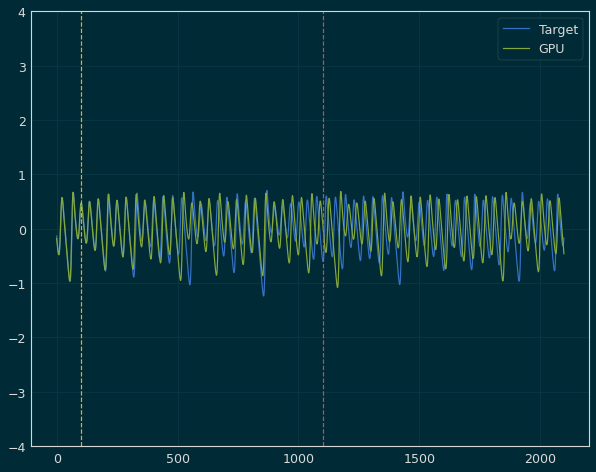

 Iter=6 a=0.641 sr=0.916 amp=1.584  ri=1.458 rr=2.006 loss=0.630736


Iter: 6 #### Diagnostic 0.630736   Time 6.81  Best 0.631 NRMSE 0.173 CD 0.458
Iter: 7 #### Diagnostic 1000.000000   Time 4.27  Best 0.631 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 4.68  Best 0.631 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 4.36  Best 0.631 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 4.30  Best 0.631 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 4.44  Best 0.631 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4.34  Best 0.631 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 5.34  Best 0.631 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 5.89  Best 0.631 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 5.64  Best 0.631 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 4.59  Best 0.631 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 

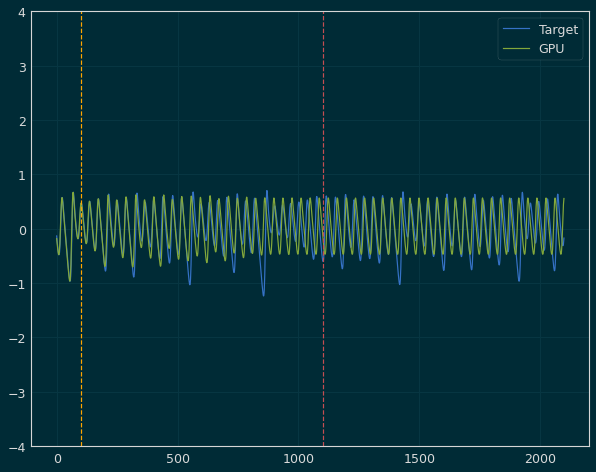

 Iter=64 a=0.691 sr=0.898 amp=1.551  ri=2.343 rr=3.310 loss=0.583926


Iter: 64 #### Diagnostic 0.583926   Time 4.90  Best 0.584 NRMSE 0.164 CD 0.420
Iter: 65 #### Diagnostic 1000.000000   Time 4.48  Best 0.584 NRMSE 1000.000 CD nan
Iter: 66 #### Diagnostic 1000.000000   Time 4.31  Best 0.584 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 1000.000000   Time 4.43  Best 0.584 NRMSE 1000.000 CD nan
Iter: 68 #### Diagnostic 0.773958   Time 4.24  Best 0.584 NRMSE 0.188 CD 0.586
Iter: 69 #### Diagnostic 1000.000000   Time 5.02  Best 0.584 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic 0.771522   Time 5.22  Best 0.584 NRMSE 0.197 CD 0.574
Iter: 71 #### Diagnostic 1000.000000   Time 6.33  Best 0.584 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1000.000000   Time 4.63  Best 0.584 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 0.822352   Time 4.26  Best 0.584 NRMSE 0.208 CD 0.615
Iter: 74 #### Diagnostic 1000.000000   Time 4.50  Best 0.584 NRMSE 1000.000 CD nan
Iter: 75 #### Diagnostic 1000.00

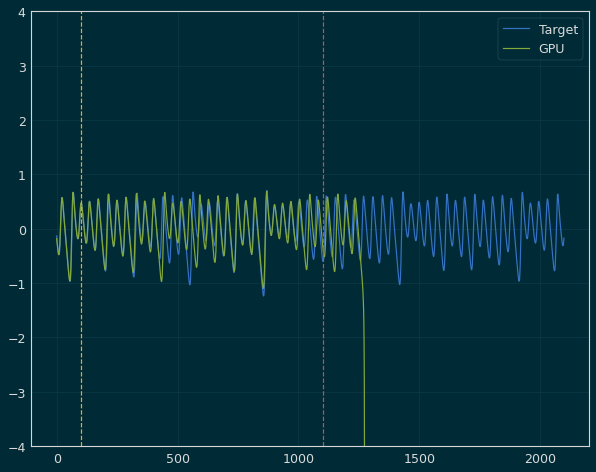

 Iter=80 a=0.602 sr=0.889 amp=1.526  ri=0.794 rr=1.475 loss=0.414795


Iter: 80 #### Diagnostic 0.414795   Time 4.56  Best 0.415 NRMSE 0.134 CD 0.281
Iter: 81 #### Diagnostic 1000.000000   Time 4.44  Best 0.415 NRMSE 1000.000 CD nan
Iter: 82 #### Diagnostic 1000.000000   Time 4.50  Best 0.415 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 1000.000000   Time 4.27  Best 0.415 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.000000   Time 4.10  Best 0.415 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 1000.000000   Time 4.71  Best 0.415 NRMSE 1000.000 CD nan
Iter: 86 #### Diagnostic 1000.000000   Time 4.27  Best 0.415 NRMSE 1000.000 CD nan
Iter: 87 #### Diagnostic 1000.000000   Time 4.74  Best 0.415 NRMSE 1000.000 CD nan
Iter: 88 #### Diagnostic 1000.000000   Time 5.99  Best 0.415 NRMSE 1000.000 CD nan
Iter: 89 #### Diagnostic 1000.000000   Time 5.79  Best 0.415 NRMSE 1000.000 CD nan
Iter: 90 #### Diagnostic 1000.000000   Time 4.42  Best 0.415 NRMSE 1000.000 CD nan
Iter: 91 #### Diagno

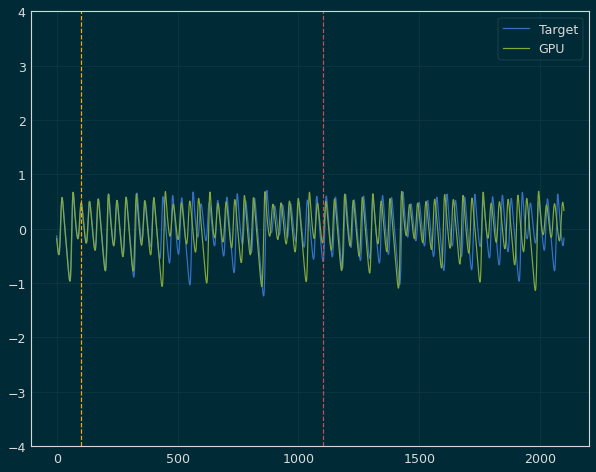

 Iter=4 a=0.596 sr=0.917 amp=1.482  ri=1.819 rr=3.031 loss=0.667458


Iter: 4 #### Diagnostic 0.667458   Time 4.95  Best 0.667 NRMSE 0.175 CD 0.492
Iter: 5 #### Diagnostic 1000.000000   Time 4.83  Best 0.667 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1000.000000   Time 5.76  Best 0.667 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 5.78  Best 0.667 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 0.778654   Time 6.49  Best 0.667 NRMSE 0.193 CD 0.586
Iter: 9 #### Diagnostic 107.308055   Time 4.71  Best 0.667 NRMSE 106.422 CD 0.886
Iter: 10 #### Diagnostic 27.894392   Time 4.20  Best 0.667 NRMSE 26.896 CD 0.999
Iter: 11 #### Diagnostic 1000.000000   Time 5.14  Best 0.667 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4.65  Best 0.667 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 4.42  Best 0.667 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 6.64  Best 0.667 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000

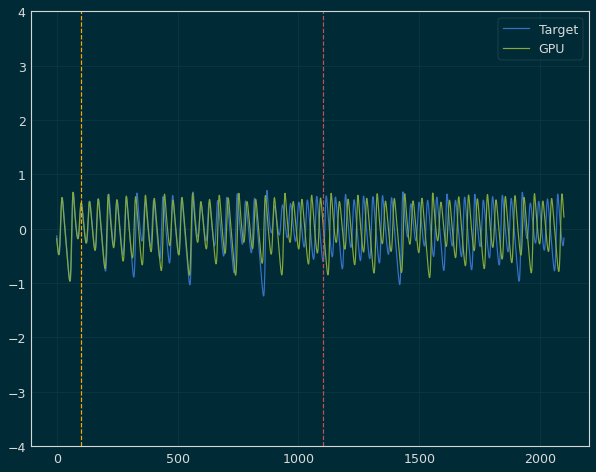

 Iter=59 a=0.645 sr=0.958 amp=1.413  ri=1.091 rr=2.516 loss=0.666275


Iter: 59 #### Diagnostic 0.666275   Time 4.99  Best 0.666 NRMSE 0.183 CD 0.483
Iter: 60 #### Diagnostic 1000.000000   Time 4.42  Best 0.666 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 4.25  Best 0.666 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 1000.000000   Time 4.48  Best 0.666 NRMSE 1000.000 CD nan
Iter: 63 #### Diagnostic 1000.000000   Time 4.34  Best 0.666 NRMSE 1000.000 CD nan
Iter: 64 #### Diagnostic 1000.000000   Time 4.21  Best 0.666 NRMSE 1000.000 CD nan
Iter: 65 #### Diagnostic 1000.000000   Time 4.62  Best 0.666 NRMSE 1000.000 CD nan
Iter: 66 #### Diagnostic 1000.000000   Time 4.54  Best 0.666 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 0.848950   Time 5.49  Best 0.666 NRMSE 0.204 CD 0.645
Iter: 68 #### Diagnostic 1000.000000   Time 4.40  Best 0.666 NRMSE 1000.000 CD nan
Iter: 69 #### Diagnostic 1000.000000   Time 4.16  Best 0.666 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic

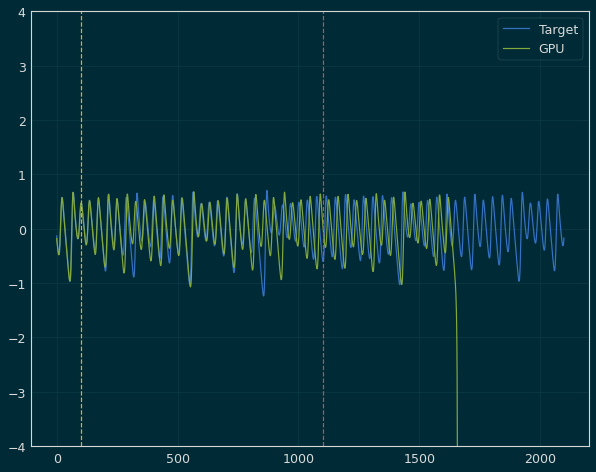

 Iter=17 a=0.592 sr=0.837 amp=1.668  ri=2.680 rr=0.692 loss=0.612715


Iter: 17 #### Diagnostic 0.612715   Time 4.90  Best 0.613 NRMSE 0.169 CD 0.444
Iter: 18 #### Diagnostic 1000.000000   Time 4.55  Best 0.613 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 4.41  Best 0.613 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 5.30  Best 0.613 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1.137909   Time 4.68  Best 0.613 NRMSE 0.193 CD 0.945
Iter: 22 #### Diagnostic 1000.000000   Time 4.47  Best 0.613 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 4.59  Best 0.613 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 5.02  Best 0.613 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 4.70  Best 0.613 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 4.34  Best 0.613 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 4.61  Best 0.613 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic

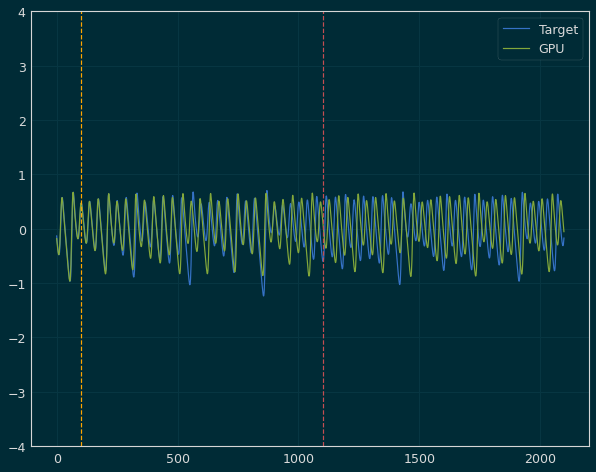

 Iter=13 a=0.563 sr=0.987 amp=1.480  ri=1.406 rr=3.807 loss=0.592469


Iter: 13 #### Diagnostic 0.592469   Time 4.57  Best 0.592 NRMSE 0.169 CD 0.424
Iter: 14 #### Diagnostic 0.846551   Time 4.35  Best 0.592 NRMSE 0.206 CD 0.640
Iter: 15 #### Diagnostic 1000.000000   Time 4.72  Best 0.592 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1.506633   Time 4.17  Best 0.592 NRMSE 0.517 CD 0.990
Iter: 17 #### Diagnostic 1000.000000   Time 4.38  Best 0.592 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 4.31  Best 0.592 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 4.84  Best 0.592 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 0.741269   Time 4.42  Best 0.592 NRMSE 0.192 CD 0.550
Iter: 21 #### Diagnostic 1000.000000   Time 4.25  Best 0.592 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 4.05  Best 0.592 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 4.31  Best 0.592 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.00

Iter: 2 #### Diagnostic 1000.000000   Time 4.11  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1.552601   Time 4.00  Best 1000.000 NRMSE 0.292 CD 1.261
Iter: 4 #### Diagnostic 1.446270   Time 3.99  Best 1000.000 NRMSE 0.276 CD 1.171
Iter: 5 #### Diagnostic 1000.000000   Time 4.00  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 0.800821   Time 4.02  Best 1000.000 NRMSE 0.193 CD 0.608
Iter: 7 #### Diagnostic 1000.000000   Time 4.01  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 4.01  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 4.00  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 3.97  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 3.96  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4.07  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 0.710364   Time 3.96  Best 1000.000 NRMSE 0.181 C

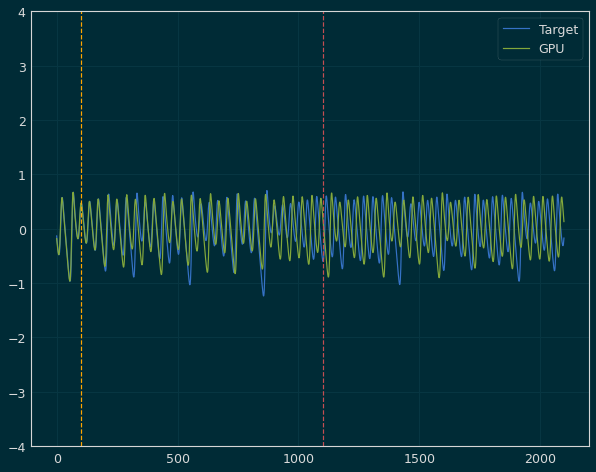

 Iter=21 a=0.574 sr=0.870 amp=1.449  ri=0.575 rr=0.294 loss=0.694571


Iter: 21 #### Diagnostic 0.694571   Time 4.32  Best 0.695 NRMSE 0.186 CD 0.509
Iter: 22 #### Diagnostic 1000.000000   Time 4.05  Best 0.695 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 0.796690   Time 4.22  Best 0.695 NRMSE 0.193 CD 0.604
Iter: 24 #### Diagnostic 1000.000000   Time 4.03  Best 0.695 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 4.09  Best 0.695 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 5.59  Best 0.695 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 4.26  Best 0.695 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 4.34  Best 0.695 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 4.21  Best 0.695 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 4.00  Best 0.695 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 4.01  Best 0.695 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic

Iter: 17 #### Diagnostic 1000.000000   Time 3.89  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 3.88  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 3.91  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 3.91  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 3.86  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 507.522155   Time 3.95  Best 1000.000 NRMSE 506.604 CD 0.918
Iter: 23 #### Diagnostic 1000.000000   Time 3.95  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 4.07  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 4.44  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1.027830   Time 3.95  Best 1000.000 NRMSE 0.193 CD 0.835
Iter: 27 #### Diagnostic 1000.000000   Time 3.88  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 3.95  Best 100

Iter: 11 #### Diagnostic 1000.000000   Time 3.97  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 3.95  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 3.94  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1.180074   Time 4.04  Best 1000.000 NRMSE 0.196 CD 0.984
Iter: 15 #### Diagnostic 1000.000000   Time 4.02  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 3.97  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 4.16  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 4.56  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 3.96  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 3.91  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 4.01  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 4.09  Best 100

Iter: 5 #### Diagnostic 1000.000000   Time 3.96  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1000.000000   Time 3.95  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 3.94  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 4.00  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 3.93  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 3.93  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 0.828551   Time 4.05  Best 1000.000 NRMSE 0.199 CD 0.629
Iter: 12 #### Diagnostic 1000.000000   Time 3.95  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 0.757201   Time 3.98  Best 1000.000 NRMSE 0.190 CD 0.568
Iter: 14 #### Diagnostic 1000.000000   Time 3.96  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 3.91  Best 1000.000 NRMSE 1000.000 CD nan


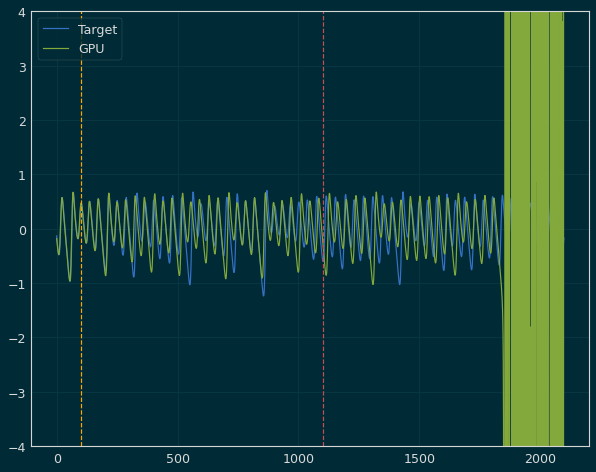

 Iter=16 a=0.599 sr=0.987 amp=1.683  ri=0.335 rr=0.781 loss=0.618408


Iter: 16 #### Diagnostic 0.618408   Time 4.34  Best 0.618 NRMSE 0.169 CD 0.449
Iter: 17 #### Diagnostic 1000.000000   Time 3.91  Best 0.618 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1.527726   Time 4.04  Best 0.618 NRMSE 0.528 CD 1.000
Iter: 19 #### Diagnostic 1000.000000   Time 3.97  Best 0.618 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 4.02  Best 0.618 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 4.01  Best 0.618 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 4.86  Best 0.618 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 0.796607   Time 4.78  Best 0.618 NRMSE 0.198 CD 0.599
Iter: 24 #### Diagnostic 1000.000000   Time 4.02  Best 0.618 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 4.00  Best 0.618 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 4.08  Best 0.618 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 100

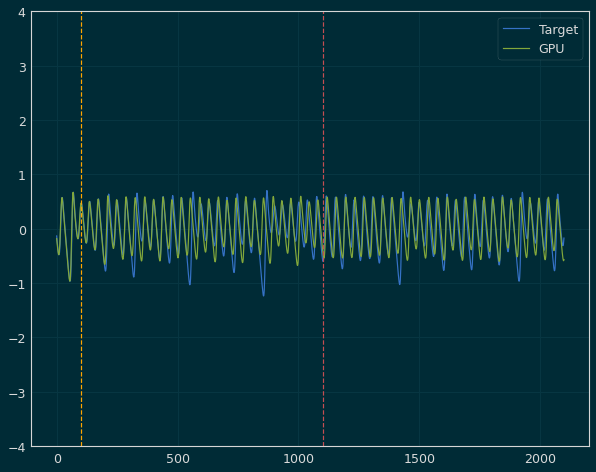

 Iter=11 a=0.585 sr=0.867 amp=1.511  ri=0.874 rr=2.807 loss=0.614452


Iter: 11 #### Diagnostic 0.614452   Time 4.50  Best 0.614 NRMSE 0.160 CD 0.455
Iter: 12 #### Diagnostic 1000.000000   Time 3.95  Best 0.614 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 4.14  Best 0.614 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 4.87  Best 0.614 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 4.84  Best 0.614 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 5.23  Best 0.614 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 4.15  Best 0.614 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 4.83  Best 0.614 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 5.40  Best 0.614 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 4.83  Best 0.614 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 5.46  Best 0.614 NRMSE 1000.000 CD nan
Iter: 22 #### Diagno

Iter: 1 #### Diagnostic 1000.000000   Time 4.23  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 2 #### Diagnostic 1000.000000   Time 4.93  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1.090869   Time 5.31  Best 1000.000 NRMSE 0.232 CD 0.859
Iter: 4 #### Diagnostic 1000.000000   Time 4.07  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 4.09  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1000.000000   Time 4.06  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 4.33  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 4.23  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 4.28  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 3.97  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 4.15  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4.09  Best 1000.000 NRM

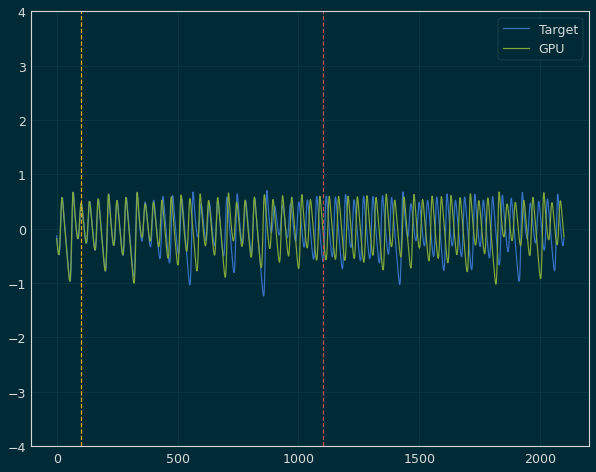

 Iter=21 a=0.574 sr=0.870 amp=1.449  ri=0.575 rr=0.294 loss=0.691505


Iter: 21 #### Diagnostic 0.691505   Time 4.49  Best 0.692 NRMSE 0.181 CD 0.511
Iter: 22 #### Diagnostic 1000.000000   Time 4.17  Best 0.692 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 4.14  Best 0.692 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 4.34  Best 0.692 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 0.864100   Time 4.82  Best 0.692 NRMSE 0.213 CD 0.651
Iter: 26 #### Diagnostic 1000.000000   Time 4.55  Best 0.692 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 4.33  Best 0.692 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 4.22  Best 0.692 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 4.32  Best 0.692 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 4.25  Best 0.692 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 4.20  Best 0.692 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic

Iter: 17 #### Diagnostic 1000.000000   Time 4.09  Best 1000.000 NRMSE 372632482366137042523389952.000 CD 1.011
Iter: 18 #### Diagnostic 1000.000000   Time 4.14  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 0.949818   Time 4.15  Best 1000.000 NRMSE 0.225 CD 0.725
Iter: 20 #### Diagnostic 1000.000000   Time 4.17  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 4.12  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1.193039   Time 4.17  Best 1000.000 NRMSE 0.231 CD 0.962
Iter: 23 #### Diagnostic 1000.000000   Time 4.09  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 4.07  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 4.07  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 4.08  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 4.17  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000 

Iter: 11 #### Diagnostic 1000.000000   Time 4.15  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4.30  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1.228270   Time 4.15  Best 1000.000 NRMSE 0.228 CD 1.000
Iter: 14 #### Diagnostic 1000.000000   Time 4.21  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1.497057   Time 4.45  Best 1000.000 NRMSE 0.512 CD 0.985
Iter: 16 #### Diagnostic 1000.000000   Time 4.26  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 4.04  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 4.10  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 4.01  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 4.34  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 4.17  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 4.16  Best 1000.00

Iter: 5 #### Diagnostic 1.515838   Time 4.06  Best 1000.000 NRMSE 0.515 CD 1.001
Iter: 6 #### Diagnostic 1000.000000   Time 4.12  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 4.11  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 4.08  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 4.11  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1.377654   Time 4.09  Best 1000.000 NRMSE 0.265 CD 1.113
Iter: 11 #### Diagnostic 1000.000000   Time 4.29  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4.18  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 4.12  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1.217605   Time 4.10  Best 1000.000 NRMSE 0.217 CD 1.001
Iter: 15 #### Diagnostic 1000.000000   Time 4.15  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 4.15  Best 1000.000 NRMSE 1

Iter: 0 #### Diagnostic 1000.000000   Time 4.17  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 1 #### Diagnostic 1000.000000   Time 4.38  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 2 #### Diagnostic 1000.000000   Time 4.24  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1000.000000   Time 4.32  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 4.26  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 4.29  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 473.488945   Time 4.37  Best 1000.000 NRMSE 472.492 CD 0.997
Iter: 7 #### Diagnostic 1000.000000   Time 4.06  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 4.15  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 4.23  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 4.10  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 4.11  Best 1000.000 

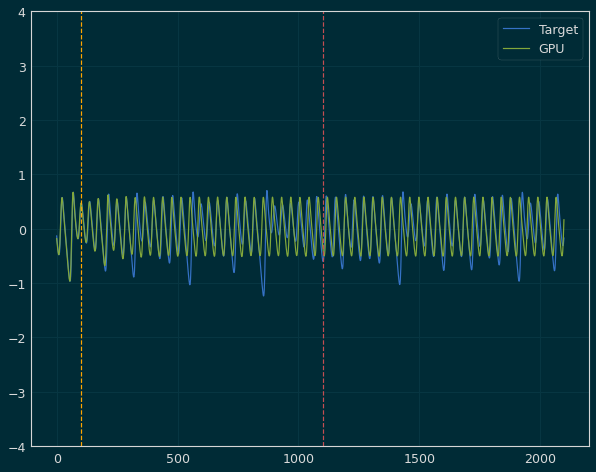

 Iter=51 a=0.554 sr=0.815 amp=1.468  ri=0.277 rr=3.052 loss=0.643276


Iter: 51 #### Diagnostic 0.643276   Time 4.76  Best 0.643 NRMSE 0.168 CD 0.475
Iter: 52 #### Diagnostic 1000.000000   Time 4.21  Best 0.643 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 1000.000000   Time 4.60  Best 0.643 NRMSE 1000.000 CD nan
Iter: 54 #### Diagnostic 1000.000000   Time 4.41  Best 0.643 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 4.09  Best 0.643 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 4.15  Best 0.643 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 4.08  Best 0.643 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 4.11  Best 0.643 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 0.857061   Time 4.07  Best 0.643 NRMSE 0.200 CD 0.657
Iter: 60 #### Diagnostic 1000.000000   Time 4.17  Best 0.643 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 4.30  Best 0.643 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic

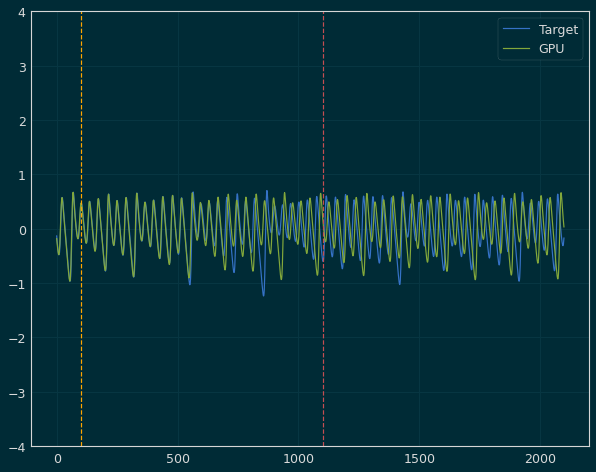

 Iter=12 a=0.600 sr=0.900 amp=1.616  ri=1.488 rr=0.635 loss=0.589488


Iter: 12 #### Diagnostic 0.589488   Time 4.65  Best 0.589 NRMSE 0.165 CD 0.425
Iter: 13 #### Diagnostic 0.855273   Time 4.12  Best 0.589 NRMSE 0.206 CD 0.649
Iter: 14 #### Diagnostic 1000.000000   Time 4.05  Best 0.589 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 4.02  Best 0.589 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 4.05  Best 0.589 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 4.09  Best 0.589 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 4.09  Best 0.589 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 4.09  Best 0.589 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 4.10  Best 0.589 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 0.672568   Time 4.09  Best 0.589 NRMSE 0.184 CD 0.489
Iter: 22 #### Diagnostic 1000.000000   Time 4.08  Best 0.589 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 100

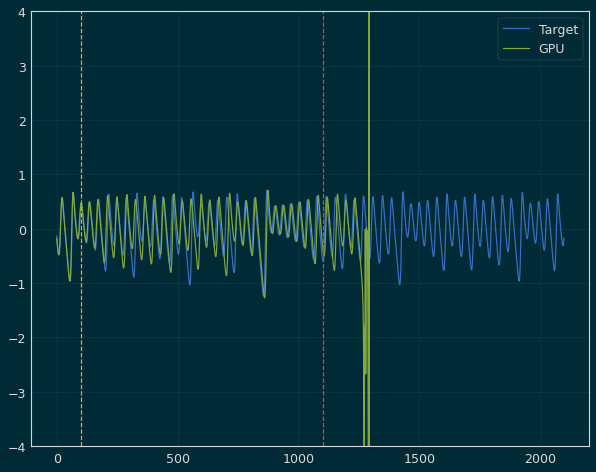

 Iter=44 a=0.685 sr=0.948 amp=1.631  ri=1.299 rr=0.638 loss=0.528176


Iter: 44 #### Diagnostic 0.528176   Time 4.42  Best 0.528 NRMSE 0.156 CD 0.372
Iter: 45 #### Diagnostic 1000.000000   Time 4.10  Best 0.528 NRMSE 1000.000 CD nan
Iter: 46 #### Diagnostic 1000.000000   Time 4.17  Best 0.528 NRMSE 1000.000 CD nan
Iter: 47 #### Diagnostic 1000.000000   Time 4.06  Best 0.528 NRMSE 1000.000 CD nan
Iter: 48 #### Diagnostic 1000.000000   Time 4.10  Best 0.528 NRMSE 1000.000 CD nan
Iter: 49 #### Diagnostic 1000.000000   Time 4.12  Best 0.528 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1000.000000   Time 4.08  Best 0.528 NRMSE 1000.000 CD nan
Iter: 51 #### Diagnostic 1000.000000   Time 4.15  Best 0.528 NRMSE 1000.000 CD nan
Iter: 52 #### Diagnostic 1000.000000   Time 4.34  Best 0.528 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 1.050010   Time 4.04  Best 0.528 NRMSE 0.219 CD 0.831
Iter: 54 #### Diagnostic 1000.000000   Time 4.09  Best 0.528 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic

Iter: 39 #### Diagnostic 0.746740   Time 4.12  Best 1000.000 NRMSE 0.192 CD 0.555
Iter: 40 #### Diagnostic 1000.000000   Time 4.15  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 41 #### Diagnostic 1000.000000   Time 4.25  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 42 #### Diagnostic 1000.000000   Time 4.17  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 43 #### Diagnostic 1.526697   Time 4.06  Best 1000.000 NRMSE 0.527 CD 1.000
Iter: 44 #### Diagnostic 1000.000000   Time 4.12  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 1.529597   Time 4.12  Best 1000.000 NRMSE 0.530 CD 1.000
Iter: 46 #### Diagnostic 1000.000000   Time 4.36  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 47 #### Diagnostic 1000.000000   Time 4.20  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 48 #### Diagnostic 5.739372   Time 4.12  Best 1000.000 NRMSE 4.640 CD 1.100
Iter: 49 #### Diagnostic 1000.000000   Time 4.09  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1000.000000   Time 4.04  Best 1000.000 NRMSE 

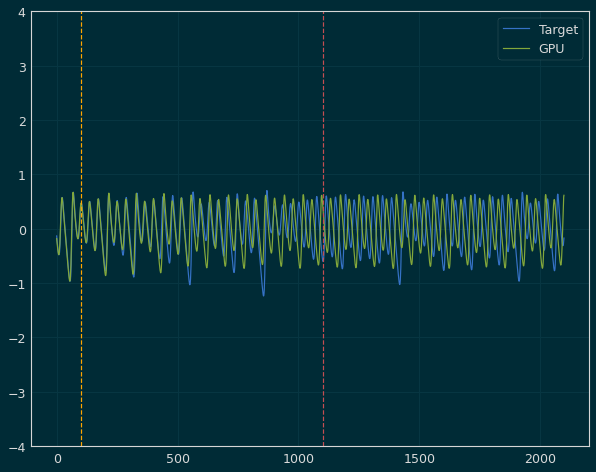

 Iter=52 a=0.581 sr=0.938 amp=1.402  ri=1.700 rr=0.818 loss=0.685553


Iter: 52 #### Diagnostic 0.685553   Time 5.01  Best 0.686 NRMSE 0.185 CD 0.501
Iter: 53 #### Diagnostic 1000.000000   Time 4.14  Best 0.686 NRMSE 1000.000 CD nan
Iter: 54 #### Diagnostic 1.513538   Time 4.11  Best 0.686 NRMSE 0.522 CD 0.992
Iter: 55 #### Diagnostic 1000.000000   Time 4.12  Best 0.686 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 4.06  Best 0.686 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 4.16  Best 0.686 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 4.22  Best 0.686 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 4.12  Best 0.686 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1000.000000   Time 4.08  Best 0.686 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 4.02  Best 0.686 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 1000.000000   Time 4.06  Best 0.686 NRMSE 1000.000 CD nan
Iter: 63 #### Diagnostic

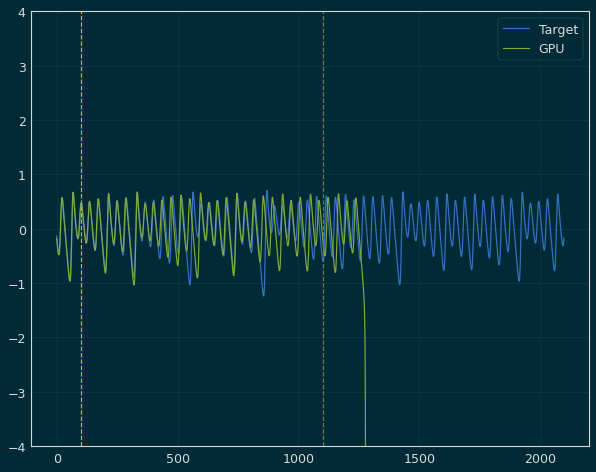

 Iter=71 a=0.576 sr=0.858 amp=1.601  ri=1.989 rr=0.259 loss=0.660884


Iter: 71 #### Diagnostic 0.660884   Time 4.67  Best 0.661 NRMSE 0.173 CD 0.488
Iter: 72 #### Diagnostic 1000.000000   Time 4.15  Best 0.661 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 1000.000000   Time 4.13  Best 0.661 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 1.207846   Time 4.12  Best 0.661 NRMSE 0.227 CD 0.981
Iter: 75 #### Diagnostic 1000.000000   Time 3.99  Best 0.661 NRMSE 1000.000 CD nan
Iter: 76 #### Diagnostic 1000.000000   Time 4.13  Best 0.661 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 4.05  Best 0.661 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 4.09  Best 0.661 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 4.04  Best 0.661 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 4.15  Best 0.661 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1000.000000   Time 4.07  Best 0.661 NRMSE 1000.000 CD nan
Iter: 82 #### Diagnostic

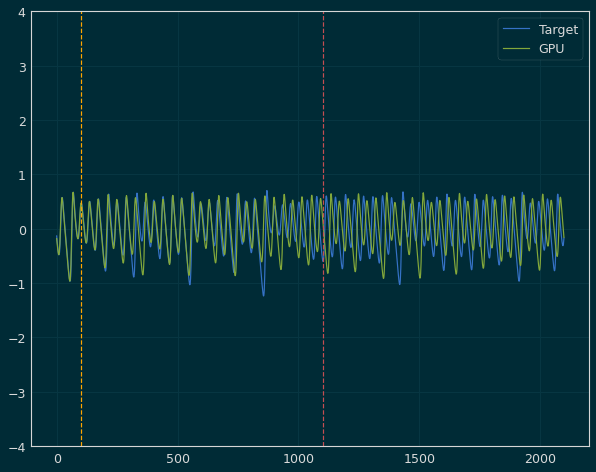

 Iter=92 a=0.596 sr=0.868 amp=1.430  ri=0.298 rr=0.364 loss=0.636020


Iter: 92 #### Diagnostic 0.636020   Time 4.43  Best 0.636 NRMSE 0.176 CD 0.460
Iter: 93 #### Diagnostic 1000.000000   Time 4.15  Best 0.636 NRMSE 1000.000 CD nan
Iter: 94 #### Diagnostic 1000.000000   Time 4.09  Best 0.636 NRMSE 1000.000 CD nan
Iter: 95 #### Diagnostic 1000.000000   Time 4.12  Best 0.636 NRMSE 1000.000 CD nan
Iter: 96 #### Diagnostic 1000.000000   Time 4.22  Best 0.636 NRMSE 1000.000 CD nan
Iter: 97 #### Diagnostic 1000.000000   Time 4.14  Best 0.636 NRMSE 1000.000 CD nan
Iter: 98 #### Diagnostic 1000.000000   Time 4.18  Best 0.636 NRMSE 1000.000 CD nan
Iter: 99 #### Diagnostic 1000.000000   Time 4.15  Best 0.636 NRMSE 1000.000 CD nan

Best result = 0.6360197054726774
a = 0.5958661672587962
sr = 0.8682858028887881
amp = 1.4303678447587815
ri = 0.29777521654005557
rr = 0.3639073868389336
********** Size 100 -- Run 2 ***********
Iter: 0 #### Diagnostic 1000.000000   Time 4.39  Best 1000.000 NRMSE 0.52

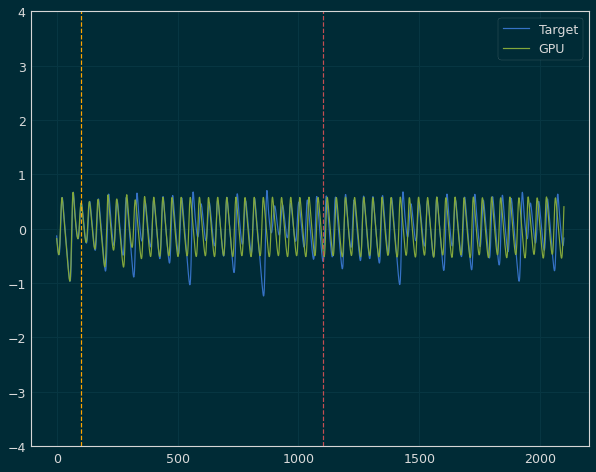

 Iter=13 a=0.571 sr=0.860 amp=1.642  ri=1.279 rr=0.086 loss=0.617968


Iter: 13 #### Diagnostic 0.617968   Time 4.26  Best 0.618 NRMSE 0.163 CD 0.455
Iter: 14 #### Diagnostic 1000.000000   Time 3.91  Best 0.618 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 4.06  Best 0.618 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 4.21  Best 0.618 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 4.01  Best 0.618 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 4.13  Best 0.618 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 4.23  Best 0.618 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 4.08  Best 0.618 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 4.20  Best 0.618 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 4.11  Best 0.618 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 4.16  Best 0.618 NRMSE 1000.000 CD nan
Iter: 24 #### Diagno

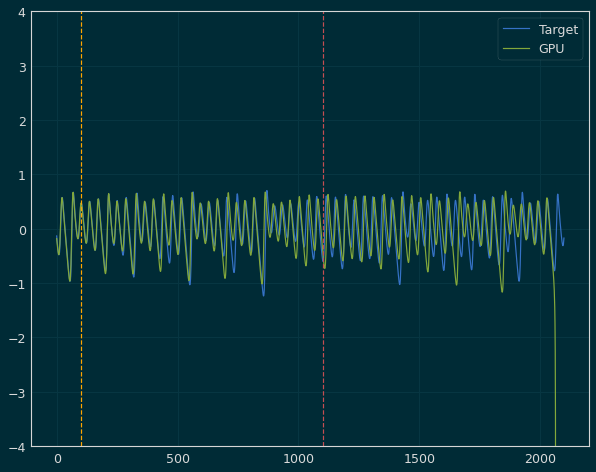

 Iter=76 a=0.623 sr=0.858 amp=1.408  ri=0.413 rr=1.844 loss=0.354263


Iter: 76 #### Diagnostic 0.354263   Time 4.53  Best 0.354 NRMSE 0.124 CD 0.230
Iter: 77 #### Diagnostic 1000.000000   Time 4.07  Best 0.354 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 4.03  Best 0.354 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 4.31  Best 0.354 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 4.16  Best 0.354 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1000.000000   Time 4.06  Best 0.354 NRMSE 1000.000 CD nan
Iter: 82 #### Diagnostic 0.710434   Time 4.09  Best 0.354 NRMSE 0.175 CD 0.535
Iter: 83 #### Diagnostic 1000.000000   Time 4.24  Best 0.354 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.000000   Time 4.04  Best 0.354 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 1000.000000   Time 4.17  Best 0.354 NRMSE 1000.000 CD nan
Iter: 86 #### Diagnostic 1000.000000   Time 4.10  Best 0.354 NRMSE 1000.000 CD nan
Iter: 87 #### Diagnostic

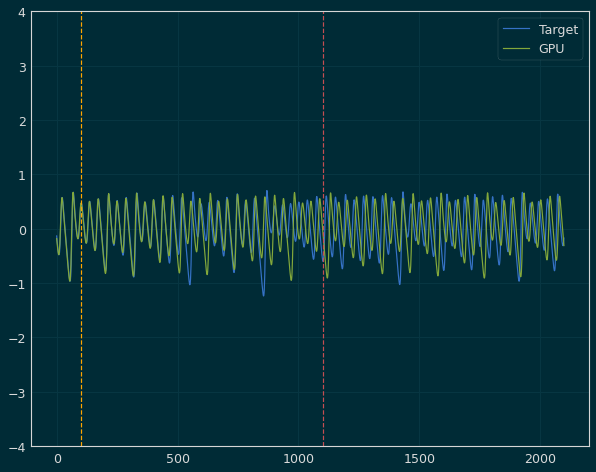

 Iter=53 a=0.620 sr=0.870 amp=1.677  ri=0.785 rr=1.810 loss=0.637296


Iter: 53 #### Diagnostic 0.637296   Time 4.65  Best 0.637 NRMSE 0.172 CD 0.465
Iter: 54 #### Diagnostic 1000.000000   Time 4.21  Best 0.637 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 4.52  Best 0.637 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 5.01  Best 0.637 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 4.60  Best 0.637 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 4.21  Best 0.637 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 4.39  Best 0.637 NRMSE 1000.000 CD 1.022
Iter: 60 #### Diagnostic 1000.000000   Time 4.23  Best 0.637 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 4.18  Best 0.637 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 1000.000000   Time 4.04  Best 0.637 NRMSE 1000.000 CD nan
Iter: 63 #### Diagnostic 0.638089   Time 3.97  Best 0.637 NRMSE 0.171 CD 0.467
Iter: 64 #### Diagnost

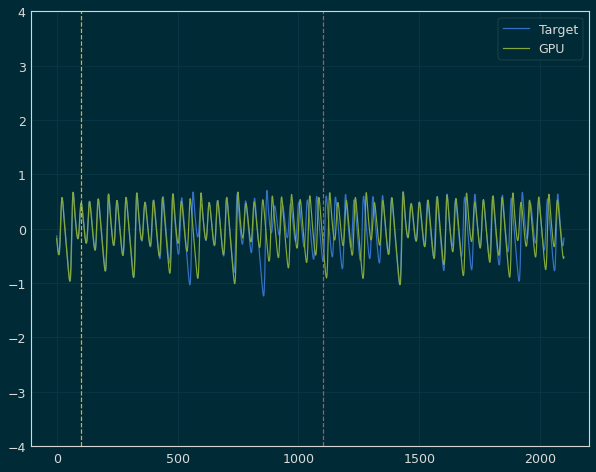

 Iter=75 a=0.655 sr=0.974 amp=1.598  ri=2.364 rr=0.519 loss=0.600020


Iter: 75 #### Diagnostic 0.600020   Time 4.81  Best 0.600 NRMSE 0.162 CD 0.438
Iter: 76 #### Diagnostic 1000.000000   Time 5.17  Best 0.600 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 4.33  Best 0.600 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 4.20  Best 0.600 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 4.04  Best 0.600 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 4.17  Best 0.600 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1000.000000   Time 4.08  Best 0.600 NRMSE 1000.000 CD nan
Iter: 82 #### Diagnostic 1000.000000   Time 4.23  Best 0.600 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 1000.000000   Time 4.02  Best 0.600 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.000000   Time 4.30  Best 0.600 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 1000.000000   Time 4.04  Best 0.600 NRMSE 1000.000 CD nan
Iter: 86 #### Diagno

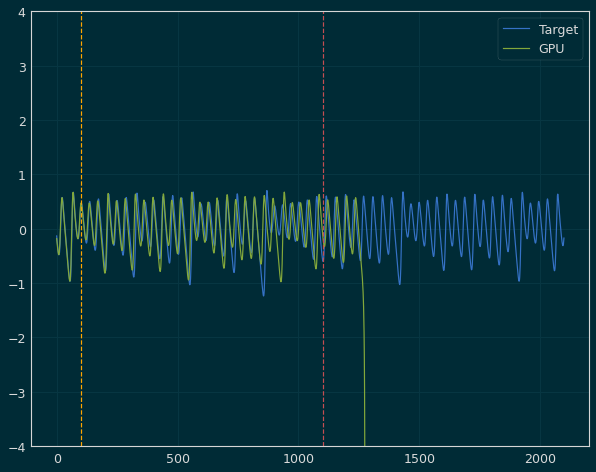

 Iter=21 a=0.580 sr=0.843 amp=1.636  ri=2.710 rr=0.936 loss=0.607557


Iter: 21 #### Diagnostic 0.607557   Time 4.51  Best 0.608 NRMSE 0.170 CD 0.438
Iter: 22 #### Diagnostic 1000.000000   Time 4.24  Best 0.608 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1.397684   Time 4.25  Best 0.608 NRMSE 0.423 CD 0.974
Iter: 24 #### Diagnostic 1000.000000   Time 3.97  Best 0.608 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 4.09  Best 0.608 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 3.96  Best 0.608 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 0.944207   Time 4.02  Best 0.608 NRMSE 0.201 CD 0.743
Iter: 28 #### Diagnostic 1000.000000   Time 4.04  Best 0.608 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 3.97  Best 0.608 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1.163845   Time 4.21  Best 0.608 NRMSE 0.200 CD 0.964
Iter: 31 #### Diagnostic 1000.000000   Time 4.16  Best 0.608 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.00

Iter: 11 #### Diagnostic 1.516123   Time 4.08  Best 1000.000 NRMSE 0.508 CD 1.008
Iter: 12 #### Diagnostic 1000.000000   Time 4.33  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 4.27  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 0.873555   Time 4.36  Best 1000.000 NRMSE 0.220 CD 0.654
Iter: 15 #### Diagnostic 1000.000000   Time 4.25  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1.202366   Time 5.23  Best 1000.000 NRMSE 0.202 CD 1.000
Iter: 17 #### Diagnostic 1000.000000   Time 4.59  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 4.07  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 4.60  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 4.21  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 3.95  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 3.93  Best 1000.000 NR

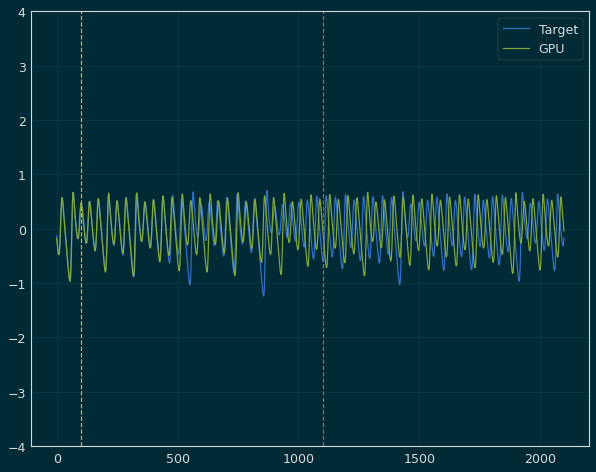

 Iter=68 a=0.648 sr=0.829 amp=1.640  ri=0.494 rr=1.119 loss=0.623848


Iter: 68 #### Diagnostic 0.623848   Time 4.59  Best 0.624 NRMSE 0.171 CD 0.453
Iter: 69 #### Diagnostic 1000.000000   Time 4.46  Best 0.624 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic 1000.000000   Time 4.29  Best 0.624 NRMSE 1000.000 CD nan
Iter: 71 #### Diagnostic 1000.000000   Time 4.32  Best 0.624 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1000.000000   Time 4.26  Best 0.624 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 1000.000000   Time 4.25  Best 0.624 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 1000.000000   Time 4.15  Best 0.624 NRMSE 1000.000 CD nan
Iter: 75 #### Diagnostic 0.875659   Time 4.20  Best 0.624 NRMSE 0.207 CD 0.668
Iter: 76 #### Diagnostic 1000.000000   Time 5.54  Best 0.624 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 4.61  Best 0.624 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 4.29  Best 0.624 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic

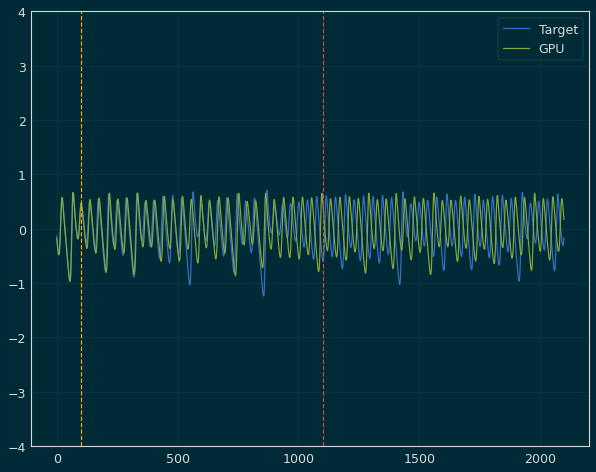

 Iter=21 a=0.636 sr=0.926 amp=1.495  ri=2.698 rr=2.856 loss=0.691644


Iter: 21 #### Diagnostic 0.691644   Time 4.45  Best 0.692 NRMSE 0.187 CD 0.505
Iter: 22 #### Diagnostic 1000.000000   Time 4.16  Best 0.692 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 4.13  Best 0.692 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 4.09  Best 0.692 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 4.66  Best 0.692 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 4.68  Best 0.692 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 4.10  Best 0.692 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 4.32  Best 0.692 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 4.19  Best 0.692 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 4.16  Best 0.692 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 4.17  Best 0.692 NRMSE 1000.000 CD nan
Iter: 32 #### Diagno

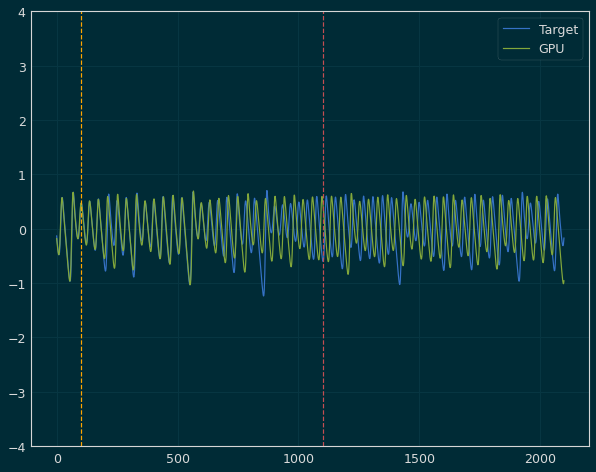

 Iter=6 a=0.571 sr=0.865 amp=1.643  ri=1.597 rr=1.699 loss=0.664289


Iter: 6 #### Diagnostic 0.664289   Time 4.38  Best 0.664 NRMSE 0.182 CD 0.482
Iter: 7 #### Diagnostic 1000.000000   Time 4.09  Best 0.664 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 0.769056   Time 4.17  Best 0.664 NRMSE 0.185 CD 0.584
Iter: 9 #### Diagnostic 1000.000000   Time 4.19  Best 0.664 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 4.04  Best 0.664 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 4.03  Best 0.664 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 3.98  Best 0.664 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 3.96  Best 0.664 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 4.03  Best 0.664 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1.519841   Time 4.09  Best 0.664 NRMSE 0.521 CD 0.999
Iter: 16 #### Diagnostic 1000.000000   Time 4.10  Best 0.664 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000

Iter: 3 #### Diagnostic 1000.000000   Time 3.89  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 3.94  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1.018517   Time 3.96  Best 1000.000 NRMSE 0.233 CD 0.785
Iter: 6 #### Diagnostic 0.872202   Time 5.36  Best 1000.000 NRMSE 0.209 CD 0.663
Iter: 7 #### Diagnostic 1.269248   Time 5.41  Best 1000.000 NRMSE 0.310 CD 0.959
Iter: 8 #### Diagnostic 1000.000000   Time 4.71  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1.127611   Time 3.92  Best 1000.000 NRMSE 0.191 CD 0.937
Iter: 10 #### Diagnostic 1000.000000   Time 3.99  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 4.08  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4.21  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 3.87  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 3.90  Best 1000.000 NRMSE 1000.00

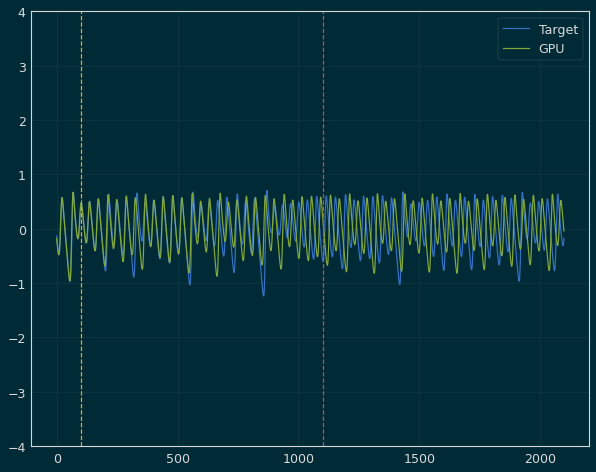

 Iter=16 a=0.599 sr=0.987 amp=1.683  ri=0.335 rr=0.781 loss=0.663703


Iter: 16 #### Diagnostic 0.663703   Time 5.31  Best 0.664 NRMSE 0.179 CD 0.484
Iter: 17 #### Diagnostic 1000.000000   Time 4.02  Best 0.664 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 3.95  Best 0.664 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1000.000000   Time 4.03  Best 0.664 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 4.04  Best 0.664 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 3.99  Best 0.664 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 0.890970   Time 3.93  Best 0.664 NRMSE 0.216 CD 0.675
Iter: 23 #### Diagnostic 1000.000000   Time 3.90  Best 0.664 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 3.86  Best 0.664 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1.150853   Time 3.85  Best 0.664 NRMSE 0.228 CD 0.923
Iter: 26 #### Diagnostic 1000.000000   Time 3.92  Best 0.664 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 100

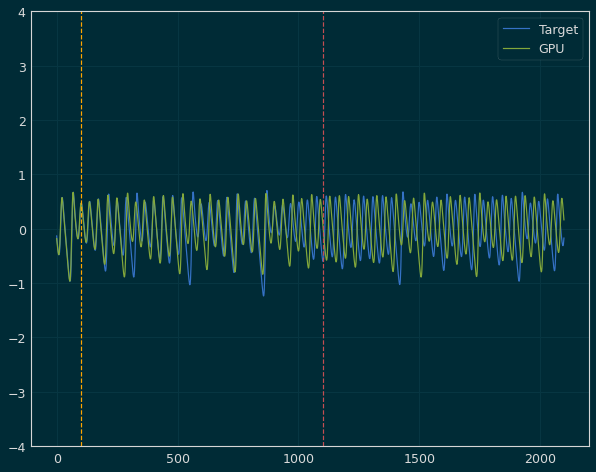

 Iter=43 a=0.596 sr=0.990 amp=1.513  ri=1.761 rr=1.170 loss=0.658640


Iter: 43 #### Diagnostic 0.658640   Time 4.32  Best 0.659 NRMSE 0.179 CD 0.480
Iter: 44 #### Diagnostic 1000.000000   Time 3.96  Best 0.659 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 1000.000000   Time 3.95  Best 0.659 NRMSE 1000.000 CD nan
Iter: 46 #### Diagnostic 1000.000000   Time 4.06  Best 0.659 NRMSE 1000.000 CD nan
Iter: 47 #### Diagnostic 1.523162   Time 3.96  Best 0.659 NRMSE 0.280 CD 1.243
Iter: 48 #### Diagnostic 1000.000000   Time 3.97  Best 0.659 NRMSE 1000.000 CD nan
Iter: 49 #### Diagnostic 1000.000000   Time 3.96  Best 0.659 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1000.000000   Time 4.12  Best 0.659 NRMSE 1000.000 CD nan
Iter: 51 #### Diagnostic 1000.000000   Time 3.86  Best 0.659 NRMSE 1000.000 CD nan
Iter: 52 #### Diagnostic 1000.000000   Time 4.00  Best 0.659 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 1000.000000   Time 4.04  Best 0.659 NRMSE 1000.000 CD nan
Iter: 54 #### Diagnostic

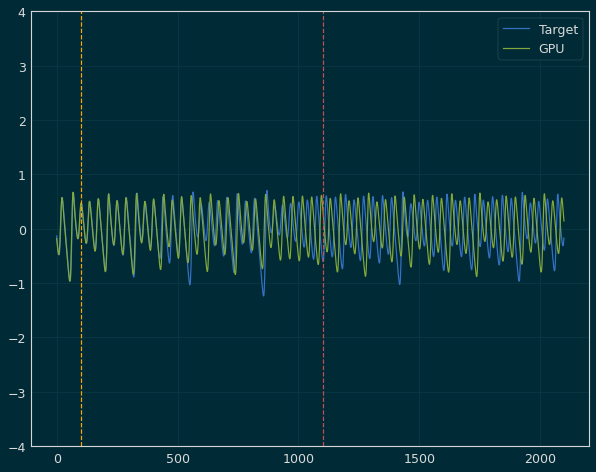

 Iter=89 a=0.627 sr=0.885 amp=1.416  ri=0.658 rr=1.688 loss=0.626077


Iter: 89 #### Diagnostic 0.626077   Time 5.00  Best 0.626 NRMSE 0.177 CD 0.450
Iter: 90 #### Diagnostic 1000.000000   Time 4.12  Best 0.626 NRMSE 1000.000 CD nan
Iter: 91 #### Diagnostic 1000.000000   Time 3.90  Best 0.626 NRMSE 1000.000 CD nan
Iter: 92 #### Diagnostic 1000.000000   Time 4.00  Best 0.626 NRMSE 1000.000 CD nan
Iter: 93 #### Diagnostic 1000.000000   Time 3.94  Best 0.626 NRMSE 1000.000 CD nan
Iter: 94 #### Diagnostic 1000.000000   Time 3.86  Best 0.626 NRMSE 1000.000 CD nan
Iter: 95 #### Diagnostic 1000.000000   Time 4.11  Best 0.626 NRMSE 1000.000 CD nan
Iter: 96 #### Diagnostic 1000.000000   Time 3.96  Best 0.626 NRMSE 1000.000 CD nan
Iter: 97 #### Diagnostic 1000.000000   Time 3.89  Best 0.626 NRMSE 1000.000 CD nan
Iter: 98 #### Diagnostic 1000.000000   Time 3.98  Best 0.626 NRMSE 1000.000 CD nan
Iter: 99 #### Diagnostic 1.460201   Time 3.95  Best 0.626 NRMSE 0.277 CD 1.184

Best result = 0.6260766

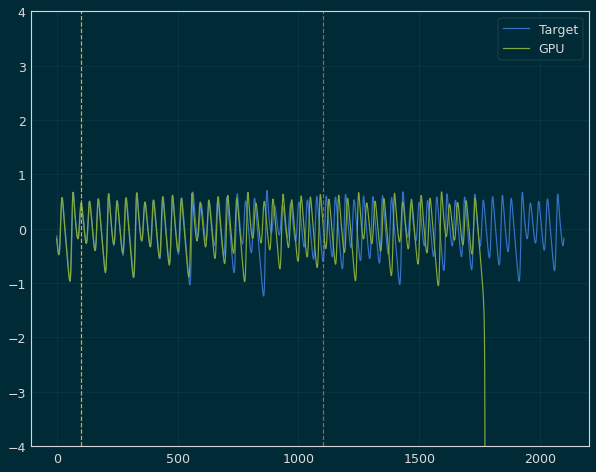

 Iter=34 a=0.616 sr=0.989 amp=1.406  ri=0.421 rr=1.777 loss=0.610443


Iter: 34 #### Diagnostic 0.610443   Time 5.00  Best 0.610 NRMSE 0.168 CD 0.442
Iter: 35 #### Diagnostic 0.782930   Time 3.96  Best 0.610 NRMSE 0.196 CD 0.587
Iter: 36 #### Diagnostic 0.651039   Time 3.98  Best 0.610 NRMSE 0.177 CD 0.474
Iter: 37 #### Diagnostic 1.485452   Time 3.88  Best 0.610 NRMSE 0.485 CD 1.000
Iter: 38 #### Diagnostic 0.769603   Time 4.37  Best 0.610 NRMSE 0.201 CD 0.569
Iter: 39 #### Diagnostic 1000.000000   Time 4.27  Best 0.610 NRMSE 1000.000 CD nan
Iter: 40 #### Diagnostic 0.873196   Time 4.16  Best 0.610 NRMSE 0.208 CD 0.665
Iter: 41 #### Diagnostic 1000.000000   Time 3.82  Best 0.610 NRMSE 1000.000 CD nan
Iter: 42 #### Diagnostic 1000.000000   Time 4.01  Best 0.610 NRMSE 1000.000 CD nan
Iter: 43 #### Diagnostic 1000.000000   Time 3.94  Best 0.610 NRMSE 1000.000 CD nan
Iter: 44 #### Diagnostic 1000.000000   Time 4.08  Best 0.610 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 1000.000000   T

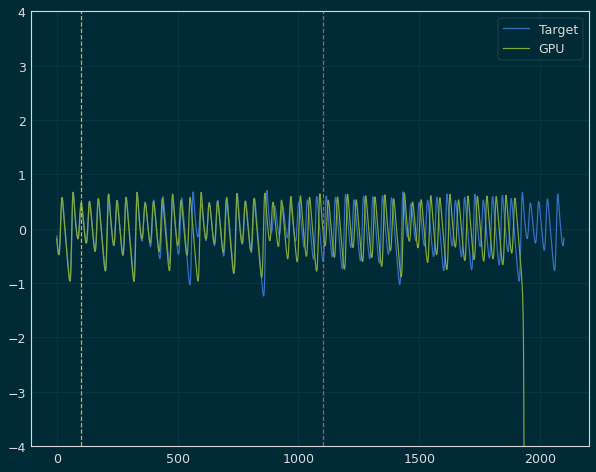

 Iter=68 a=0.564 sr=0.918 amp=1.579  ri=2.357 rr=0.678 loss=0.516327


Iter: 68 #### Diagnostic 0.516327   Time 4.52  Best 0.516 NRMSE 0.152 CD 0.364
Iter: 69 #### Diagnostic 1000.000000   Time 3.95  Best 0.516 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic 1000.000000   Time 3.91  Best 0.516 NRMSE 1000.000 CD nan
Iter: 71 #### Diagnostic 1000.000000   Time 3.86  Best 0.516 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1000.000000   Time 3.88  Best 0.516 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 1000.000000   Time 5.13  Best 0.516 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 0.721495   Time 5.58  Best 0.516 NRMSE 0.190 CD 0.532
Iter: 75 #### Diagnostic 1000.000000   Time 5.50  Best 0.516 NRMSE 1000.000 CD nan
Iter: 76 #### Diagnostic 0.675646   Time 5.32  Best 0.516 NRMSE 0.176 CD 0.499
Iter: 77 #### Diagnostic 1000.000000   Time 5.55  Best 0.516 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 5.60  Best 0.516 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 100

Iter: 56 #### Diagnostic 1000.000000   Time 3.97  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 4.11  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 4.31  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 4.15  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1000.000000   Time 4.54  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 4.37  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 1.194015   Time 4.07  Best 1000.000 NRMSE 0.231 CD 0.963
Iter: 63 #### Diagnostic 1000.000000   Time 3.97  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 64 #### Diagnostic 1000.000000   Time 4.39  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 65 #### Diagnostic 1000.000000   Time 4.26  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 66 #### Diagnostic 1000.000000   Time 4.05  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 1000.000000   Time 4.25  Best 100

Iter: 50 #### Diagnostic 1000.000000   Time 4.12  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 51 #### Diagnostic 1000.000000   Time 4.61  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 52 #### Diagnostic 1000.000000   Time 5.49  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 1.512670   Time 4.50  Best 1000.000 NRMSE 0.519 CD 0.993
Iter: 54 #### Diagnostic 1000.000000   Time 4.13  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 4.13  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 4.13  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 12.624450   Time 4.17  Best 1000.000 NRMSE 11.587 CD 1.037
Iter: 58 #### Diagnostic 1000.000000   Time 4.13  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 4.11  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 0.724018   Time 4.16  Best 1000.000 NRMSE 0.185 CD 0.539
Iter: 61 #### Diagnostic 1000.000000   Time 4.15  Best 1000.000 

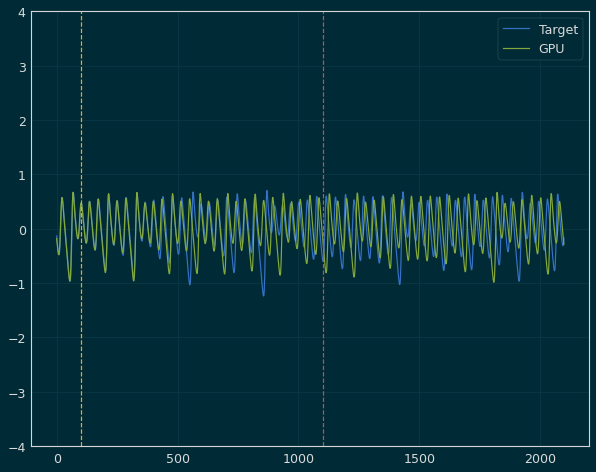

 Iter=1 a=0.553 sr=0.808 amp=1.474  ri=0.375 rr=2.780 loss=0.659825


Iter: 1 #### Diagnostic 0.659825   Time 4.40  Best 0.660 NRMSE 0.171 CD 0.488
Iter: 2 #### Diagnostic 1000.000000   Time 4.10  Best 0.660 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1.166618   Time 4.25  Best 0.660 NRMSE 0.243 CD 0.924
Iter: 4 #### Diagnostic 1000.000000   Time 4.13  Best 0.660 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 4.10  Best 0.660 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1000.000000   Time 3.99  Best 0.660 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 4.08  Best 0.660 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 0.906992   Time 4.16  Best 0.660 NRMSE 0.214 CD 0.693
Iter: 9 #### Diagnostic 1000.000000   Time 4.25  Best 0.660 NRMSE 2243.048 CD 0.989
Iter: 10 #### Diagnostic 1.493148   Time 4.13  Best 0.660 NRMSE 0.508 CD 0.985
Iter: 11 #### Diagnostic 1000.000000   Time 4.20  Best 0.660 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1.497077   Time

Iter: 0 #### Diagnostic 1000.000000   Time 4.29  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 1 #### Diagnostic 1.092300   Time 3.93  Best 1000.000 NRMSE 0.216 CD 0.876
Iter: 2 #### Diagnostic 1000.000000   Time 4.14  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1000.000000   Time 3.91  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 0.727673   Time 3.91  Best 1000.000 NRMSE 0.194 CD 0.534
Iter: 5 #### Diagnostic 1000.000000   Time 3.89  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 0.837452   Time 3.97  Best 1000.000 NRMSE 0.206 CD 0.632
Iter: 7 #### Diagnostic 1000.000000   Time 3.87  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 3.98  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 4.09  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 4.03  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 3.91  Best 1000.000 NRMSE 1000.0

Iter: 96 #### Diagnostic 1000.000000   Time 4.25  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 97 #### Diagnostic 1000.000000   Time 5.47  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 98 #### Diagnostic 0.921640   Time 5.58  Best 1000.000 NRMSE 0.220 CD 0.702
Iter: 99 #### Diagnostic 1000.000000   Time 5.70  Best 1000.000 NRMSE 1000.000 CD nan

Best result = 0.7097725154368313
a = 0.6550905142227162
sr = 0.9736236433882005
amp = 1.5983995504864286
ri = 2.363732916746111
rr = 0.5192904124541171
********** Size 100 -- Run 4 ***********
Iter: 0 #### Diagnostic 79.427544   Time 3.89  Best 1000.000 NRMSE 78.422 CD 1.006
Iter: 1 #### Diagnostic 1000.000000   Time 3.91  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 2 #### Diagnostic 1000.000000   Time 3.95  Best 1000.000 NRMSE 1000.000 CD nan


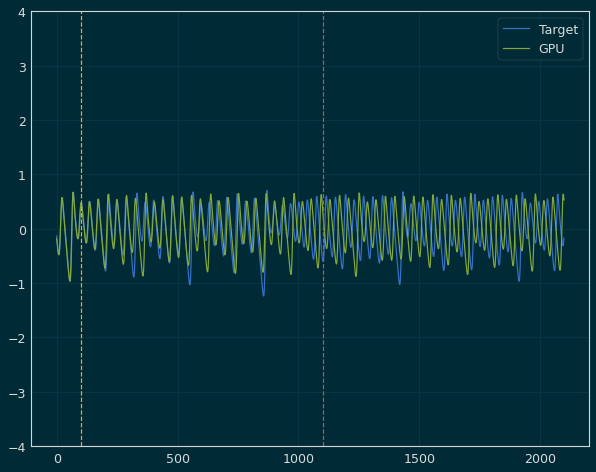

 Iter=3 a=0.629 sr=0.904 amp=1.597  ri=2.421 rr=0.157 loss=0.677177


Iter: 3 #### Diagnostic 0.677177   Time 4.98  Best 0.677 NRMSE 0.184 CD 0.493
Iter: 4 #### Diagnostic 1000.000000   Time 4.83  Best 0.677 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 4.07  Best 0.677 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 2.189604   Time 4.12  Best 0.677 NRMSE 1.276 CD 0.913
Iter: 7 #### Diagnostic 1000.000000   Time 3.86  Best 0.677 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 3.94  Best 0.677 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 3.95  Best 0.677 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 3.96  Best 0.677 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 4.07  Best 0.677 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4.01  Best 0.677 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 4.17  Best 0.677 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.00

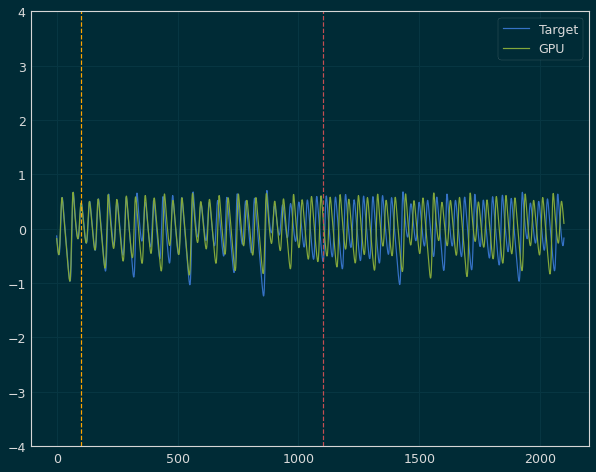

 Iter=62 a=0.552 sr=0.948 amp=1.553  ri=0.515 rr=0.914 loss=0.585531


Iter: 62 #### Diagnostic 0.585531   Time 4.24  Best 0.586 NRMSE 0.171 CD 0.414
Iter: 63 #### Diagnostic 1000.000000   Time 3.85  Best 0.586 NRMSE 1000.000 CD nan
Iter: 64 #### Diagnostic 1000.000000   Time 3.85  Best 0.586 NRMSE 1000.000 CD nan
Iter: 65 #### Diagnostic 1000.000000   Time 4.65  Best 0.586 NRMSE 1000.000 CD nan
Iter: 66 #### Diagnostic 1000.000000   Time 5.48  Best 0.586 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 1000.000000   Time 4.89  Best 0.586 NRMSE 1000.000 CD nan
Iter: 68 #### Diagnostic 1000.000000   Time 4.09  Best 0.586 NRMSE 1000.000 CD nan
Iter: 69 #### Diagnostic 1000.000000   Time 3.93  Best 0.586 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic 1000.000000   Time 3.98  Best 0.586 NRMSE 1000.000 CD nan
Iter: 71 #### Diagnostic 1000.000000   Time 4.05  Best 0.586 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1000.000000   Time 4.01  Best 0.586 NRMSE 1000.000 CD nan
Iter: 73 #### Diagno

Iter: 50 #### Diagnostic 1.152173   Time 3.85  Best 1000.000 NRMSE 0.218 CD 0.935
Iter: 51 #### Diagnostic 1000.000000   Time 3.90  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 52 #### Diagnostic 1000.000000   Time 3.83  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 1000.000000   Time 3.89  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 54 #### Diagnostic 1000.000000   Time 3.90  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 3.93  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1.126572   Time 4.05  Best 1000.000 NRMSE 0.238 CD 0.888
Iter: 57 #### Diagnostic 2.106848   Time 3.79  Best 1000.000 NRMSE 0.998 CD 1.109
Iter: 58 #### Diagnostic 1.051554   Time 3.85  Best 1000.000 NRMSE 0.238 CD 0.814
Iter: 59 #### Diagnostic 1000.000000   Time 3.85  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1000.000000   Time 3.82  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 3.82  Best 1000.000 NRMSE 

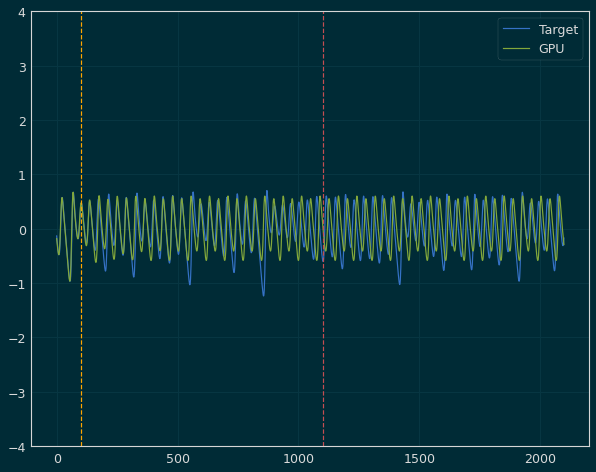

 Iter=81 a=0.608 sr=0.929 amp=1.518  ri=3.814 rr=0.440 loss=0.634880


Iter: 81 #### Diagnostic 0.634880   Time 5.76  Best 0.635 NRMSE 0.171 CD 0.464
Iter: 82 #### Diagnostic 1000.000000   Time 3.87  Best 0.635 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 1000.000000   Time 4.71  Best 0.635 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.000000   Time 4.11  Best 0.635 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 1000.000000   Time 3.82  Best 0.635 NRMSE 1000.000 CD nan
Iter: 86 #### Diagnostic 1.178822   Time 3.86  Best 0.635 NRMSE 0.211 CD 0.968
Iter: 87 #### Diagnostic 1000.000000   Time 3.92  Best 0.635 NRMSE 1000.000 CD nan
Iter: 88 #### Diagnostic 1000.000000   Time 4.02  Best 0.635 NRMSE 1000.000 CD nan
Iter: 89 #### Diagnostic 1000.000000   Time 4.01  Best 0.635 NRMSE 1000.000 CD nan
Iter: 90 #### Diagnostic 1.481451   Time 4.04  Best 0.635 NRMSE 0.343 CD 1.139
Iter: 91 #### Diagnostic 1000.000000   Time 3.99  Best 0.635 NRMSE 1000.000 CD nan
Iter: 92 #### Diagnostic 1.0

Iter: 76 #### Diagnostic 1000.000000   Time 3.92  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 3.89  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 4.09  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 5.44  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 4.18  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1000.000000   Time 4.00  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 82 #### Diagnostic 1000.000000   Time 3.99  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 0.792367   Time 4.20  Best 1000.000 NRMSE 0.201 CD 0.592
Iter: 84 #### Diagnostic 1000.000000   Time 4.20  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 1000.000000   Time 4.14  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 86 #### Diagnostic 1.081609   Time 4.08  Best 1000.000 NRMSE 0.236 CD 0.845
Iter: 87 #### Diagnostic 1000.000000   Time 4.11  Best 1000.00

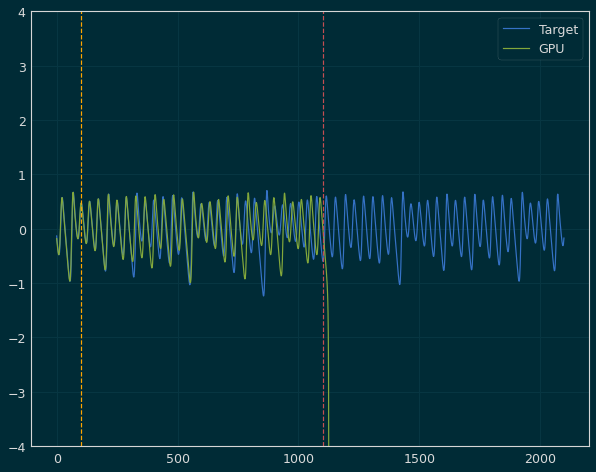

 Iter=31 a=0.652 sr=0.925 amp=1.699  ri=0.639 rr=3.278 loss=0.691393


Iter: 31 #### Diagnostic 0.691393   Time 4.41  Best 0.691 NRMSE 0.183 CD 0.508
Iter: 32 #### Diagnostic 1000.000000   Time 4.09  Best 0.691 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 4.06  Best 0.691 NRMSE 1000.000 CD nan
Iter: 34 #### Diagnostic 1000.000000   Time 3.94  Best 0.691 NRMSE 1000.000 CD nan
Iter: 35 #### Diagnostic 0.941829   Time 3.95  Best 0.691 NRMSE 0.219 CD 0.723
Iter: 36 #### Diagnostic 1000.000000   Time 3.90  Best 0.691 NRMSE 1000.000 CD nan
Iter: 37 #### Diagnostic 1000.000000   Time 3.91  Best 0.691 NRMSE 1000.000 CD nan
Iter: 38 #### Diagnostic 1000.000000   Time 4.02  Best 0.691 NRMSE 1000.000 CD nan
Iter: 39 #### Diagnostic 1000.000000   Time 4.04  Best 0.691 NRMSE 1000.000 CD nan
Iter: 40 #### Diagnostic 1000.000000   Time 4.00  Best 0.691 NRMSE 1000.000 CD nan
Iter: 41 #### Diagnostic 1000.000000   Time 4.07  Best 0.691 NRMSE 1000.000 CD nan
Iter: 42 #### Diagnostic

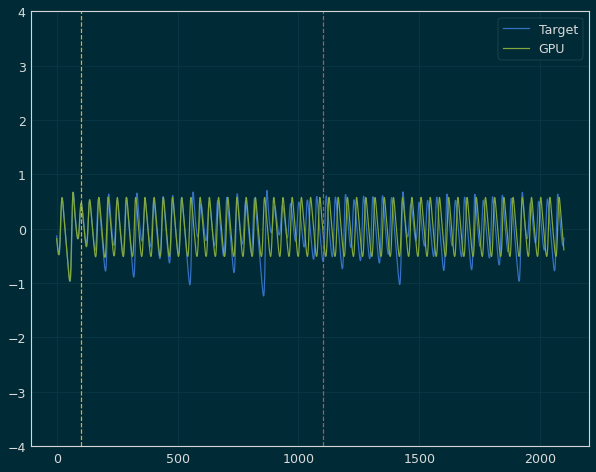

 Iter=8 a=0.665 sr=0.853 amp=1.605  ri=1.879 rr=2.340 loss=0.622633


Iter: 8 #### Diagnostic 0.622633   Time 4.38  Best 0.623 NRMSE 0.168 CD 0.455
Iter: 9 #### Diagnostic 1000.000000   Time 4.02  Best 0.623 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 4.06  Best 0.623 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 3.92  Best 0.623 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4.00  Best 0.623 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 4.21  Best 0.623 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 4.08  Best 0.623 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 4.03  Best 0.623 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1.495760   Time 4.11  Best 0.623 NRMSE 0.510 CD 0.986
Iter: 17 #### Diagnostic 1000.000000   Time 4.14  Best 0.623 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 0.722434   Time 4.07  Best 0.623 NRMSE 0.188 CD 0.534
Iter: 19 #### Diagnostic 1.1534

Iter: 5 #### Diagnostic 1000.000000   Time 4.06  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1000.000000   Time 4.05  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1.166783   Time 4.13  Best 1000.000 NRMSE 0.229 CD 0.938
Iter: 8 #### Diagnostic 1.053108   Time 4.18  Best 1000.000 NRMSE 0.227 CD 0.826
Iter: 9 #### Diagnostic 1000.000000   Time 4.13  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1000.000000   Time 4.02  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1000.000000   Time 3.91  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1.505768   Time 4.10  Best 1000.000 NRMSE 0.517 CD 0.988
Iter: 13 #### Diagnostic 1.219688   Time 4.09  Best 1000.000 NRMSE 0.220 CD 1.000
Iter: 14 #### Diagnostic 1000.000000   Time 3.95  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 3.98  Best 1000.000 NRMSE 1000.000 CD nan


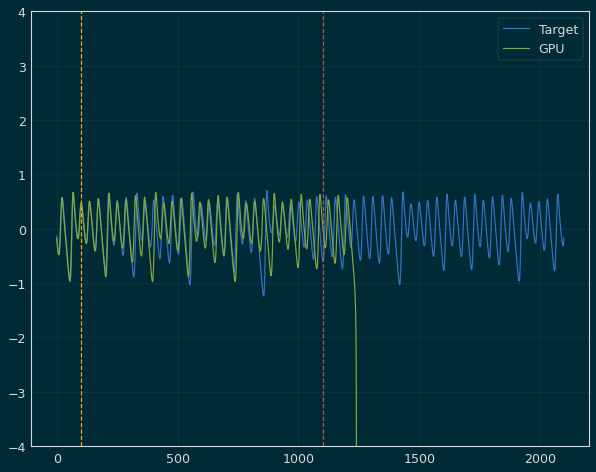

 Iter=16 a=0.580 sr=0.921 amp=1.630  ri=0.634 rr=0.776 loss=0.682605


Iter: 16 #### Diagnostic 0.682605   Time 4.30  Best 0.683 NRMSE 0.179 CD 0.504
Iter: 17 #### Diagnostic 0.713600   Time 4.10  Best 0.683 NRMSE 0.166 CD 0.548
Iter: 18 #### Diagnostic 1000.000000   Time 4.08  Best 0.683 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1.185658   Time 4.07  Best 0.683 NRMSE 0.235 CD 0.950
Iter: 20 #### Diagnostic 0.787649   Time 4.11  Best 0.683 NRMSE 0.200 CD 0.588
Iter: 21 #### Diagnostic 1000.000000   Time 4.13  Best 0.683 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 4.13  Best 0.683 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 3.90  Best 0.683 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 4.00  Best 0.683 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 3.98  Best 0.683 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 4.09  Best 0.683 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.00

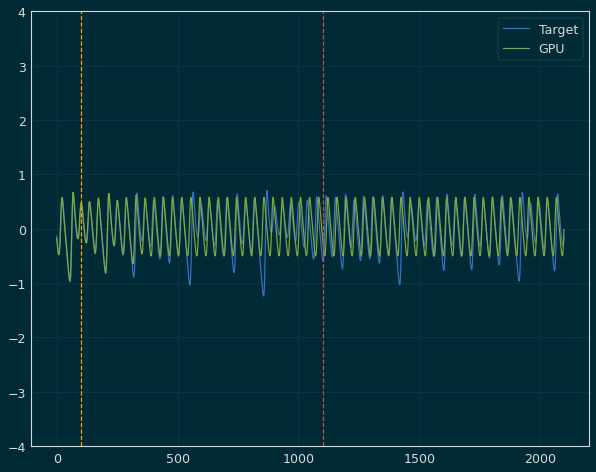

 Iter=70 a=0.567 sr=0.997 amp=1.509  ri=2.479 rr=0.799 loss=0.529364


Iter: 70 #### Diagnostic 0.529364   Time 4.85  Best 0.529 NRMSE 0.151 CD 0.379
Iter: 71 #### Diagnostic 1000.000000   Time 4.08  Best 0.529 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1.085474   Time 4.13  Best 0.529 NRMSE 0.248 CD 0.838
Iter: 73 #### Diagnostic 1000.000000   Time 4.22  Best 0.529 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 0.802451   Time 4.08  Best 0.529 NRMSE 0.200 CD 0.603
Iter: 75 #### Diagnostic 1000.000000   Time 4.28  Best 0.529 NRMSE 1000.000 CD nan
Iter: 76 #### Diagnostic 1000.000000   Time 4.30  Best 0.529 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 4.39  Best 0.529 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 0.798972   Time 4.31  Best 0.529 NRMSE 0.198 CD 0.601
Iter: 79 #### Diagnostic 1000.000000   Time 4.07  Best 0.529 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 3.651492   Time 4.04  Best 0.529 NRMSE 2.770 CD 0.882
Iter: 81 #### Diagnostic 1000.000000

Iter: 58 #### Diagnostic 1.170626   Time 4.36  Best 1000.000 NRMSE 0.203 CD 0.967
Iter: 59 #### Diagnostic 1000.000000   Time 4.11  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1000.000000   Time 4.30  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1.100845   Time 4.25  Best 1000.000 NRMSE 0.181 CD 0.920
Iter: 62 #### Diagnostic 1000.000000   Time 4.19  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 63 #### Diagnostic 1000.000000   Time 4.70  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 64 #### Diagnostic 1000.000000   Time 4.78  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 65 #### Diagnostic 1000.000000   Time 4.20  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 66 #### Diagnostic 1000.000000   Time 4.60  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 1000.000000   Time 4.36  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 68 #### Diagnostic 1000.000000   Time 4.17  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 69 #### Diagnostic 1000.000000   Time 4.52  Best 1000.00

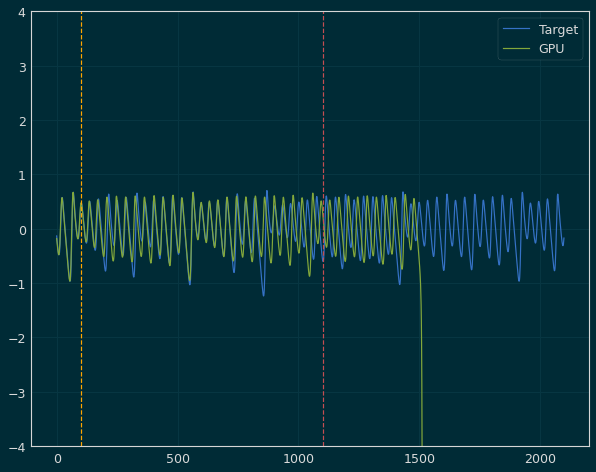

 Iter=9 a=0.637 sr=0.986 amp=1.567  ri=2.738 rr=0.754 loss=0.645397


Iter: 9 #### Diagnostic 0.645397   Time 5.26  Best 0.645 NRMSE 0.176 CD 0.470
Iter: 10 #### Diagnostic 1000.000000   Time 4.21  Best 0.645 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 1.210726   Time 4.49  Best 0.645 NRMSE 0.260 CD 0.950
Iter: 12 #### Diagnostic 1000.000000   Time 4.87  Best 0.645 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 4.42  Best 0.645 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 4.19  Best 0.645 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 0.778510   Time 4.27  Best 0.645 NRMSE 0.198 CD 0.581
Iter: 16 #### Diagnostic 1000.000000   Time 4.11  Best 0.645 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 4.36  Best 0.645 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 0.668492   Time 4.25  Best 0.645 NRMSE 0.175 CD 0.494
Iter: 19 #### Diagnostic 1000.000000   Time 4.27  Best 0.645 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.0000

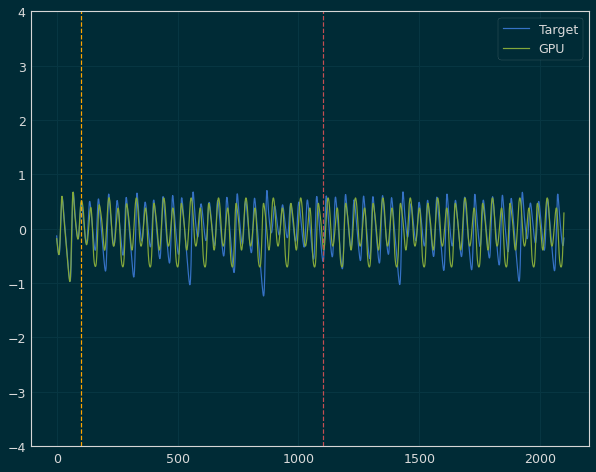

 Iter=26 a=0.560 sr=0.847 amp=1.660  ri=2.085 rr=3.241 loss=0.605645


Iter: 26 #### Diagnostic 0.605645   Time 4.59  Best 0.606 NRMSE 0.156 CD 0.449
Iter: 27 #### Diagnostic 1000.000000   Time 4.47  Best 0.606 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 4.23  Best 0.606 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 4.19  Best 0.606 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1.081434   Time 4.22  Best 0.606 NRMSE 0.197 CD 0.885
Iter: 31 #### Diagnostic 1.174931   Time 4.53  Best 0.606 NRMSE 0.193 CD 0.982
Iter: 32 #### Diagnostic 1000.000000   Time 4.16  Best 0.606 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 4.28  Best 0.606 NRMSE 1000.000 CD nan
Iter: 34 #### Diagnostic 1000.000000   Time 4.49  Best 0.606 NRMSE 1000.000 CD nan
Iter: 35 #### Diagnostic 1000.000000   Time 5.97  Best 0.606 NRMSE 1000.000 CD nan
Iter: 36 #### Diagnostic 1000.000000   Time 4.60  Best 0.606 NRMSE 1000.000 CD nan
Iter: 37 #### Diagnostic 2.9

Iter: 23 #### Diagnostic 1000.000000   Time 4.13  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 4.53  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 4.15  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1000.000000   Time 4.36  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 4.48  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 4.98  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 0.778926   Time 4.81  Best 1000.000 NRMSE 0.195 CD 0.584
Iter: 30 #### Diagnostic 1000.000000   Time 4.48  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 0.727136   Time 4.61  Best 1000.000 NRMSE 0.189 CD 0.538
Iter: 32 #### Diagnostic 1000.000000   Time 4.61  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 0.834549   Time 4.12  Best 1000.000 NRMSE 0.207 CD 0.627
Iter: 34 #### Diagnostic 1000.000000   Time 4.31  Best 1000.000 NR

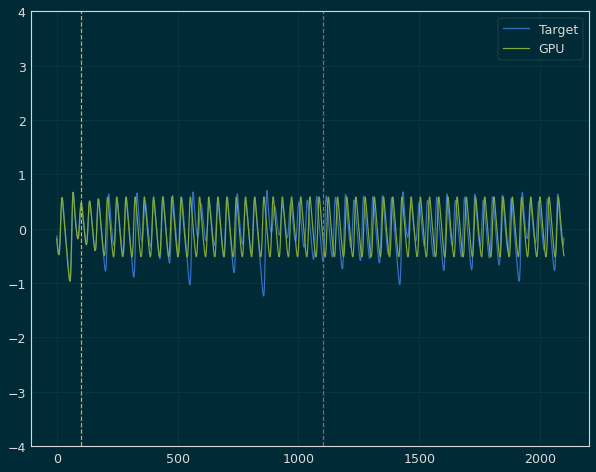

 Iter=1 a=0.668 sr=0.895 amp=1.586  ri=1.099 rr=2.240 loss=0.665453


Iter: 1 #### Diagnostic 0.665453   Time 4.60  Best 0.665 NRMSE 0.173 CD 0.492
Iter: 2 #### Diagnostic 1000.000000   Time 4.77  Best 0.665 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1000.000000   Time 4.61  Best 0.665 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 4.51  Best 0.665 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1.541235   Time 4.57  Best 0.665 NRMSE 0.295 CD 1.246
Iter: 6 #### Diagnostic 1000.000000   Time 4.25  Best 0.665 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 4.28  Best 0.665 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 4.17  Best 0.665 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 4.41  Best 0.665 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 0.802339   Time 4.73  Best 0.665 NRMSE 0.203 CD 0.599
Iter: 11 #### Diagnostic 1000.000000   Time 4.53  Best 0.665 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000  


Best result = 0.6654528378556065
a = 0.6680771350820985
sr = 0.8948102389519617
amp = 1.5856165777218592
ri = 1.099237883840025
rr = 2.24029888077644
********** Size 50 -- Run 4 ***********
Iter: 0 #### Diagnostic 1.292726   Time 4.48  Best 1000.000 NRMSE 0.311 CD 0.981
Iter: 1 #### Diagnostic 0.803207   Time 4.40  Best 1000.000 NRMSE 0.198 CD 0.606
Iter: 2 #### Diagnostic 1000.000000   Time 4.21  Best 1000.000 NRMSE 1000.000 CD nan


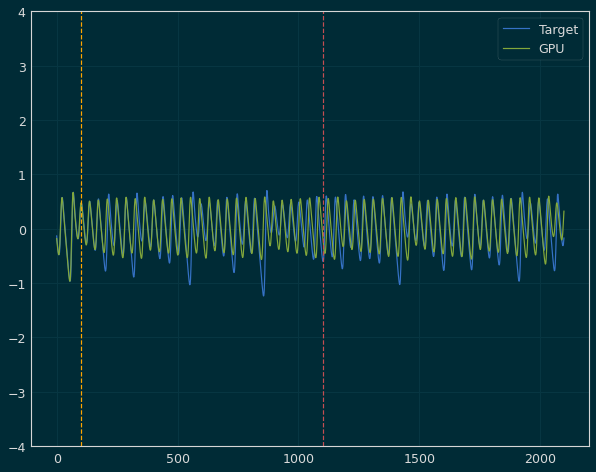

 Iter=3 a=0.629 sr=0.904 amp=1.597  ri=2.421 rr=0.157 loss=0.593351


Iter: 3 #### Diagnostic 0.593351   Time 4.69  Best 0.593 NRMSE 0.159 CD 0.434
Iter: 4 #### Diagnostic 1.221409   Time 4.59  Best 0.593 NRMSE 0.212 CD 1.009
Iter: 5 #### Diagnostic 1000.000000   Time 4.47  Best 0.593 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1.762876   Time 4.35  Best 0.593 NRMSE 0.814 CD 0.949
Iter: 7 #### Diagnostic 1000.000000   Time 4.23  Best 0.593 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 4.25  Best 0.593 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1.149307   Time 4.23  Best 0.593 NRMSE 0.243 CD 0.906
Iter: 10 #### Diagnostic 1.073221   Time 4.31  Best 0.593 NRMSE 0.236 CD 0.837
Iter: 11 #### Diagnostic 1000.000000   Time 4.47  Best 0.593 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4.22  Best 0.593 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1.180063   Time 4.42  Best 0.593 NRMSE 0.285 CD 0.895
Iter: 14 #### Diagnostic 1000.000000   Time 4.23

Iter: 0 #### Diagnostic 1000.000000   Time 4.35  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 1 #### Diagnostic 0.937015   Time 4.70  Best 1000.000 NRMSE 0.263 CD 0.674
Iter: 2 #### Diagnostic 1000.000000   Time 4.39  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1000.000000   Time 4.32  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 4.31  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 4.50  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 0.757186   Time 4.37  Best 1000.000 NRMSE 0.196 CD 0.561
Iter: 7 #### Diagnostic 1000.000000   Time 4.30  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1.269022   Time 4.85  Best 1000.000 NRMSE 0.224 CD 1.045
Iter: 9 #### Diagnostic 1000.000000   Time 4.25  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1.265871   Time 4.14  Best 1000.000 NRMSE 0.277 CD 0.989
Iter: 11 #### Diagnostic 1000.000000   Time 4.40  Best 1000.000 NRMSE 1000.000 C

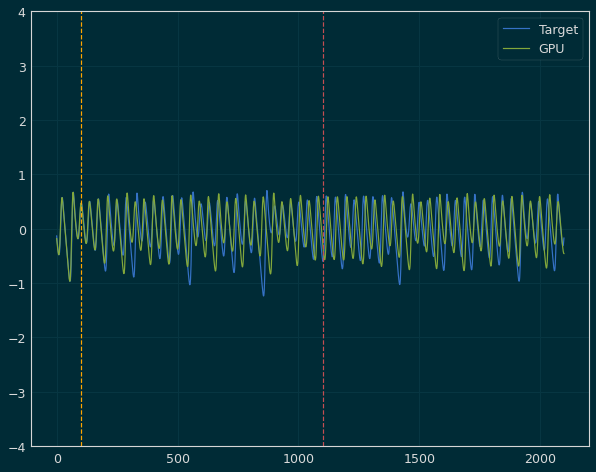

 Iter=16 a=0.608 sr=0.886 amp=1.565  ri=1.583 rr=1.638 loss=0.690242


Iter: 16 #### Diagnostic 0.690242   Time 4.60  Best 0.690 NRMSE 0.175 CD 0.515
Iter: 17 #### Diagnostic 1000.000000   Time 4.57  Best 0.690 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 0.992133   Time 4.30  Best 0.690 NRMSE 0.231 CD 0.761
Iter: 19 #### Diagnostic 12.654045   Time 4.55  Best 0.690 NRMSE 11.678 CD 0.976
Iter: 20 #### Diagnostic 1000.000000   Time 4.20  Best 0.690 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 4.31  Best 0.690 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 4.30  Best 0.690 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 4.21  Best 0.690 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1.528649   Time 4.50  Best 0.690 NRMSE 0.529 CD 1.000
Iter: 25 #### Diagnostic 1000.000000   Time 4.56  Best 0.690 NRMSE 1000.000 CD nan
Iter: 26 #### Diagnostic 1.387064   Time 4.20  Best 0.690 NRMSE 0.277 CD 1.110
Iter: 27 #### Diagnostic 1000.0000

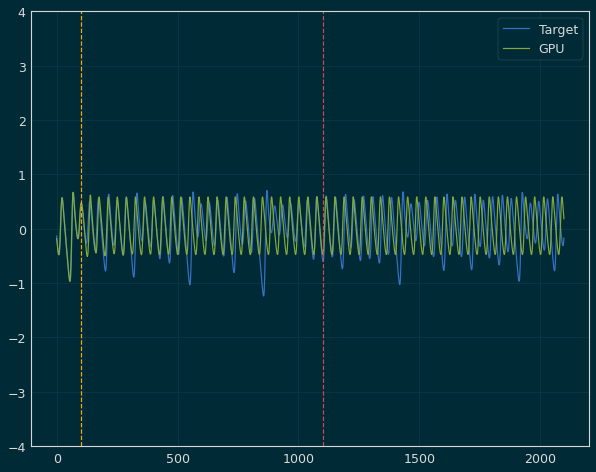

 Iter=30 a=0.555 sr=0.872 amp=1.421  ri=2.895 rr=0.142 loss=0.684248


Iter: 30 #### Diagnostic 0.684248   Time 4.79  Best 0.684 NRMSE 0.174 CD 0.510
Iter: 31 #### Diagnostic 1000.000000   Time 4.35  Best 0.684 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 4.24  Best 0.684 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1.166506   Time 4.56  Best 0.684 NRMSE 0.214 CD 0.953
Iter: 34 #### Diagnostic 1000.000000   Time 4.85  Best 0.684 NRMSE 1000.000 CD nan
Iter: 35 #### Diagnostic 1000.000000   Time 4.76  Best 0.684 NRMSE 1000.000 CD nan
Iter: 36 #### Diagnostic 1000.000000   Time 4.27  Best 0.684 NRMSE 1000.000 CD nan
Iter: 37 #### Diagnostic 1000.000000   Time 4.42  Best 0.684 NRMSE 1000.000 CD nan
Iter: 38 #### Diagnostic 1000.000000   Time 4.48  Best 0.684 NRMSE 1000.000 CD nan


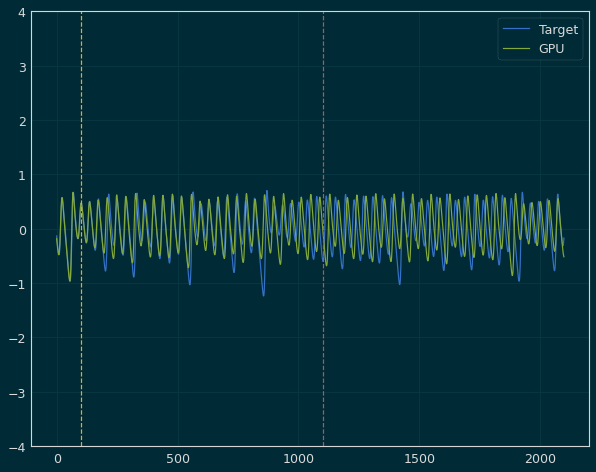

 Iter=39 a=0.567 sr=0.862 amp=1.550  ri=2.874 rr=2.055 loss=0.618160


Iter: 39 #### Diagnostic 0.618160   Time 5.03  Best 0.618 NRMSE 0.171 CD 0.447
Iter: 40 #### Diagnostic 1000.000000   Time 4.25  Best 0.618 NRMSE 1000.000 CD nan
Iter: 41 #### Diagnostic 0.848330   Time 4.16  Best 0.618 NRMSE 0.210 CD 0.638
Iter: 42 #### Diagnostic 1000.000000   Time 4.36  Best 0.618 NRMSE 1000.000 CD nan
Iter: 43 #### Diagnostic 1000.000000   Time 4.11  Best 0.618 NRMSE 1000.000 CD nan
Iter: 44 #### Diagnostic 1000.000000   Time 4.40  Best 0.618 NRMSE 1000.000 CD nan
Iter: 45 #### Diagnostic 0.809705   Time 4.15  Best 0.618 NRMSE 0.168 CD 0.641
Iter: 46 #### Diagnostic 1000.000000   Time 4.31  Best 0.618 NRMSE 1000.000 CD nan
Iter: 47 #### Diagnostic 1.484615   Time 4.11  Best 0.618 NRMSE 0.494 CD 0.991
Iter: 48 #### Diagnostic 1.484781   Time 4.24  Best 0.618 NRMSE 0.491 CD 0.994
Iter: 49 #### Diagnostic 1000.000000   Time 4.33  Best 0.618 NRMSE 1000.000 CD nan
Iter: 50 #### Diagnostic 1.134047   

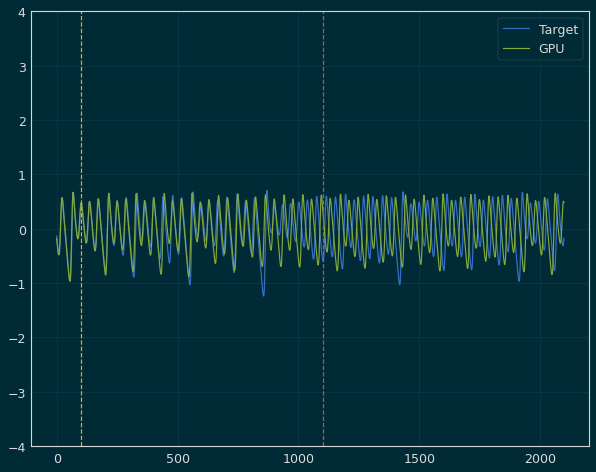

 Iter=1 a=0.560 sr=0.925 amp=1.589  ri=0.517 rr=1.224 loss=0.566034


Iter: 1 #### Diagnostic 0.566034   Time 4.67  Best 0.566 NRMSE 0.167 CD 0.399
Iter: 2 #### Diagnostic 10.241516   Time 4.29  Best 0.566 NRMSE 9.243 CD 0.999
Iter: 3 #### Diagnostic 1000.000000   Time 4.33  Best 0.566 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 4.40  Best 0.566 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1.507628   Time 4.26  Best 0.566 NRMSE 0.508 CD 0.999
Iter: 6 #### Diagnostic 1000.000000   Time 5.02  Best 0.566 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 4.58  Best 0.566 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1.368470   Time 4.60  Best 0.566 NRMSE 0.242 CD 1.126
Iter: 9 #### Diagnostic 1000.000000   Time 4.23  Best 0.566 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 0.977810   Time 4.33  Best 0.566 NRMSE 0.209 CD 0.769
Iter: 11 #### Diagnostic 1000.000000   Time 4.43  Best 0.566 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 1000.000000   Time 4

Iter: 0 #### Diagnostic 1000.000000   Time 4.30  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 1 #### Diagnostic 1000.000000   Time 4.63  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 2 #### Diagnostic 0.725548   Time 5.06  Best 1000.000 NRMSE 0.186 CD 0.539


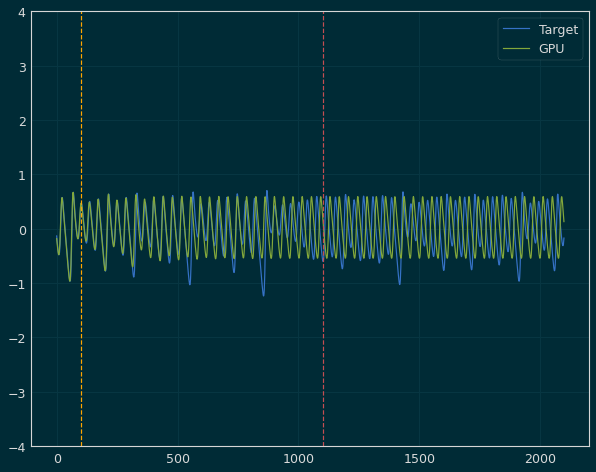

 Iter=3 a=0.687 sr=0.953 amp=1.692  ri=1.610 rr=2.212 loss=0.658994


Iter: 3 #### Diagnostic 0.658994   Time 5.19  Best 0.659 NRMSE 0.178 CD 0.481
Iter: 4 #### Diagnostic 1000.000000   Time 4.43  Best 0.659 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 4.19  Best 0.659 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 0.818932   Time 4.50  Best 0.659 NRMSE 0.206 CD 0.613
Iter: 7 #### Diagnostic 1000.000000   Time 4.39  Best 0.659 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 0.771012   Time 4.62  Best 0.659 NRMSE 0.195 CD 0.576
Iter: 9 #### Diagnostic 1000.000000   Time 4.51  Best 0.659 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 1.175274   Time 4.39  Best 0.659 NRMSE 0.195 CD 0.981
Iter: 11 #### Diagnostic 1.521956   Time 4.11  Best 0.659 NRMSE 0.523 CD 0.999
Iter: 12 #### Diagnostic 2.017081   Time 4.37  Best 0.659 NRMSE 1.024 CD 0.993
Iter: 13 #### Diagnostic 1000.000000   Time 4.27  Best 0.659 NRMSE 36574.645 CD 0.976
Iter: 14 #### Diagnostic 1.521514   Time 4.21

Iter: 0 #### Diagnostic 1000.000000   Time 4.16  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 1 #### Diagnostic 1000.000000   Time 4.32  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 2 #### Diagnostic 1000.000000   Time 4.21  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1000.000000   Time 4.21  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 4 #### Diagnostic 1000.000000   Time 4.13  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 98.927143   Time 4.22  Best 1000.000 NRMSE 97.953 CD 0.974
Iter: 6 #### Diagnostic 1000.000000   Time 4.94  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 4.24  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 4.40  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 1000.000000   Time 4.24  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 10 #### Diagnostic 0.886290   Time 4.60  Best 1000.000 NRMSE 0.215 CD 0.672
Iter: 11 #### Diagnostic 1000.000000   Time 4.17  Best 1000.000 NRMSE 

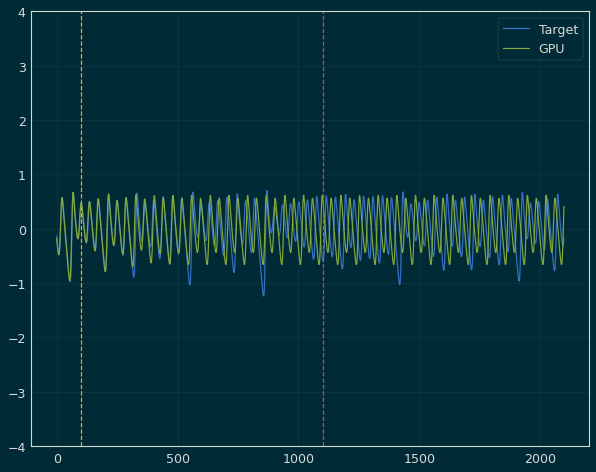

 Iter=20 a=0.626 sr=0.825 amp=1.425  ri=1.603 rr=3.943 loss=0.698236


Iter: 20 #### Diagnostic 0.698236   Time 4.50  Best 0.698 NRMSE 0.188 CD 0.510
Iter: 21 #### Diagnostic 1000.000000   Time 4.32  Best 0.698 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 0.898365   Time 4.20  Best 0.698 NRMSE 0.218 CD 0.681
Iter: 23 #### Diagnostic 1000.000000   Time 4.27  Best 0.698 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 4.14  Best 0.698 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1000.000000   Time 4.28  Best 0.698 NRMSE 1000.000 CD 0.979
Iter: 26 #### Diagnostic 1000.000000   Time 4.28  Best 0.698 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 4.10  Best 0.698 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 4.55  Best 0.698 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 4.41  Best 0.698 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 4.08  Best 0.698 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnost

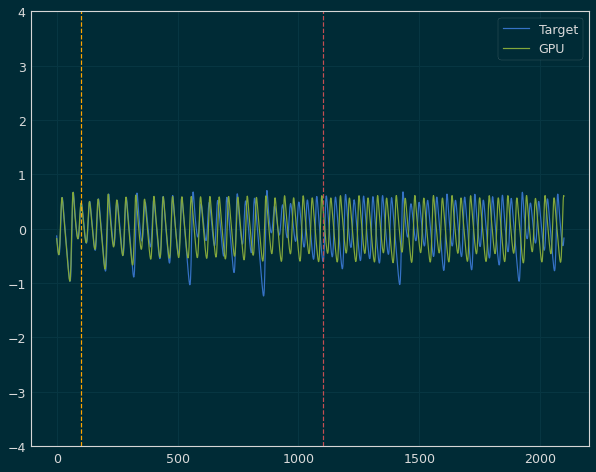

 Iter=63 a=0.689 sr=0.930 amp=1.490  ri=0.327 rr=0.363 loss=0.697368


Iter: 63 #### Diagnostic 0.697368   Time 5.02  Best 0.697 NRMSE 0.186 CD 0.512
Iter: 64 #### Diagnostic 1000.000000   Time 4.42  Best 0.697 NRMSE 1000.000 CD nan
Iter: 65 #### Diagnostic 3.452886   Time 4.26  Best 0.697 NRMSE 2.441 CD 1.011
Iter: 66 #### Diagnostic 1000.000000   Time 4.35  Best 0.697 NRMSE 1000.000 CD nan
Iter: 67 #### Diagnostic 1000.000000   Time 4.45  Best 0.697 NRMSE 1000.000 CD nan
Iter: 68 #### Diagnostic 1000.000000   Time 4.52  Best 0.697 NRMSE 1000.000 CD nan
Iter: 69 #### Diagnostic 1.151422   Time 4.29  Best 0.697 NRMSE 0.214 CD 0.937
Iter: 70 #### Diagnostic 1000.000000   Time 4.26  Best 0.697 NRMSE 1000.000 CD nan
Iter: 71 #### Diagnostic 1000.000000   Time 4.18  Best 0.697 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1.107150   Time 4.24  Best 0.697 NRMSE 0.217 CD 0.890
Iter: 73 #### Diagnostic 1000.000000   Time 4.12  Best 0.697 NRMSE 1000.000 CD nan


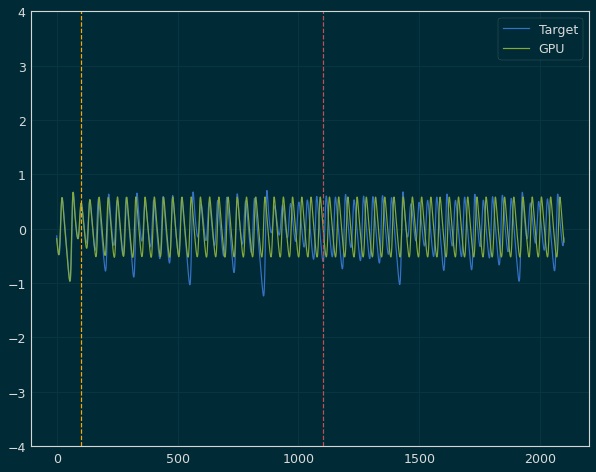

 Iter=74 a=0.671 sr=0.923 amp=1.551  ri=1.971 rr=0.944 loss=0.655441


Iter: 74 #### Diagnostic 0.655441   Time 4.73  Best 0.655 NRMSE 0.175 CD 0.480
Iter: 75 #### Diagnostic 1000.000000   Time 4.37  Best 0.655 NRMSE 1000.000 CD nan
Iter: 76 #### Diagnostic 0.985109   Time 4.31  Best 0.655 NRMSE 0.198 CD 0.787
Iter: 77 #### Diagnostic 0.687974   Time 4.96  Best 0.655 NRMSE 0.180 CD 0.508
Iter: 78 #### Diagnostic 1000.000000   Time 4.39  Best 0.655 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1.163499   Time 4.33  Best 0.655 NRMSE 0.254 CD 0.910
Iter: 80 #### Diagnostic 1000.000000   Time 4.24  Best 0.655 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 0.815855   Time 4.14  Best 0.655 NRMSE 0.193 CD 0.623
Iter: 82 #### Diagnostic 1000.000000   Time 4.28  Best 0.655 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 1000.000000   Time 4.16  Best 0.655 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.000000   Time 4.36  Best 0.655 NRMSE 1000.000 CD nan
Iter: 85 #### Diagnostic 0.738945   

Iter: 69 #### Diagnostic 1000.000000   Time 5.54  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic 1000.000000   Time 5.27  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 71 #### Diagnostic 1000.000000   Time 5.16  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1000.000000   Time 4.25  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 1000.000000   Time 4.89  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 1000.000000   Time 4.56  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 75 #### Diagnostic 0.785136   Time 4.38  Best 1000.000 NRMSE 0.198 CD 0.587
Iter: 76 #### Diagnostic 1000.000000   Time 4.46  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 4.86  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 4.30  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 1000.000000   Time 4.58  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 4.49  Best 100

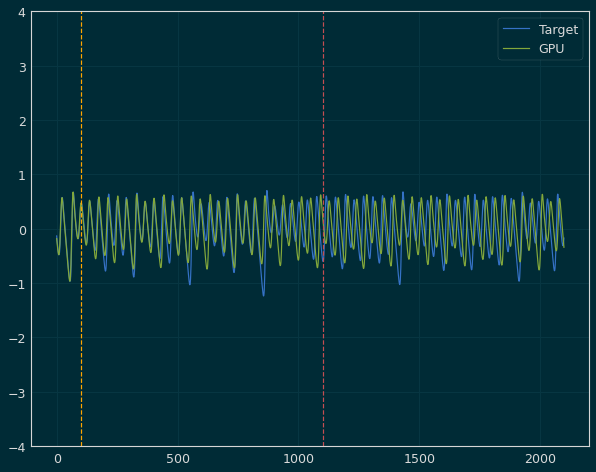

 Iter=96 a=0.660 sr=0.890 amp=1.589  ri=1.231 rr=3.917 loss=0.602921


Iter: 96 #### Diagnostic 0.602921   Time 4.59  Best 0.603 NRMSE 0.167 CD 0.436
Iter: 97 #### Diagnostic 1000.000000   Time 4.31  Best 0.603 NRMSE 1000.000 CD nan
Iter: 98 #### Diagnostic 1.269232   Time 4.60  Best 0.603 NRMSE 0.252 CD 1.017
Iter: 99 #### Diagnostic 1000.000000   Time 4.23  Best 0.603 NRMSE 1000.000 CD nan

Best result = 0.6029214260810671
a = 0.6598173750661253
sr = 0.8900296174584339
amp = 1.5888354098563389
ri = 1.2307367047084448
rr = 3.917107237058328

Best mn:0.555	 mn:0.689
New bounds mn--mx: -0.002---0.007

Best mn:0.825	 mn:0.953
New bounds mn--mx: -0.006--0.019

Best mn:1.421	 mn:1.692
New bounds mn--mx: -0.045---0.006

Best mn:0.327	 mn:2.895
New bounds mn--mx: -0.191--0.214

Best mn:0.142	 mn:3.943
New bounds mn--mx: -0.023---0.252
Refined search bounds:

Alpha (0.5573936089756307, 0.682321941438486)

Rho (0.8310176133830148, 0.9726128284714075)

Gamma (1.465741711729022, 1.68587941416920

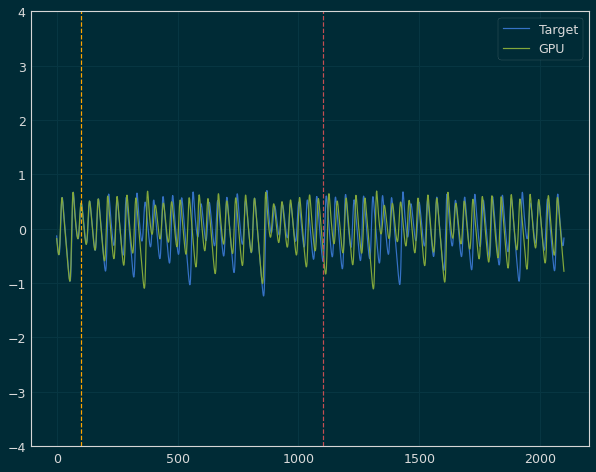

 Iter=70 a=0.691 sr=0.919 amp=1.687  ri=1.723 rr=2.477 loss=0.675976


Iter: 70 #### Diagnostic 0.675976   Time 4.97  Best 0.676 NRMSE 0.177 CD 0.499
Iter: 71 #### Diagnostic 1.100996   Time 4.25  Best 0.676 NRMSE 0.198 CD 0.903
Iter: 72 #### Diagnostic 1000.000000   Time 4.31  Best 0.676 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 1000.000000   Time 4.25  Best 0.676 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 1.552129   Time 4.23  Best 0.676 NRMSE 0.644 CD 0.908
Iter: 75 #### Diagnostic 1000.000000   Time 4.72  Best 0.676 NRMSE 1000.000 CD nan
Iter: 76 #### Diagnostic 1000.000000   Time 4.22  Best 0.676 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.000000   Time 4.63  Best 0.676 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1000.000000   Time 4.60  Best 0.676 NRMSE 7250.890 CD 1.001
Iter: 79 #### Diagnostic 1000.000000   Time 5.35  Best 0.676 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 4.78  Best 0.676 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1

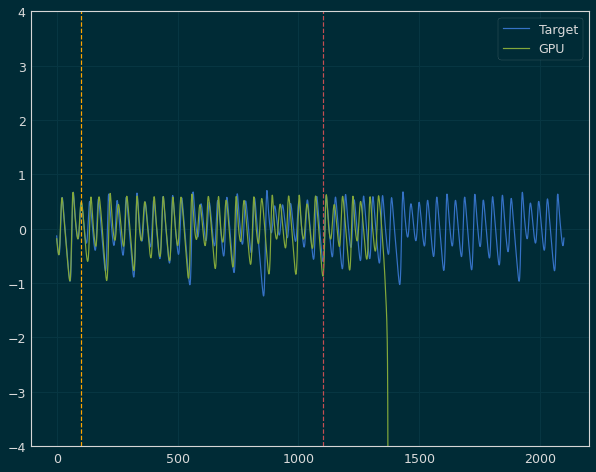

 Iter=54 a=0.619 sr=0.898 amp=1.527  ri=2.706 rr=0.207 loss=0.596928


Iter: 54 #### Diagnostic 0.596928   Time 4.73  Best 0.597 NRMSE 0.166 CD 0.431
Iter: 55 #### Diagnostic 1000.000000   Time 4.22  Best 0.597 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1.120951   Time 4.21  Best 0.597 NRMSE 0.256 CD 0.865
Iter: 57 #### Diagnostic 1000.000000   Time 4.22  Best 0.597 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 4.87  Best 0.597 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1.350841   Time 4.41  Best 0.597 NRMSE 0.245 CD 1.106
Iter: 60 #### Diagnostic 0.758553   Time 4.18  Best 0.597 NRMSE 0.196 CD 0.563
Iter: 61 #### Diagnostic 1000.000000   Time 4.47  Best 0.597 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic 1.513500   Time 4.18  Best 0.597 NRMSE 0.509 CD 1.005
Iter: 63 #### Diagnostic 1.304212   Time 4.10  Best 0.597 NRMSE 0.237 CD 1.067
Iter: 64 #### Diagnostic 1.474033   Time 4.20  Best 0.597 NRMSE 0.473 CD 1.001
Iter: 65 #### Diagnostic 1000.000000   Time 

Iter: 50 #### Diagnostic 1000.000000   Time 4.24  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 51 #### Diagnostic 1000.000000   Time 4.24  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 52 #### Diagnostic 1000.000000   Time 4.65  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 0.749440   Time 4.28  Best 1000.000 NRMSE 0.192 CD 0.558
Iter: 54 #### Diagnostic 1000.000000   Time 4.37  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 55 #### Diagnostic 1000.000000   Time 4.49  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 4.09  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 4.37  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 4.32  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 4.09  Best 1000.000 NRMSE 191404.450 CD 1.057
Iter: 60 #### Diagnostic 1.227112   Time 4.23  Best 1000.000 NRMSE 0.247 CD 0.980
Iter: 61 #### Diagnostic 1000.000000   Time 4.57  Best 100

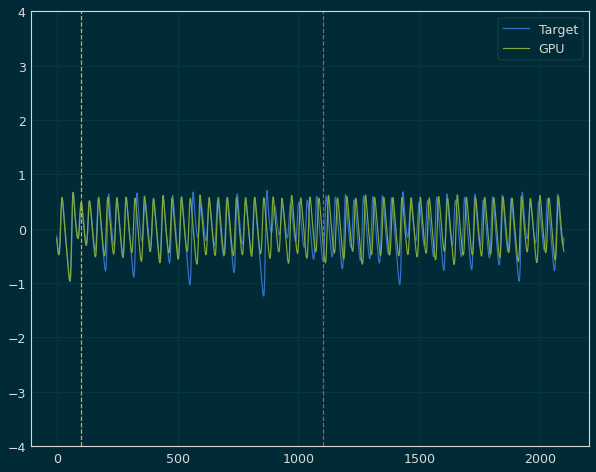

 Iter=22 a=0.603 sr=0.924 amp=1.496  ri=2.541 rr=1.318 loss=0.664392


Iter: 22 #### Diagnostic 0.664392   Time 4.57  Best 0.664 NRMSE 0.171 CD 0.494
Iter: 23 #### Diagnostic 1.096516   Time 4.29  Best 0.664 NRMSE 0.244 CD 0.853
Iter: 24 #### Diagnostic 0.848833   Time 4.32  Best 0.664 NRMSE 0.203 CD 0.645
Iter: 25 #### Diagnostic 0.954300   Time 4.25  Best 0.664 NRMSE 0.223 CD 0.731
Iter: 26 #### Diagnostic 1.385861   Time 4.36  Best 0.664 NRMSE 0.239 CD 1.147
Iter: 27 #### Diagnostic 1000.000000   Time 4.40  Best 0.664 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1.147261   Time 4.09  Best 0.664 NRMSE 0.222 CD 0.926
Iter: 29 #### Diagnostic 1.141080   Time 4.22  Best 0.664 NRMSE 0.230 CD 0.911
Iter: 30 #### Diagnostic 1000.000000   Time 4.21  Best 0.664 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 4.29  Best 0.664 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 4.24  Best 0.664 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 

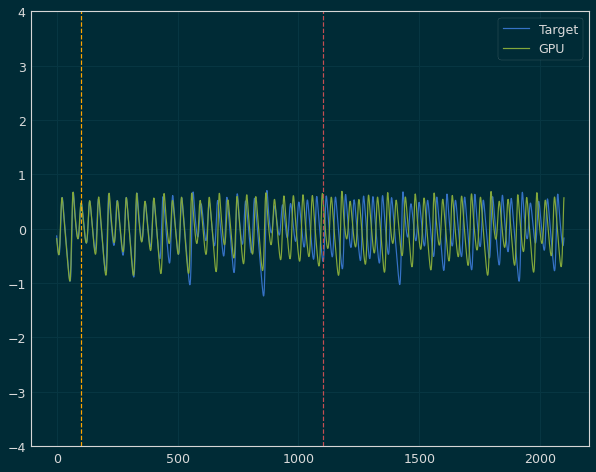

 Iter=11 a=0.585 sr=0.867 amp=1.511  ri=0.874 rr=2.807 loss=0.588902


Iter: 11 #### Diagnostic 0.588902   Time 4.72  Best 0.589 NRMSE 0.172 CD 0.417
Iter: 12 #### Diagnostic 1.336801   Time 4.11  Best 0.589 NRMSE 0.240 CD 1.097


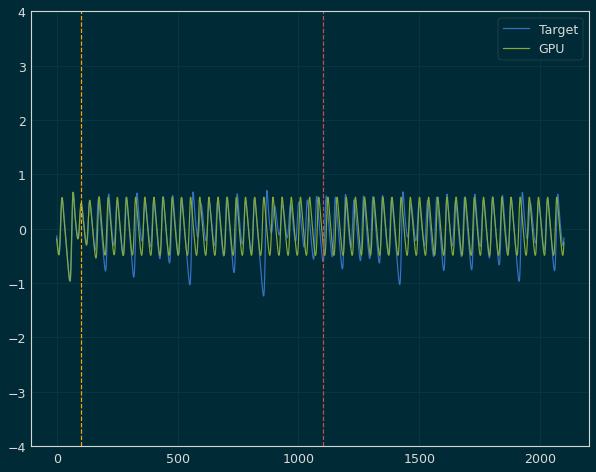

 Iter=13 a=0.563 sr=0.987 amp=1.480  ri=1.406 rr=3.807 loss=0.586623


Iter: 13 #### Diagnostic 0.586623   Time 5.08  Best 0.587 NRMSE 0.159 CD 0.428
Iter: 14 #### Diagnostic 1000.000000   Time 4.30  Best 0.587 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 0.877455   Time 4.42  Best 0.587 NRMSE 0.205 CD 0.672
Iter: 16 #### Diagnostic 1000.000000   Time 4.34  Best 0.587 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 1000.000000   Time 4.40  Best 0.587 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 1000.000000   Time 4.23  Best 0.587 NRMSE 1000.000 CD nan
Iter: 19 #### Diagnostic 1.005570   Time 4.08  Best 0.587 NRMSE 0.233 CD 0.772
Iter: 20 #### Diagnostic 1.054914   Time 4.39  Best 0.587 NRMSE 0.220 CD 0.835
Iter: 21 #### Diagnostic 1000.000000   Time 4.27  Best 0.587 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1.165398   Time 4.16  Best 0.587 NRMSE 0.210 CD 0.956
Iter: 23 #### Diagnostic 1000.000000   Time 4.22  Best 0.587 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1.196670   

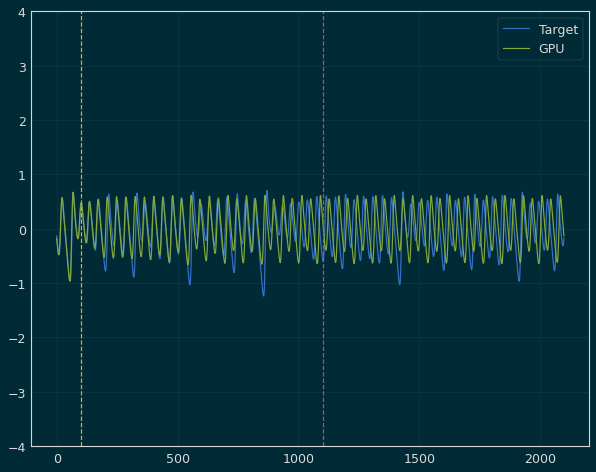

 Iter=1 a=0.584 sr=0.979 amp=1.648  ri=0.372 rr=3.559 loss=0.672137


Iter: 1 #### Diagnostic 0.672137   Time 5.22  Best 0.672 NRMSE 0.179 CD 0.493
Iter: 2 #### Diagnostic 1000.000000   Time 4.21  Best 0.672 NRMSE 1000.000 CD nan
Iter: 3 #### Diagnostic 1.184729   Time 4.26  Best 0.672 NRMSE 0.211 CD 0.974
Iter: 4 #### Diagnostic 1000.000000   Time 4.28  Best 0.672 NRMSE 1000.000 CD nan
Iter: 5 #### Diagnostic 1000.000000   Time 4.45  Best 0.672 NRMSE 1000.000 CD nan
Iter: 6 #### Diagnostic 1000.000000   Time 4.62  Best 0.672 NRMSE 1000.000 CD nan
Iter: 7 #### Diagnostic 1000.000000   Time 4.82  Best 0.672 NRMSE 1000.000 CD nan
Iter: 8 #### Diagnostic 1000.000000   Time 4.39  Best 0.672 NRMSE 1000.000 CD nan
Iter: 9 #### Diagnostic 0.801506   Time 4.42  Best 0.672 NRMSE 0.204 CD 0.598
Iter: 10 #### Diagnostic 1.524713   Time 4.24  Best 0.672 NRMSE 0.528 CD 0.997
Iter: 11 #### Diagnostic 1000.000000   Time 4.79  Best 0.672 NRMSE 1000.000 CD nan
Iter: 12 #### Diagnostic 0.879251   Time 4

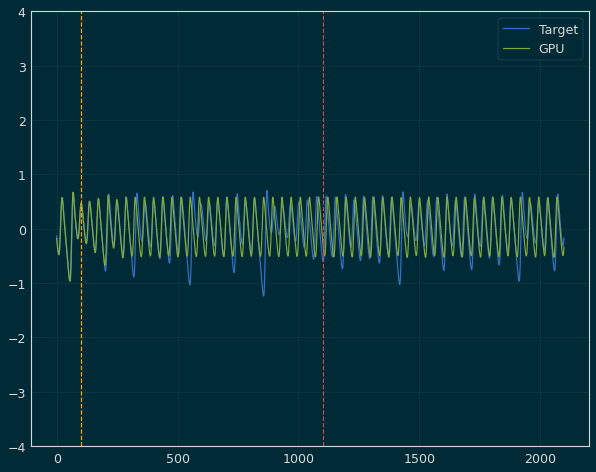

 Iter=13 a=0.558 sr=0.930 amp=1.412  ri=0.913 rr=1.830 loss=0.617766


Iter: 13 #### Diagnostic 0.617766   Time 4.55  Best 0.618 NRMSE 0.165 CD 0.453
Iter: 14 #### Diagnostic 1000.000000   Time 4.67  Best 0.618 NRMSE 1000.000 CD nan
Iter: 15 #### Diagnostic 1000.000000   Time 4.73  Best 0.618 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 0.708993   Time 4.86  Best 0.618 NRMSE 0.180 CD 0.529
Iter: 17 #### Diagnostic 1000.000000   Time 4.73  Best 0.618 NRMSE 1000.000 CD nan
Iter: 18 #### Diagnostic 0.875304   Time 4.41  Best 0.618 NRMSE 0.201 CD 0.674
Iter: 19 #### Diagnostic 2.720049   Time 4.51  Best 0.618 NRMSE 1.821 CD 0.900
Iter: 20 #### Diagnostic 0.966965   Time 4.76  Best 0.618 NRMSE 0.227 CD 0.740
Iter: 21 #### Diagnostic 1000.000000   Time 4.66  Best 0.618 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 4.16  Best 0.618 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 4.26  Best 0.618 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 0.817762   

Iter: 10 #### Diagnostic 1000.000000   Time 4.25  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 11 #### Diagnostic 10.332278   Time 4.14  Best 1000.000 NRMSE 9.309 CD 1.024
Iter: 12 #### Diagnostic 1000.000000   Time 4.37  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 13 #### Diagnostic 1000.000000   Time 4.69  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 14 #### Diagnostic 1000.000000   Time 4.04  Best 1000.000 NRMSE 1412.841 CD 1.011
Iter: 15 #### Diagnostic 1000.000000   Time 4.24  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 16 #### Diagnostic 1000.000000   Time 4.09  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 17 #### Diagnostic 0.727804   Time 4.13  Best 1000.000 NRMSE 0.188 CD 0.540
Iter: 18 #### Diagnostic 1.456730   Time 4.27  Best 1000.000 NRMSE 0.475 CD 0.982
Iter: 19 #### Diagnostic 1000.000000   Time 4.12  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 20 #### Diagnostic 1000.000000   Time 4.21  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 21 #### Diagnostic 1000.000000   Time 4.24  Best 1000.000

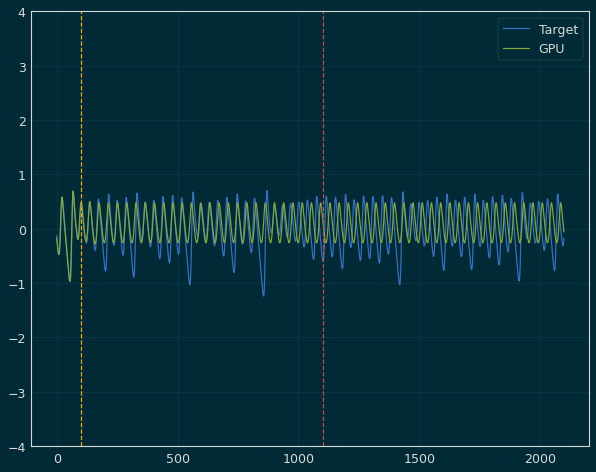

 Iter=24 a=0.595 sr=0.993 amp=1.576  ri=3.316 rr=2.529 loss=0.654025


Iter: 24 #### Diagnostic 0.654025   Time 5.03  Best 0.654 NRMSE 0.157 CD 0.497
Iter: 25 #### Diagnostic 0.881787   Time 4.38  Best 0.654 NRMSE 0.215 CD 0.666
Iter: 26 #### Diagnostic 1000.000000   Time 4.52  Best 0.654 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 4.06  Best 0.654 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 4.87  Best 0.654 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1000.000000   Time 4.75  Best 0.654 NRMSE 1000.000 CD nan
Iter: 30 #### Diagnostic 1000.000000   Time 4.04  Best 0.654 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 4.24  Best 0.654 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1000.000000   Time 4.25  Best 0.654 NRMSE 1000.000 CD nan
Iter: 33 #### Diagnostic 1000.000000   Time 4.14  Best 0.654 NRMSE 24238.420 CD 1.008
Iter: 34 #### Diagnostic 1000.000000   Time 4.38  Best 0.654 NRMSE 1000.000 CD nan
Iter: 35 #### Diagnos

Iter: 21 #### Diagnostic 1000.000000   Time 4.08  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 22 #### Diagnostic 1000.000000   Time 4.37  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 23 #### Diagnostic 1000.000000   Time 4.78  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 24 #### Diagnostic 1000.000000   Time 4.08  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 25 #### Diagnostic 1.425096   Time 4.11  Best 1000.000 NRMSE 0.408 CD 1.017
Iter: 26 #### Diagnostic 1000.000000   Time 4.32  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 27 #### Diagnostic 1000.000000   Time 4.08  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 28 #### Diagnostic 1000.000000   Time 4.24  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 29 #### Diagnostic 1.530981   Time 4.26  Best 1000.000 NRMSE 0.533 CD 0.998
Iter: 30 #### Diagnostic 1000.000000   Time 4.54  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 31 #### Diagnostic 1000.000000   Time 4.34  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 32 #### Diagnostic 1.745816   Time 4.55  Best 1000.000 N

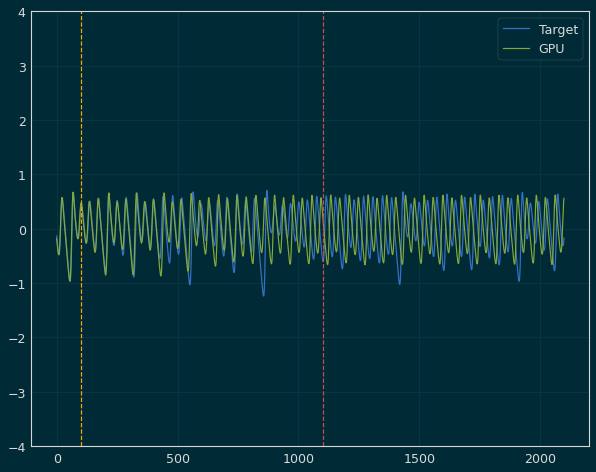

 Iter=73 a=0.622 sr=0.845 amp=1.630  ri=0.244 rr=0.677 loss=0.661546


Iter: 73 #### Diagnostic 0.661546   Time 4.45  Best 0.662 NRMSE 0.179 CD 0.482
Iter: 74 #### Diagnostic 1000.000000   Time 4.24  Best 0.662 NRMSE 1000.000 CD nan
Iter: 75 #### Diagnostic 1000.000000   Time 4.06  Best 0.662 NRMSE 1000.000 CD nan
Iter: 76 #### Diagnostic 1.169353   Time 4.13  Best 0.662 NRMSE 0.195 CD 0.974
Iter: 77 #### Diagnostic 1000.000000   Time 4.21  Best 0.662 NRMSE 1000.000 CD nan
Iter: 78 #### Diagnostic 1.147167   Time 4.52  Best 0.662 NRMSE 0.217 CD 0.931
Iter: 79 #### Diagnostic 1000.000000   Time 4.13  Best 0.662 NRMSE 1000.000 CD nan
Iter: 80 #### Diagnostic 1000.000000   Time 4.09  Best 0.662 NRMSE 1000.000 CD nan
Iter: 81 #### Diagnostic 1.042364   Time 4.34  Best 0.662 NRMSE 0.207 CD 0.835
Iter: 82 #### Diagnostic 1000.000000   Time 4.27  Best 0.662 NRMSE 1000.000 CD nan
Iter: 83 #### Diagnostic 1000.000000   Time 4.12  Best 0.662 NRMSE 1000.000 CD nan
Iter: 84 #### Diagnostic 1000.00

Iter: 68 #### Diagnostic 1000.000000   Time 4.17  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 69 #### Diagnostic 1000.000000   Time 4.40  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic 1000.000000   Time 4.25  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 71 #### Diagnostic 1000.000000   Time 4.23  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1000.000000   Time 4.31  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 1000.000000   Time 4.53  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 74 #### Diagnostic 1.454192   Time 4.06  Best 1000.000 NRMSE 0.468 CD 0.986
Iter: 75 #### Diagnostic 1000.000000   Time 4.12  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 76 #### Diagnostic 1000.000000   Time 4.35  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1.251311   Time 4.37  Best 1000.000 NRMSE 0.225 CD 1.027
Iter: 78 #### Diagnostic 1000.000000   Time 4.22  Best 1000.000 NRMSE 1000.000 CD nan
Iter: 79 #### Diagnostic 0.891866   Time 4.13  Best 1000.000 N

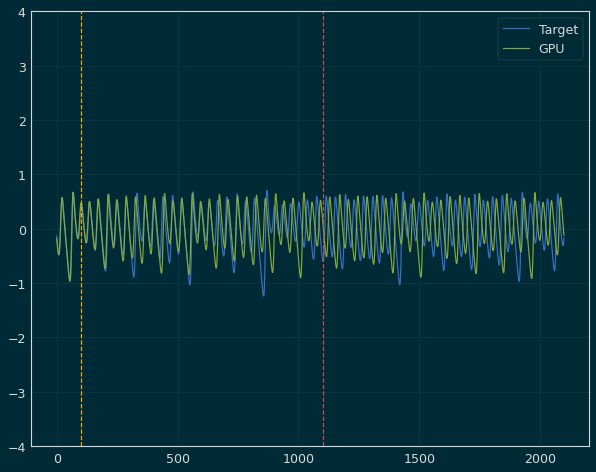

 Iter=51 a=0.554 sr=0.815 amp=1.468  ri=0.277 rr=3.052 loss=0.696241


Iter: 51 #### Diagnostic 0.696241   Time 4.27  Best 0.696 NRMSE 0.184 CD 0.512
Iter: 52 #### Diagnostic 1000.000000   Time 4.05  Best 0.696 NRMSE 1000.000 CD nan
Iter: 53 #### Diagnostic 1000.000000   Time 4.02  Best 0.696 NRMSE 1000.000 CD nan
Iter: 54 #### Diagnostic 1.072663   Time 4.06  Best 0.696 NRMSE 0.235 CD 0.838
Iter: 55 #### Diagnostic 1000.000000   Time 4.25  Best 0.696 NRMSE 1000.000 CD nan
Iter: 56 #### Diagnostic 1000.000000   Time 4.21  Best 0.696 NRMSE 1000.000 CD nan
Iter: 57 #### Diagnostic 1000.000000   Time 4.20  Best 0.696 NRMSE 1000.000 CD nan
Iter: 58 #### Diagnostic 1000.000000   Time 4.02  Best 0.696 NRMSE 1000.000 CD nan
Iter: 59 #### Diagnostic 1000.000000   Time 4.07  Best 0.696 NRMSE 1000.000 CD nan
Iter: 60 #### Diagnostic 1000.000000   Time 3.98  Best 0.696 NRMSE 1000.000 CD nan
Iter: 61 #### Diagnostic 1000.000000   Time 4.02  Best 0.696 NRMSE 1000.000 CD nan
Iter: 62 #### Diagnostic

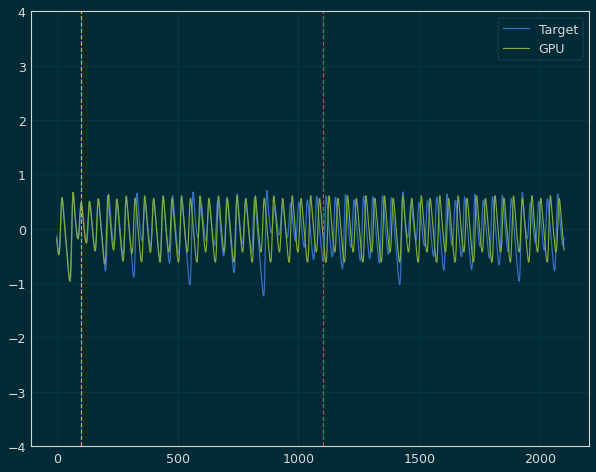

 Iter=66 a=0.652 sr=0.936 amp=1.554  ri=2.083 rr=0.462 loss=0.670859


Iter: 66 #### Diagnostic 0.670859   Time 4.29  Best 0.671 NRMSE 0.174 CD 0.497
Iter: 67 #### Diagnostic 1.184089   Time 3.98  Best 0.671 NRMSE 0.197 CD 0.987
Iter: 68 #### Diagnostic 0.830684   Time 3.92  Best 0.671 NRMSE 0.203 CD 0.627
Iter: 69 #### Diagnostic 1000.000000   Time 3.97  Best 0.671 NRMSE 1000.000 CD nan
Iter: 70 #### Diagnostic 1000.000000   Time 4.01  Best 0.671 NRMSE 1000.000 CD nan
Iter: 71 #### Diagnostic 1000.000000   Time 4.08  Best 0.671 NRMSE 1000.000 CD nan
Iter: 72 #### Diagnostic 1000.000000   Time 3.95  Best 0.671 NRMSE 1000.000 CD nan
Iter: 73 #### Diagnostic 2.133873   Time 3.97  Best 0.671 NRMSE 1.146 CD 0.988
Iter: 74 #### Diagnostic 1000.000000   Time 4.00  Best 0.671 NRMSE 1000.000 CD nan
Iter: 75 #### Diagnostic 1000.000000   Time 4.06  Best 0.671 NRMSE 1000.000 CD nan
Iter: 76 #### Diagnostic 1000.000000   Time 4.03  Best 0.671 NRMSE 1000.000 CD nan
Iter: 77 #### Diagnostic 1000.00

In [5]:
CALLS = 100
s = torch.torch.from_numpy(signal).cuda(DEVICE).type(dtype)
# Skipped 1000
size = [300,200,100,50]
rand_state = [11,37,3,24,91]

for N in size:
    min_a, max_a = .55, .7
    min_sr, max_sr = .8, 1.
    min_g, max_g = 1.4, 1.7
    min_ri, max_ri = .001, 4.
    min_rr, max_rr = .001, 4.
    space = [Real(min_a, max_a, name='a'),
                     Real(min_sr, max_sr, name='sr'),
                     Real(min_g, max_g, name='amp'), 
                     Real(min_ri, max_ri, name='ri'),
                     Real(min_rr, max_rr, name='rr')
                    ]
    for ref in range(5):
        start = time.time()
        alphas = []
        rhos = []
        gammas = []
        inScales = []
        resScales = []
        
        for rn in range(5):
            running_error = 1000
            counter = 0 
            print(f'********** Size {N} -- Run {rn} ***********')
            result_gp = gp_minimize(loop,
                                    space,
                                    n_calls=CALLS,
                                    random_state=rand_state[rn],
                                    n_jobs=-1,
                                    n_initial_points=100)
            print(f'\nBest result = {result_gp.fun}')
            names = ['a','sr','amp','ri','rr']
            for i in range(len(space)):
                print(f'{names[i]} = {result_gp.x[i]}')
                
        min_a, max_a   = resize_spaces(min_a, max_a,
                                       np.array(alphas),
                                       isAlpha=True)
        min_sr, max_sr = resize_spaces(min_sr, max_sr, np.array(rhos))
        min_g, max_g   = resize_spaces(min_g, max_g, np.array(gammas))
        min_ri, max_ri = resize_spaces(min_ri, max_ri, np.array(inScales))
        min_rr, max_rr = resize_spaces(min_rr, max_rr, np.array(resScales))
        print('Refined search bounds:\n')
        print(f'Alpha ({min_a}, {max_a})\n')
        print(f'Rho ({min_sr}, {max_sr})\n')
        print(f'Gamma ({min_g}, {max_g})\n')
        print(f'r-in ({min_ri}, {max_ri})\n')
        print(f'r-res ({min_rr}, {max_rr})\n')
        end = time.time()-start
        print(f'End Refinement Run {ref} Time {end:.3f}')